In [1]:
import pandas as pd
import numpy as np
import os
import sys
from pathlib import Path
from glob import glob

import cv2
import skimage
import matplotlib.pyplot as plt

BACKEND = Path(os.getcwd()).parent
sys.path.append(str(BACKEND))
from test_app import test_ceare_file_model

/home/badboy-002/anaconda3/envs/senior_env/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2023-04-27 16:57:25.172539: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


Segmentation Models: using `tf.keras` framework.


2023-04-27 16:57:25.859593: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-04-27 16:57:25.862690: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-04-27 16:57:25.862775: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero


In [2]:
# get test images path
cp_folder = str(BACKEND / 'cell_profiler_features_result')
print(cp_folder)
print(os.path.join(cp_folder, '**/*.csv'))
cp_results = glob(os.path.join(cp_folder, 'test/**/*.tif.csv'), recursive=True)
print(cp_results[:3])

/home/badboy-002/github/senior_project/web-app/backend/cell_profiler_features_result
/home/badboy-002/github/senior_project/web-app/backend/cell_profiler_features_result/**/*.csv
['/home/badboy-002/github/senior_project/web-app/backend/cell_profiler_features_result/test/Kanamycin/20221228_TS008_1hr_1mindye_KAN_1x_22_R3D_D3D_CRC-1.tif (RGB).tif.csv', '/home/badboy-002/github/senior_project/web-app/backend/cell_profiler_features_result/test/Kanamycin/20230109_TS008_1hr_1mindye_Kan_1x_25_R3D_D3D_CRC-1.tif (RGB).tif.csv', '/home/badboy-002/github/senior_project/web-app/backend/cell_profiler_features_result/test/Kanamycin/20230109_TS008_1hr_1mindye_Kan_1x_19_R3D_D3D_CRC-1.tif (RGB).tif.csv']


In [3]:
test_img_paths = [cp_res.split("/")[-1].split(" (RGB)")[0] for cp_res in cp_results]
print(test_img_paths[:3])

['20221228_TS008_1hr_1mindye_KAN_1x_22_R3D_D3D_CRC-1.tif', '20230109_TS008_1hr_1mindye_Kan_1x_25_R3D_D3D_CRC-1.tif', '20230109_TS008_1hr_1mindye_Kan_1x_19_R3D_D3D_CRC-1.tif']


In [4]:
folder_dir = str(BACKEND / 'resource' / 'features_extraction_results')
img_folder_path = Path(os.getcwd()).parents[2] / "bacteria_img_jbing"

In [5]:
len(test_img_paths)

83

In [6]:
test_img_paths[38]

'20221011_TS008_1hr_1mindye_TET_5x_11_R3D_D3D_CRC-1.tif'

0 20221228_TS008_1hr_1mindye_KAN_1x_22_R3D_D3D_CRC-1.tif


2023-04-27 16:57:26.713805: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-27 16:57:26.714436: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-04-27 16:57:26.714543: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-04-27 16:57:26.714589: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA

image input dtype uint16


/home/badboy-002/anaconda3/envs/senior_env/lib/python3.9/site-packages/tensorflow/python/data/ops/structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(
2023-04-27 16:57:55.859657: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8100
2023-04-27 16:57:56.846662: I tensorflow/stream_executor/cuda/cuda_blas.cc:1786] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


1/1 [==============================] - 4s 4s/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv_bn_bias, ema_backbone_stage1_1_main_conv_bn_running_mean, ema_backbone_stage1_1_main_conv_bn_running_var, ema_backbone_stage1_1_main_conv_bn_

/home/badboy-002/anaconda3/envs/senior_env/lib/python3.9/site-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/home/badboy-002/anaconda3/envs/senior_env/lib/python3.9/site-packages/mmcv/cnn/bricks/hsigmoid.py:36: UserWarning: In MMCV v1.4.4, we modified the default value of args to align with PyTorch official. Previous Implementation: Hsigmoid(x) = min(max((x + 1) / 2, 0), 1). Current Implementation: Hsigmoid(x) = min(max((x + 3) / 6, 0), 1).
  warnings.warn(


load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_50/best_bbox_mAP_epoch_58.pth


/home/badboy-002/anaconda3/envs/senior_env/lib/python3.9/site-packages/mmdet/datasets/utils.py:66: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  warnings.warn(


load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


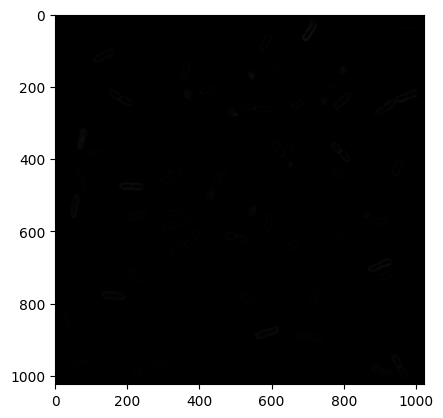

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 16:58:13.334 | INFO     | test_app:test_ceare_file_model:186 - (61, 21)
2023-04-27 16:58:13.353 | INFO     | test_app:test_ceare_file_model:206 - features shape (61, 22)


image dtype: uint16
final result shape:  (61, 21)
finish
1 20230109_TS008_1hr_1mindye_Kan_1x_25_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 58ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv_

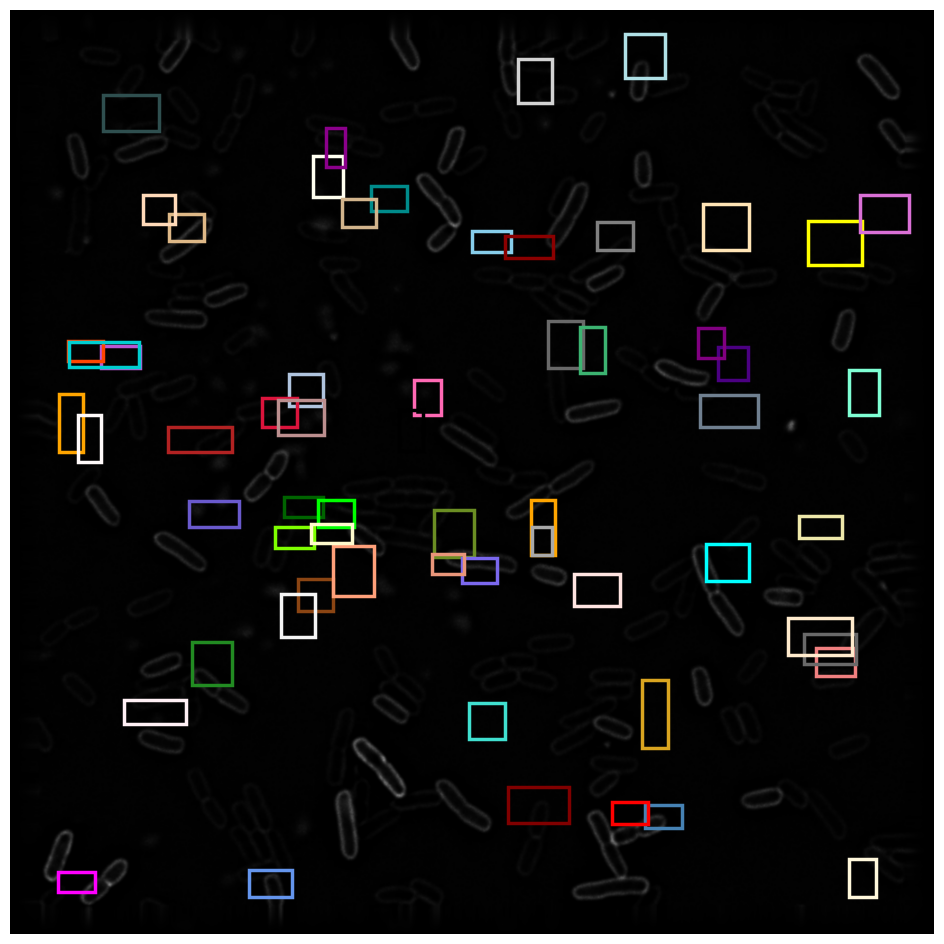

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 16:59:00.915 | INFO     | test_app:test_ceare_file_model:186 - (119, 21)
2023-04-27 16:59:00.945 | INFO     | test_app:test_ceare_file_model:206 - features shape (119, 22)


image dtype: uint16
final result shape:  (119, 21)
finish
2 20230109_TS008_1hr_1mindye_Kan_1x_19_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 57ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv

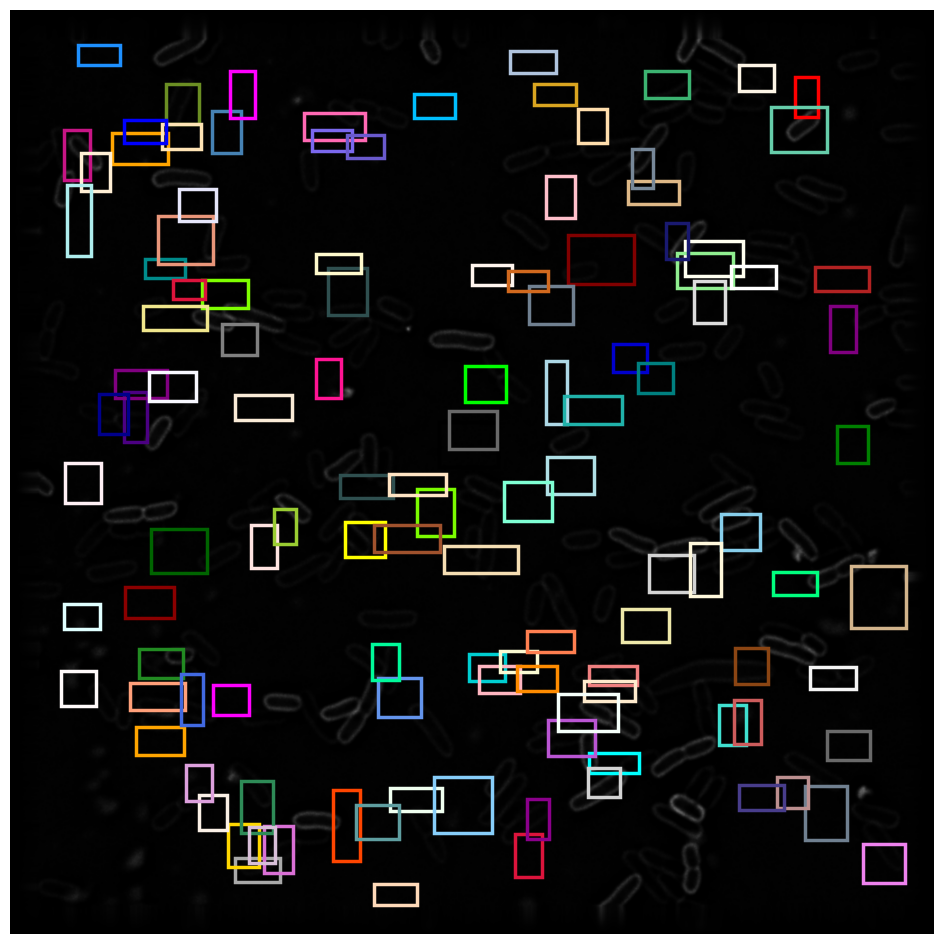

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 16:59:47.889 | INFO     | test_app:test_ceare_file_model:186 - (116, 21)
2023-04-27 16:59:47.921 | INFO     | test_app:test_ceare_file_model:206 - features shape (116, 22)


image dtype: uint16
final result shape:  (116, 21)
finish
3 20230110_TS008_1hr_1mindye_Kan_1x_16_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 57ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv

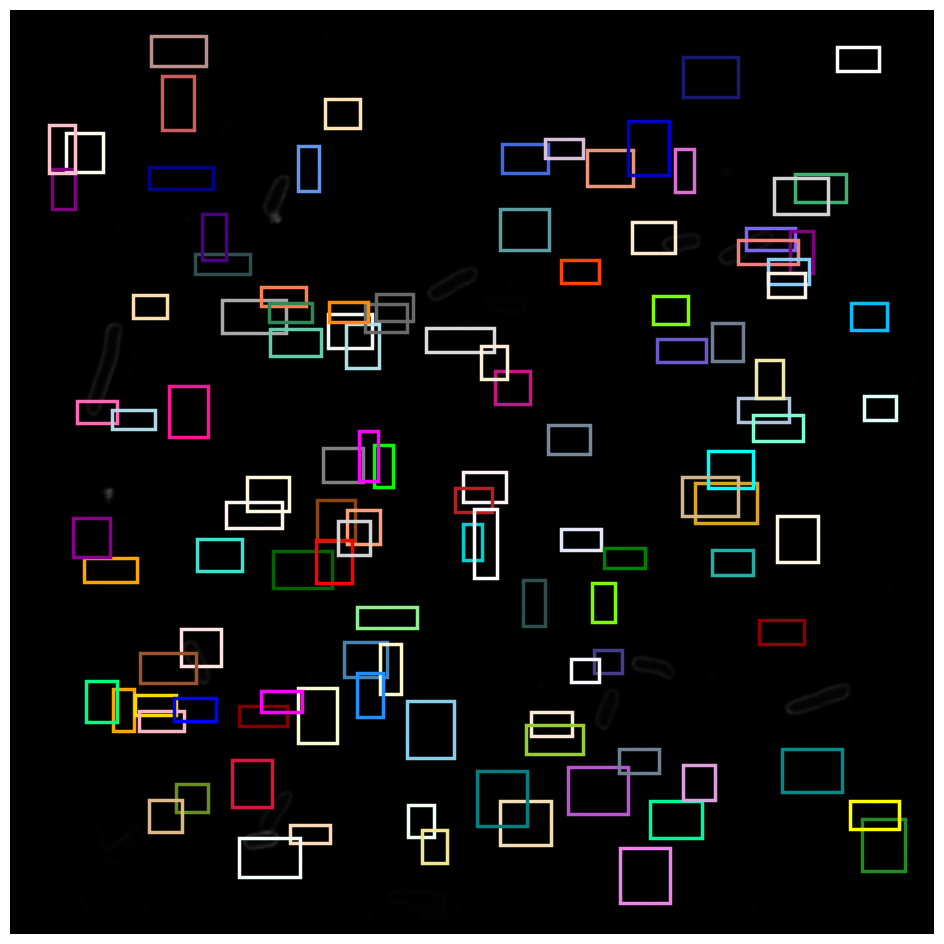

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:00:32.808 | INFO     | test_app:test_ceare_file_model:186 - (18, 21)
2023-04-27 17:00:32.824 | INFO     | test_app:test_ceare_file_model:206 - features shape (18, 22)


image dtype: uint16
final result shape:  (18, 21)
finish
4 20221228_TS008_1hr_1mindye_KAN_1x_47_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 56ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv_

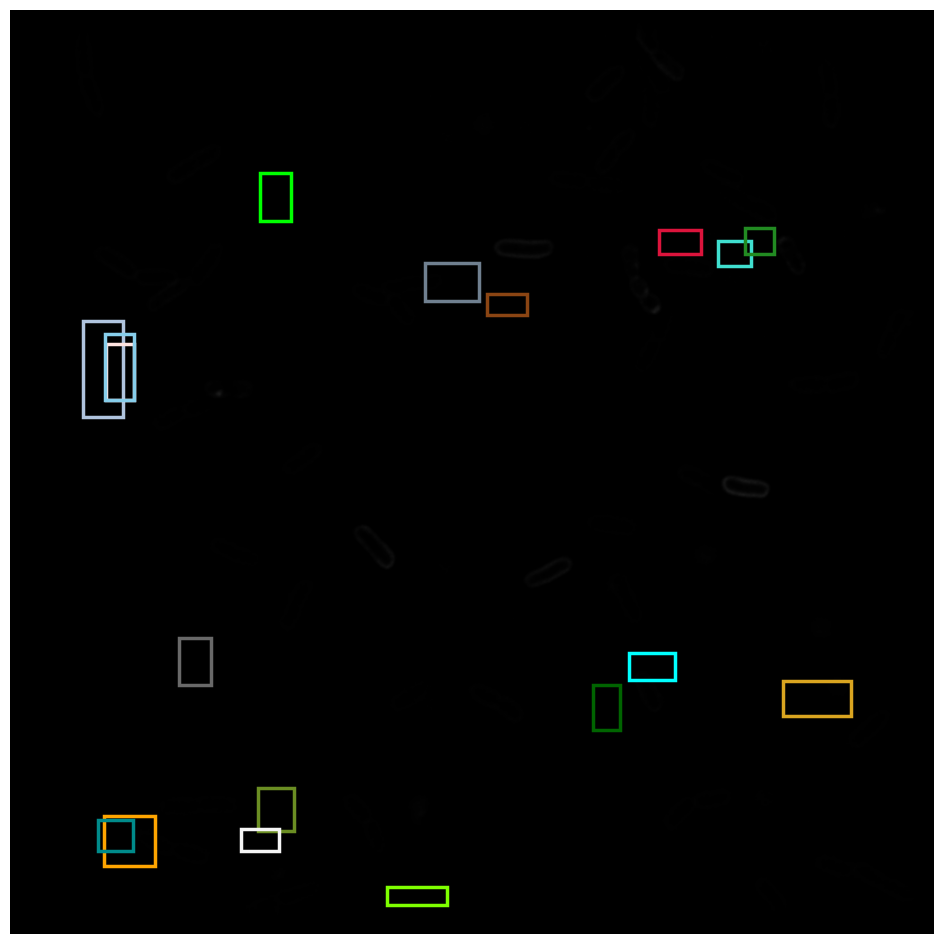

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:01:18.464 | INFO     | test_app:test_ceare_file_model:186 - (58, 21)
2023-04-27 17:01:18.483 | INFO     | test_app:test_ceare_file_model:206 - features shape (58, 22)


image dtype: uint16
final result shape:  (58, 21)
finish
5 20230109_TS008_1hr_1mindye_Kan_1x_24_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 56ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv_

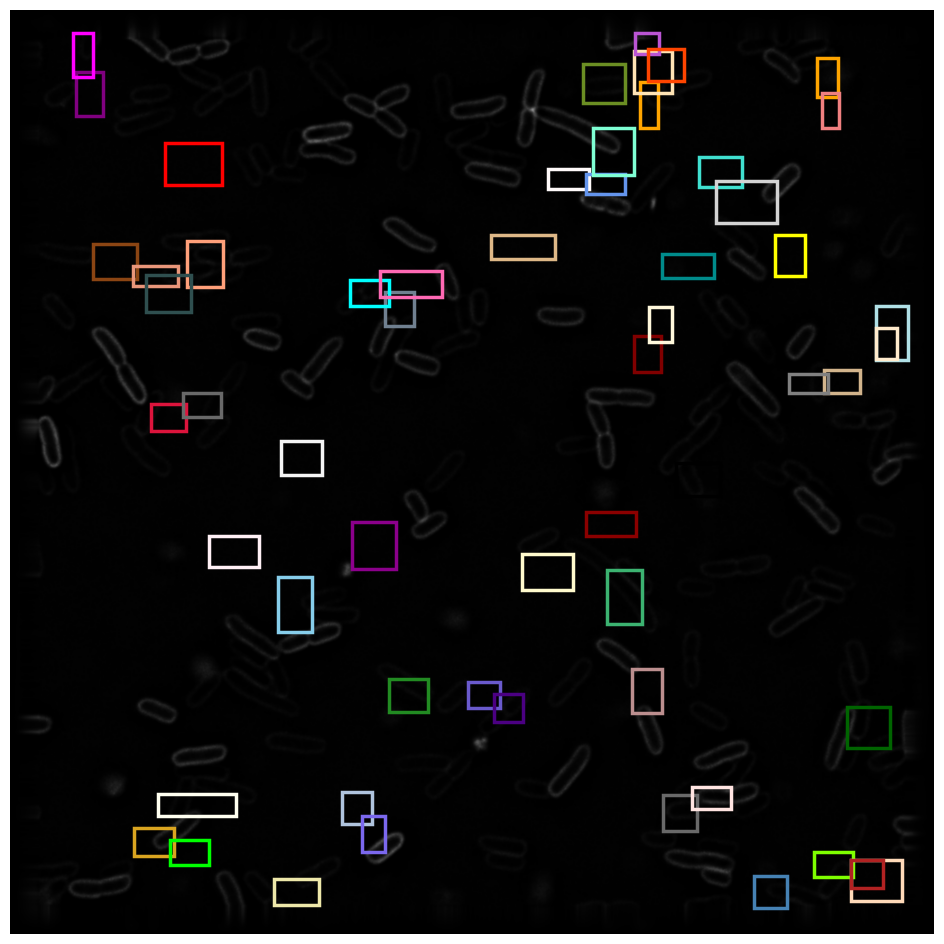

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:02:05.523 | INFO     | test_app:test_ceare_file_model:186 - (113, 21)
2023-04-27 17:02:05.550 | INFO     | test_app:test_ceare_file_model:206 - features shape (113, 22)


image dtype: uint16
final result shape:  (113, 21)
finish
6 20221228_TS008_1hr_1mindye_KAN_1x_43_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 56ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv

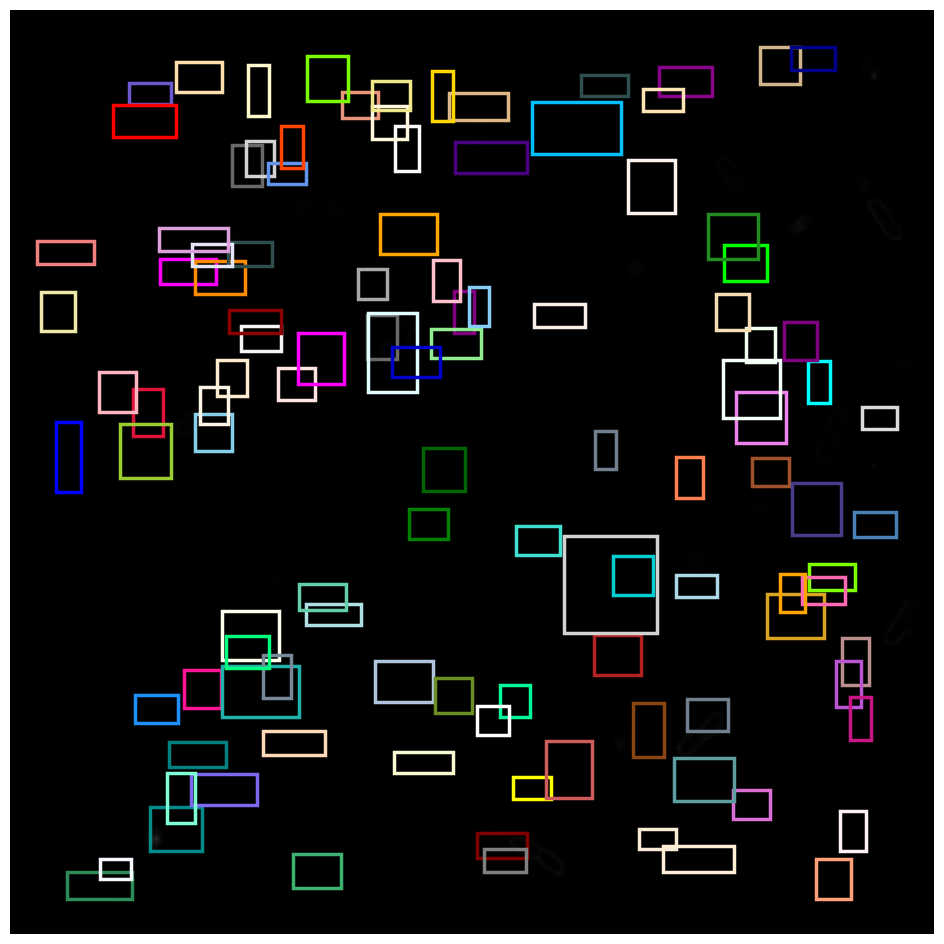

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:02:51.352 | INFO     | test_app:test_ceare_file_model:186 - (57, 21)
2023-04-27 17:02:51.370 | INFO     | test_app:test_ceare_file_model:206 - features shape (57, 22)


image dtype: uint16
final result shape:  (57, 21)
finish
7 20230110_TS008_1hr_1mindye_Kan_1x_05_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 57ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv_

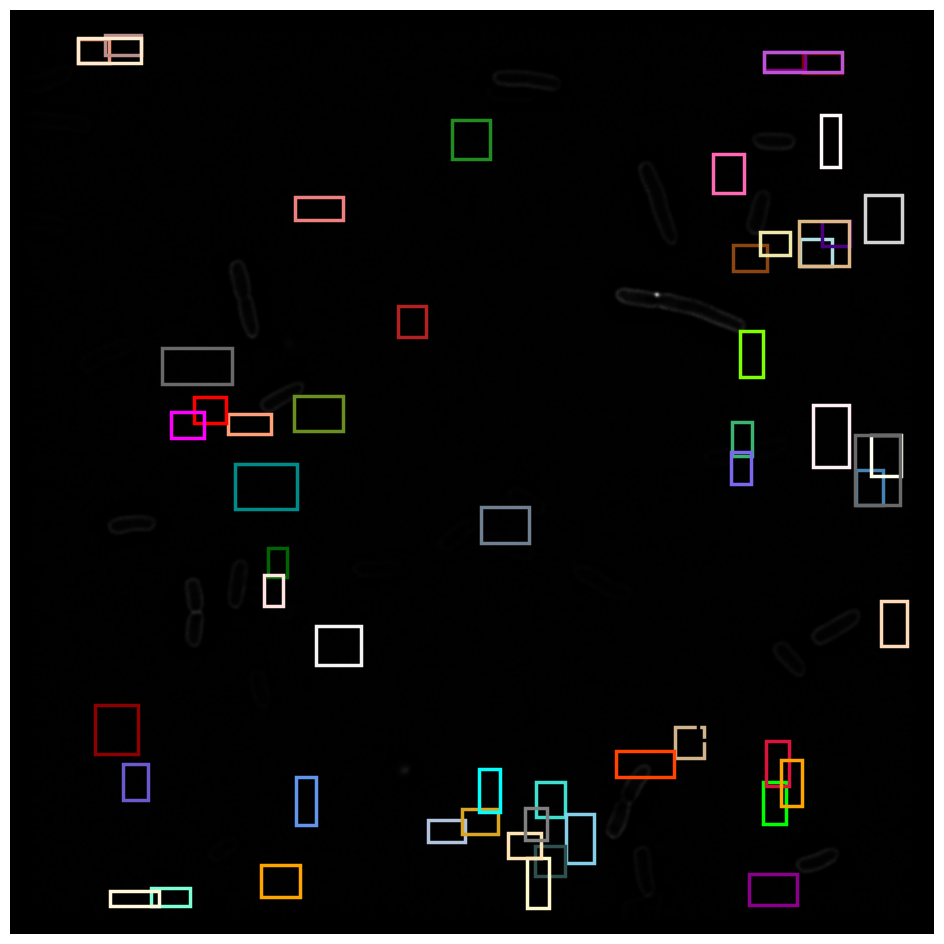

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:03:36.641 | INFO     | test_app:test_ceare_file_model:186 - (35, 21)
2023-04-27 17:03:36.659 | INFO     | test_app:test_ceare_file_model:206 - features shape (35, 22)


image dtype: uint16
final result shape:  (35, 21)
finish
8 20221228_TS008_1hr_1mindye_KAN_1x_50_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 56ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv_

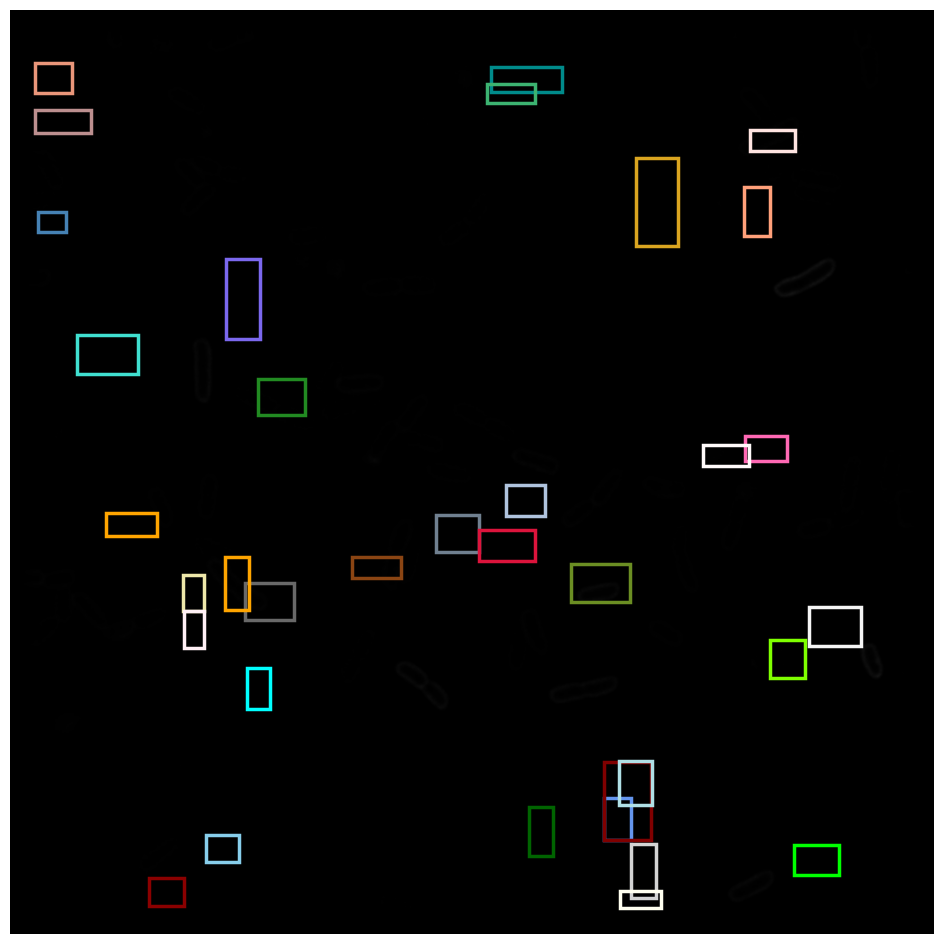

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:04:22.874 | INFO     | test_app:test_ceare_file_model:186 - (72, 21)
2023-04-27 17:04:22.894 | INFO     | test_app:test_ceare_file_model:206 - features shape (72, 22)


image dtype: uint16
final result shape:  (72, 21)
finish
9 20230110_TS008_1hr_1mindye_Kan_1x_19_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 56ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv_

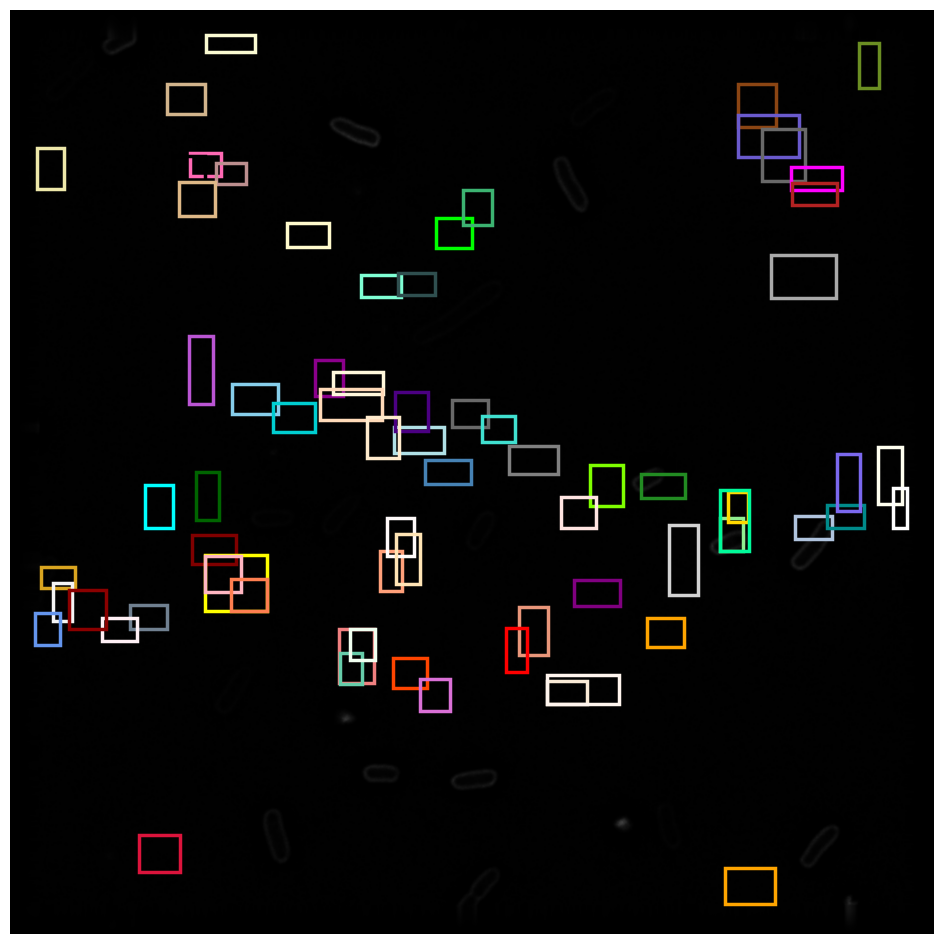

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:05:07.848 | INFO     | test_app:test_ceare_file_model:186 - (22, 21)
2023-04-27 17:05:07.865 | INFO     | test_app:test_ceare_file_model:206 - features shape (22, 22)


image dtype: uint16
final result shape:  (22, 21)
finish
10 20221011_TS008_1hr_1mindye_untreated_13_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 56ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_c

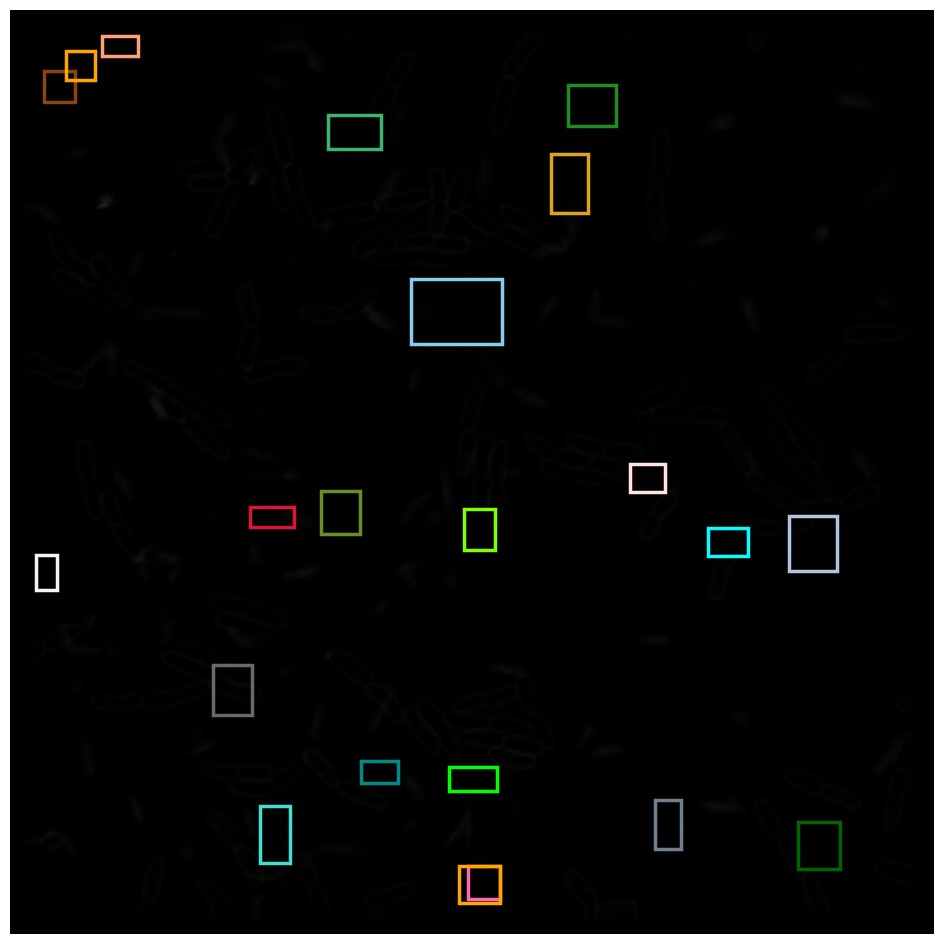

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:05:54.948 | INFO     | test_app:test_ceare_file_model:186 - (110, 21)
2023-04-27 17:05:54.971 | INFO     | test_app:test_ceare_file_model:206 - features shape (110, 22)


image dtype: uint16
final result shape:  (110, 21)
finish
11 20220916_TS008_1hr_1mindye_untreated_12_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 57ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_

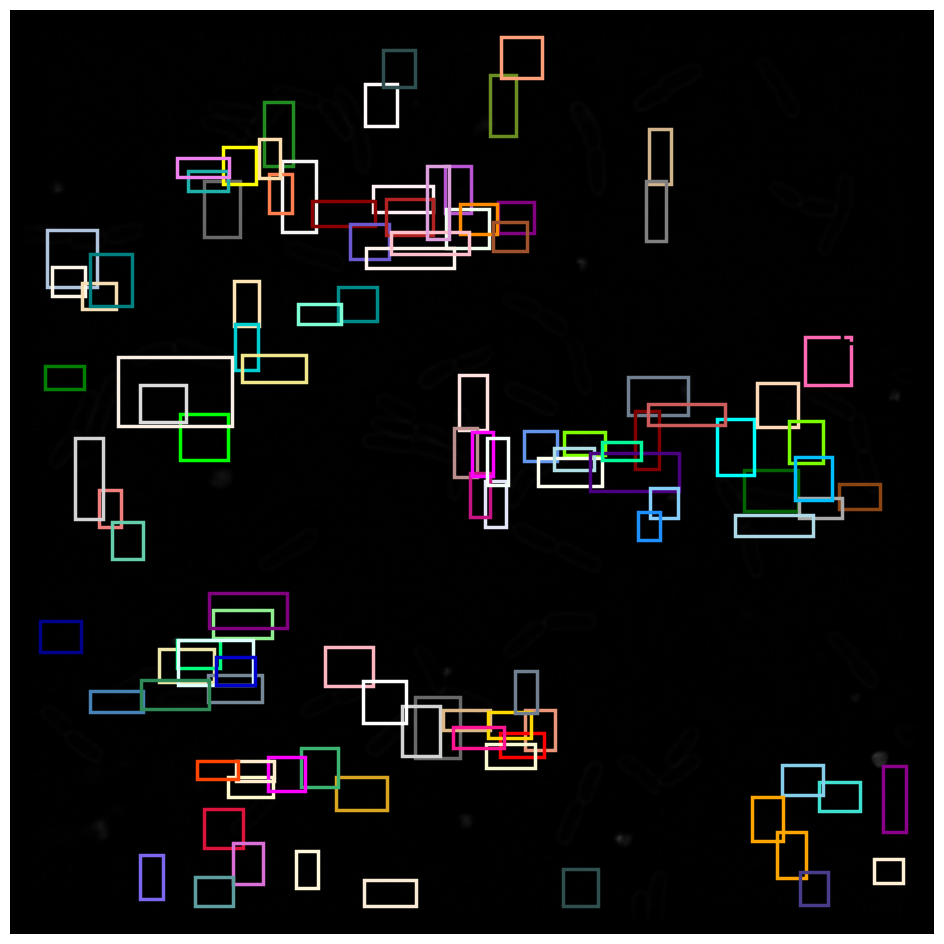

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:06:41.238 | INFO     | test_app:test_ceare_file_model:186 - (71, 21)
2023-04-27 17:06:41.258 | INFO     | test_app:test_ceare_file_model:206 - features shape (71, 22)


image dtype: uint16
final result shape:  (71, 21)
finish
12 20221012_TS008_1hr_1mindye_untreated_03_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 56ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_c

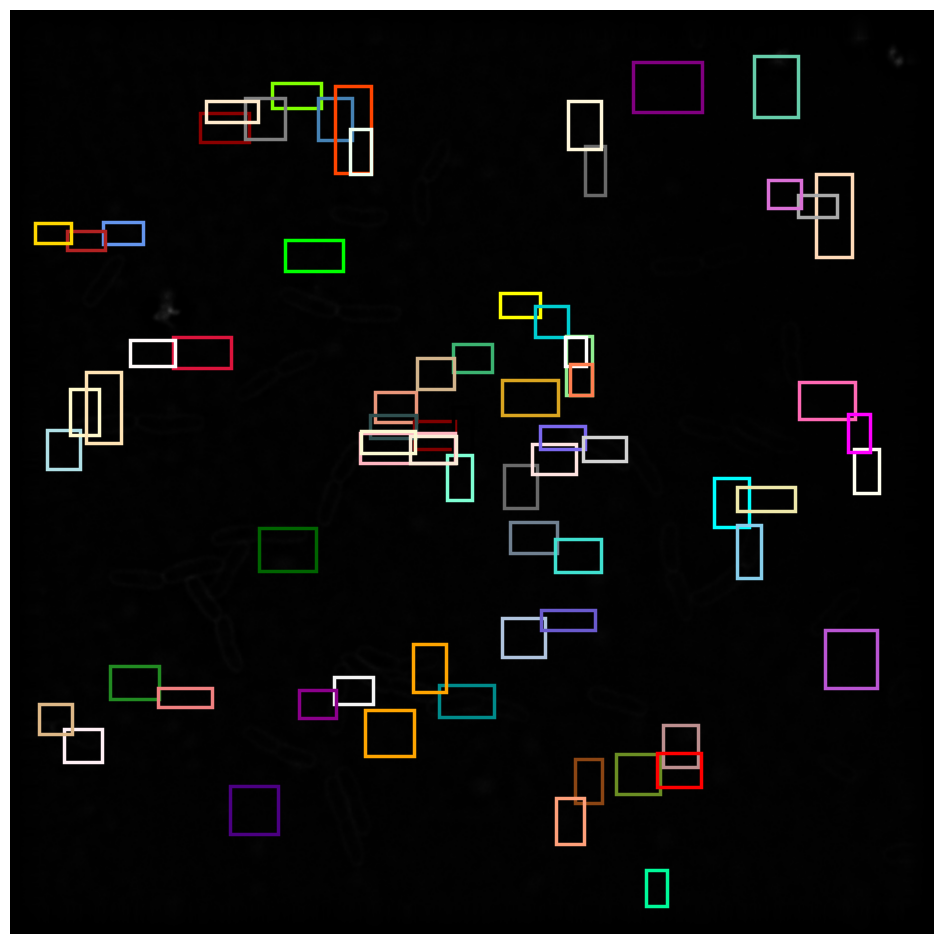

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:07:26.955 | INFO     | test_app:test_ceare_file_model:186 - (53, 21)
2023-04-27 17:07:26.982 | INFO     | test_app:test_ceare_file_model:206 - features shape (53, 22)


image dtype: uint16
final result shape:  (53, 21)
finish
13 20221011_TS008_1hr_1mindye_untreated_03_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 56ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_c

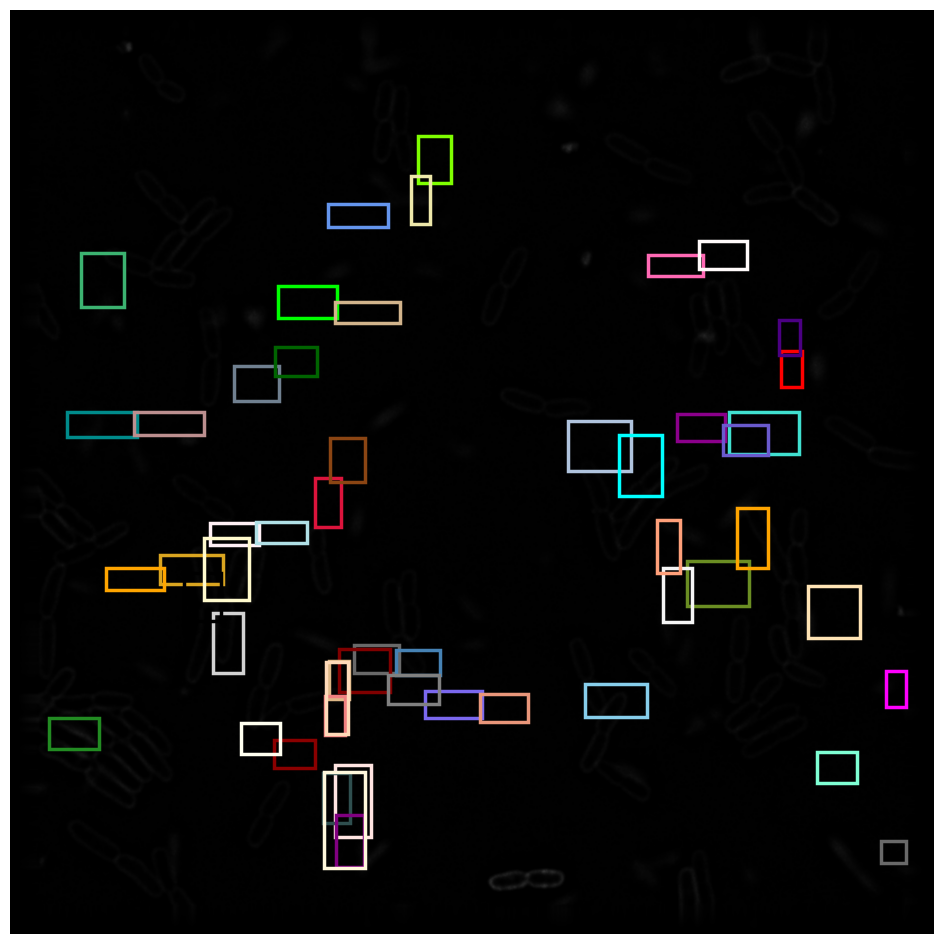

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:08:14.179 | INFO     | test_app:test_ceare_file_model:186 - (108, 21)
2023-04-27 17:08:14.202 | INFO     | test_app:test_ceare_file_model:206 - features shape (108, 22)


image dtype: uint16
final result shape:  (108, 21)
finish
14 20221011_TS008_1hr_1mindye_untreated_24_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 57ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_

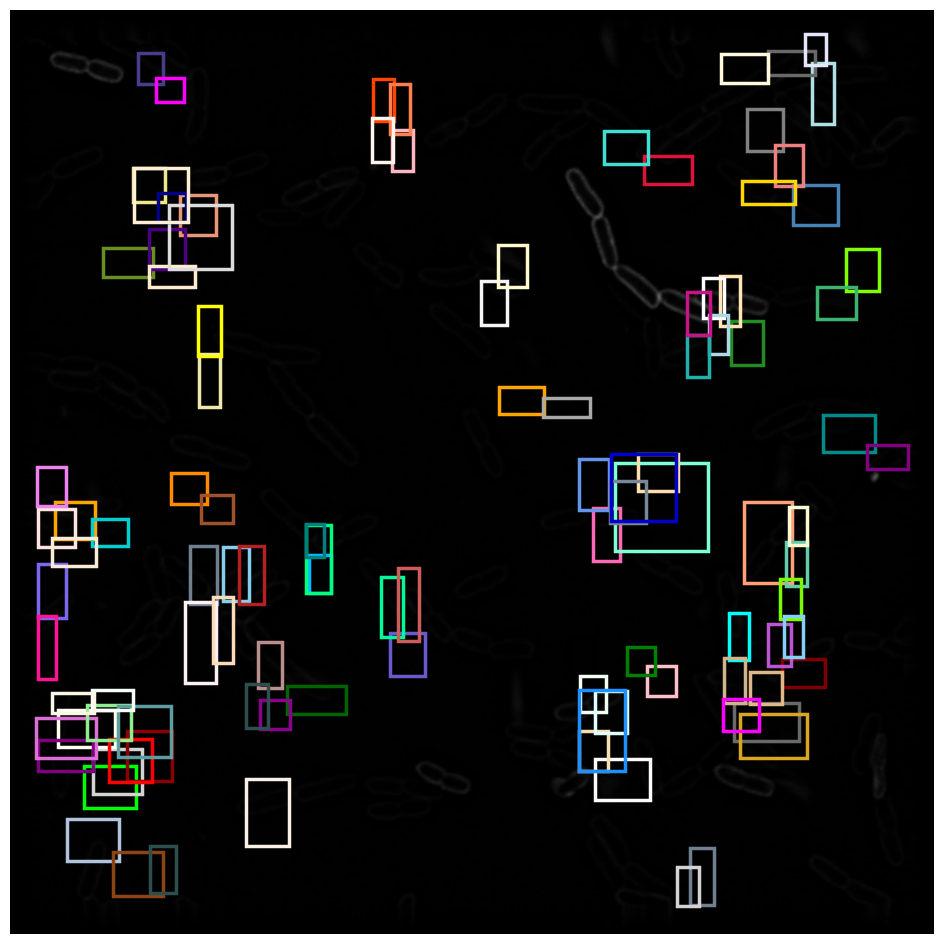

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:09:00.538 | INFO     | test_app:test_ceare_file_model:186 - (110, 21)
2023-04-27 17:09:00.562 | INFO     | test_app:test_ceare_file_model:206 - features shape (110, 22)


image dtype: uint16
final result shape:  (110, 21)
finish
15 20221011_2_TS008_1hr_1mindye_untreated_01_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 57ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_mai

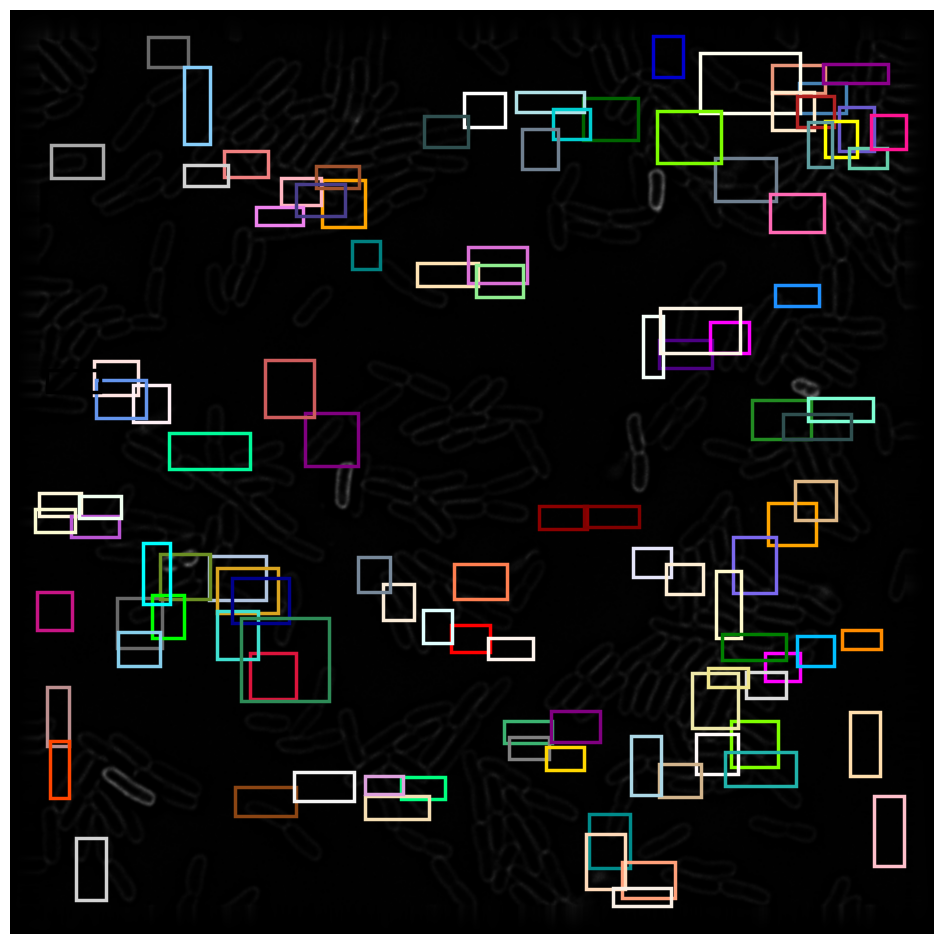

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:09:48.082 | INFO     | test_app:test_ceare_file_model:186 - (123, 21)
2023-04-27 17:09:48.113 | INFO     | test_app:test_ceare_file_model:206 - features shape (123, 22)


image dtype: uint16
final result shape:  (123, 21)
finish
16 20221011_TS008_1hr_1mindye_untreated_14_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 56ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_

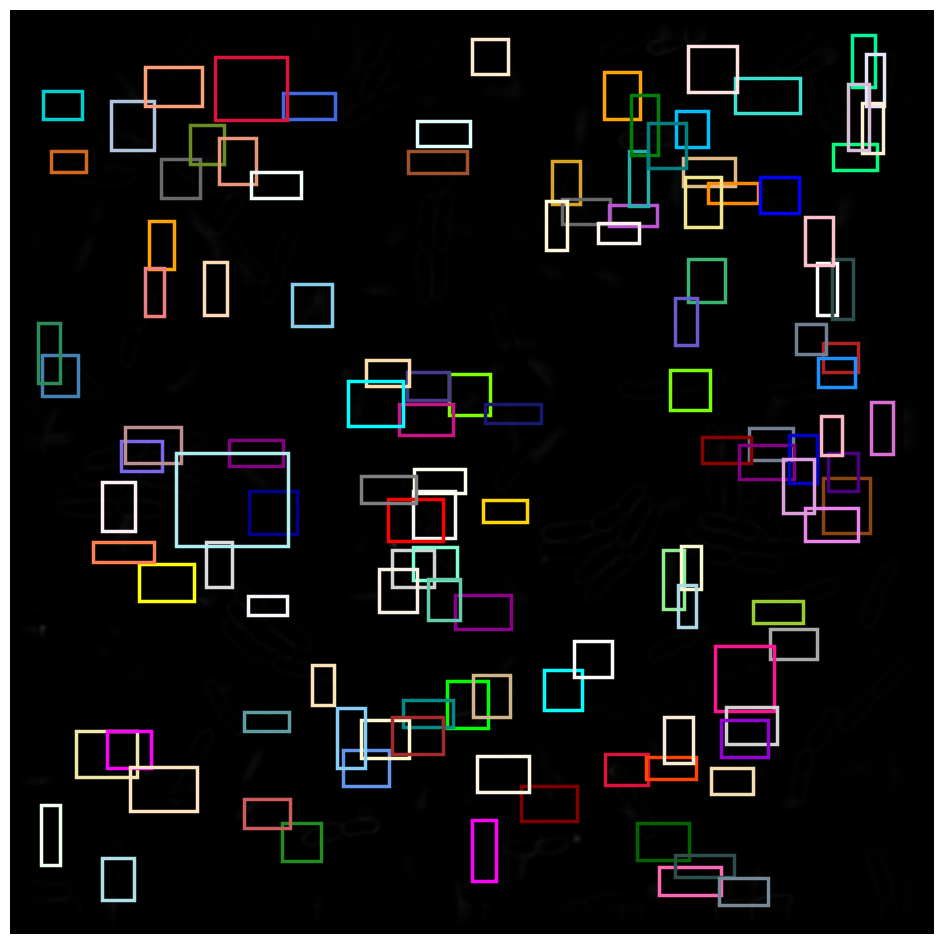

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:10:35.272 | INFO     | test_app:test_ceare_file_model:186 - (104, 21)
2023-04-27 17:10:35.296 | INFO     | test_app:test_ceare_file_model:206 - features shape (104, 22)


image dtype: uint16
final result shape:  (104, 21)
finish
17 20221011_TS008_1hr_1mindye_untreated_02_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 56ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_

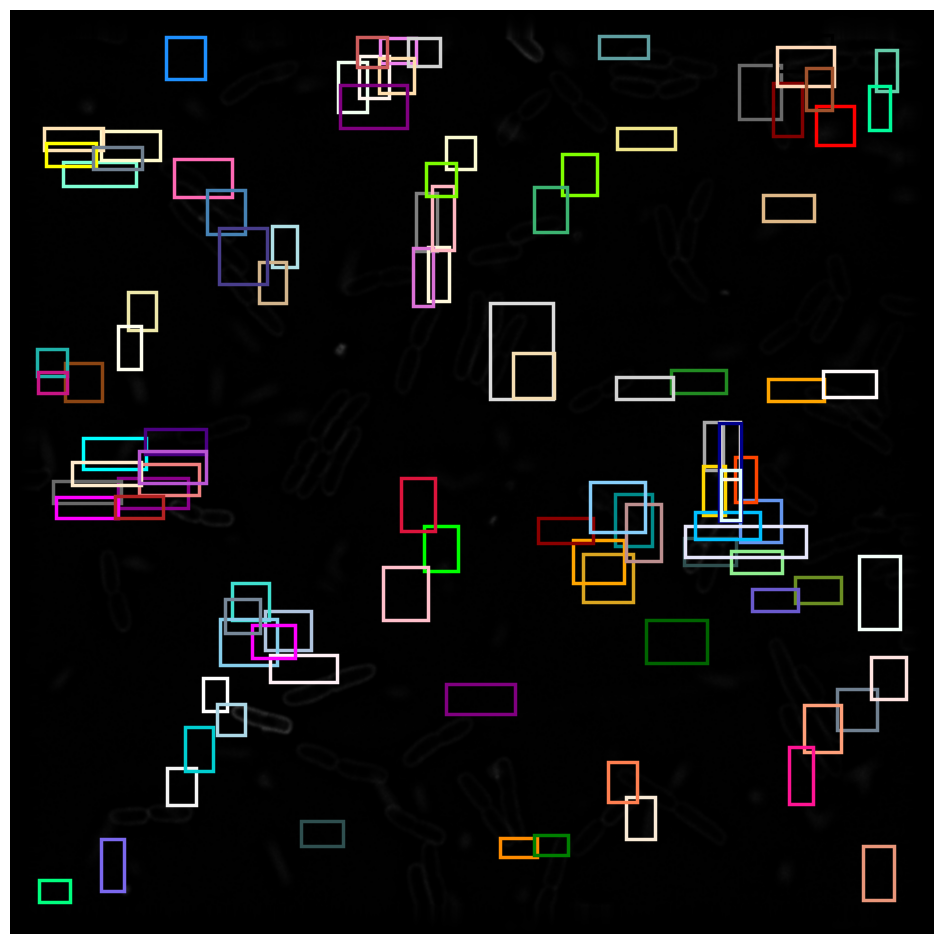

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:11:22.179 | INFO     | test_app:test_ceare_file_model:186 - (95, 21)
2023-04-27 17:11:22.202 | INFO     | test_app:test_ceare_file_model:206 - features shape (95, 22)


image dtype: uint16
final result shape:  (95, 21)
finish
18 20221007_TS008_1hr_untreated_35_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 55ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv_bn_b

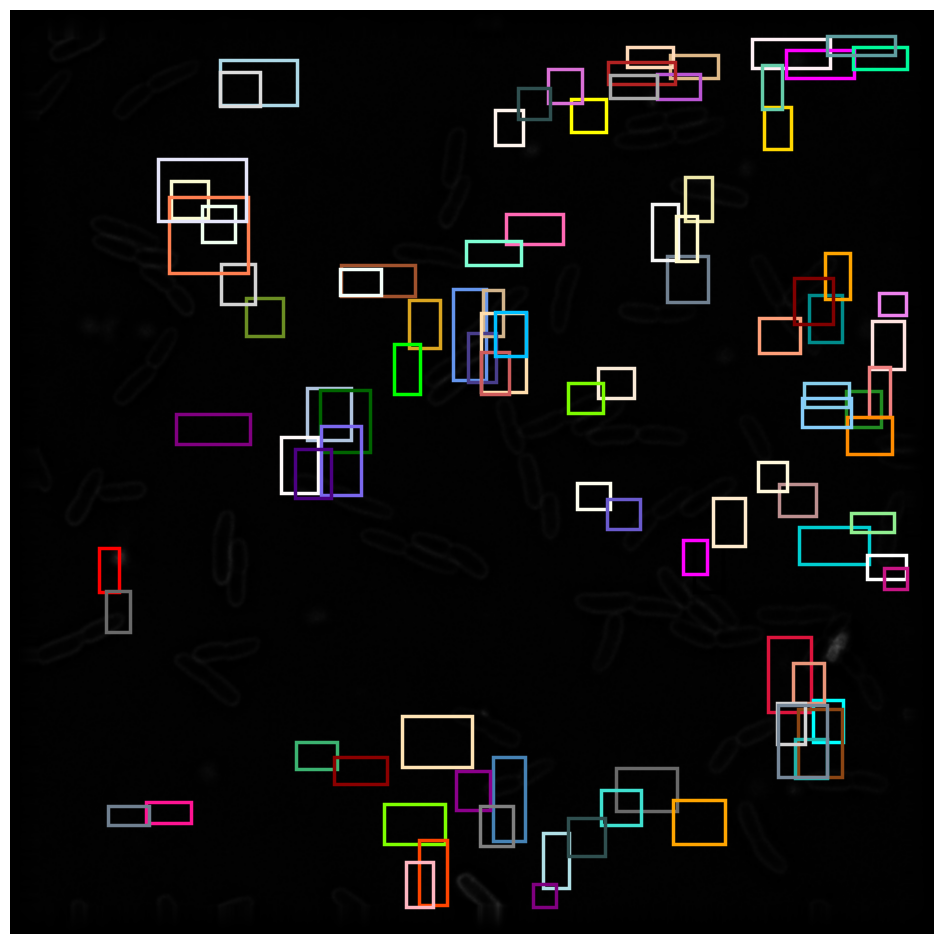

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:12:08.822 | INFO     | test_app:test_ceare_file_model:186 - (81, 21)
2023-04-27 17:12:08.844 | INFO     | test_app:test_ceare_file_model:206 - features shape (81, 22)


image dtype: uint16
final result shape:  (81, 21)
finish
19 20221011_TS008_1hr_1mindye_untreated_08_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 56ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_c

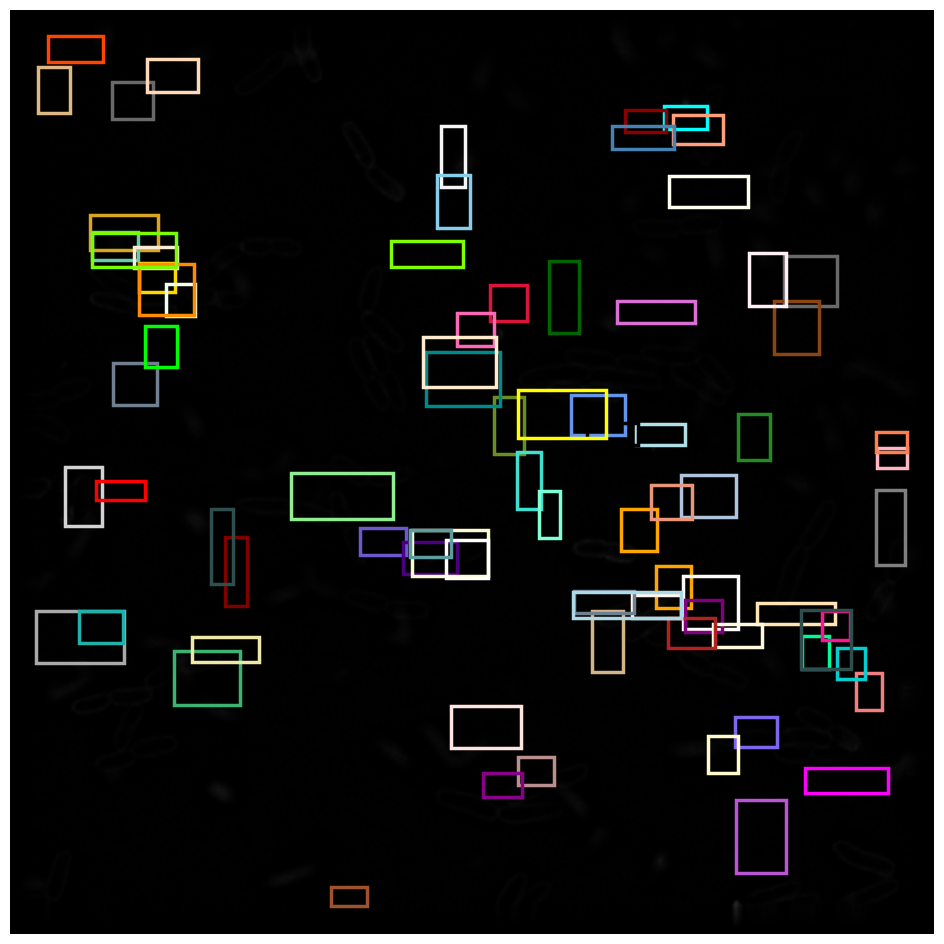

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:12:55.695 | INFO     | test_app:test_ceare_file_model:186 - (90, 21)
2023-04-27 17:12:55.717 | INFO     | test_app:test_ceare_file_model:206 - features shape (90, 22)


image dtype: uint16
final result shape:  (90, 21)
finish
20 20221003_TS008_1hr_1mindye_untreated_17_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 57ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_c

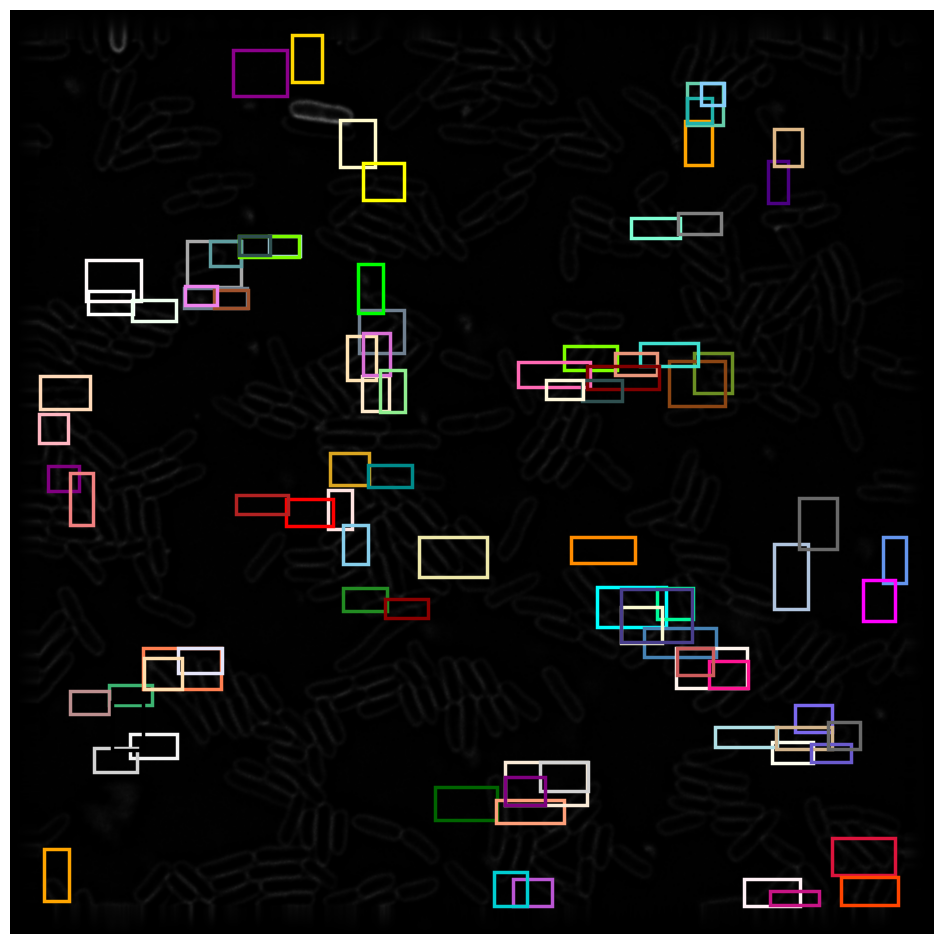

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:13:43.754 | INFO     | test_app:test_ceare_file_model:186 - (133, 21)
2023-04-27 17:13:43.787 | INFO     | test_app:test_ceare_file_model:206 - features shape (133, 22)


image dtype: uint16
final result shape:  (133, 21)
finish
21 20221011_2_TS008_1hr_1mindye_untreated_11_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 55ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_mai

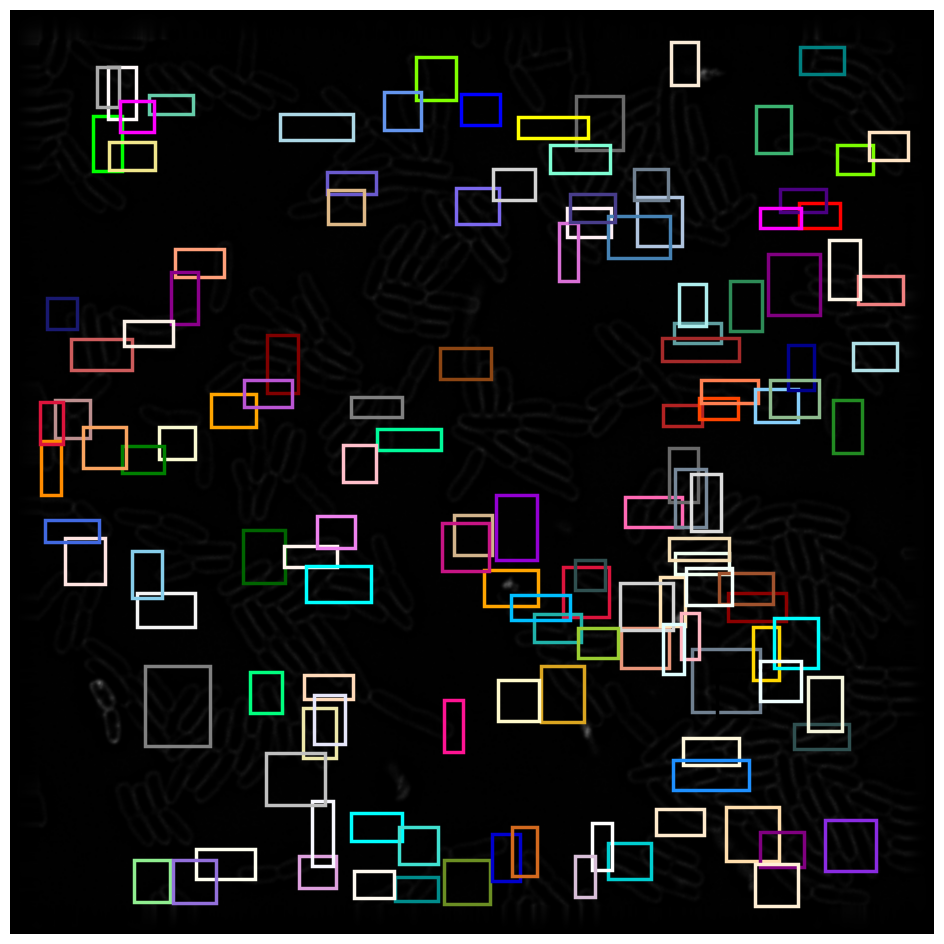

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:14:31.479 | INFO     | test_app:test_ceare_file_model:186 - (127, 21)
2023-04-27 17:14:31.510 | INFO     | test_app:test_ceare_file_model:206 - features shape (127, 22)


image dtype: uint16
final result shape:  (127, 21)
finish
22 20221011_TS008_1hr_1mindye_untreated_19_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 56ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_

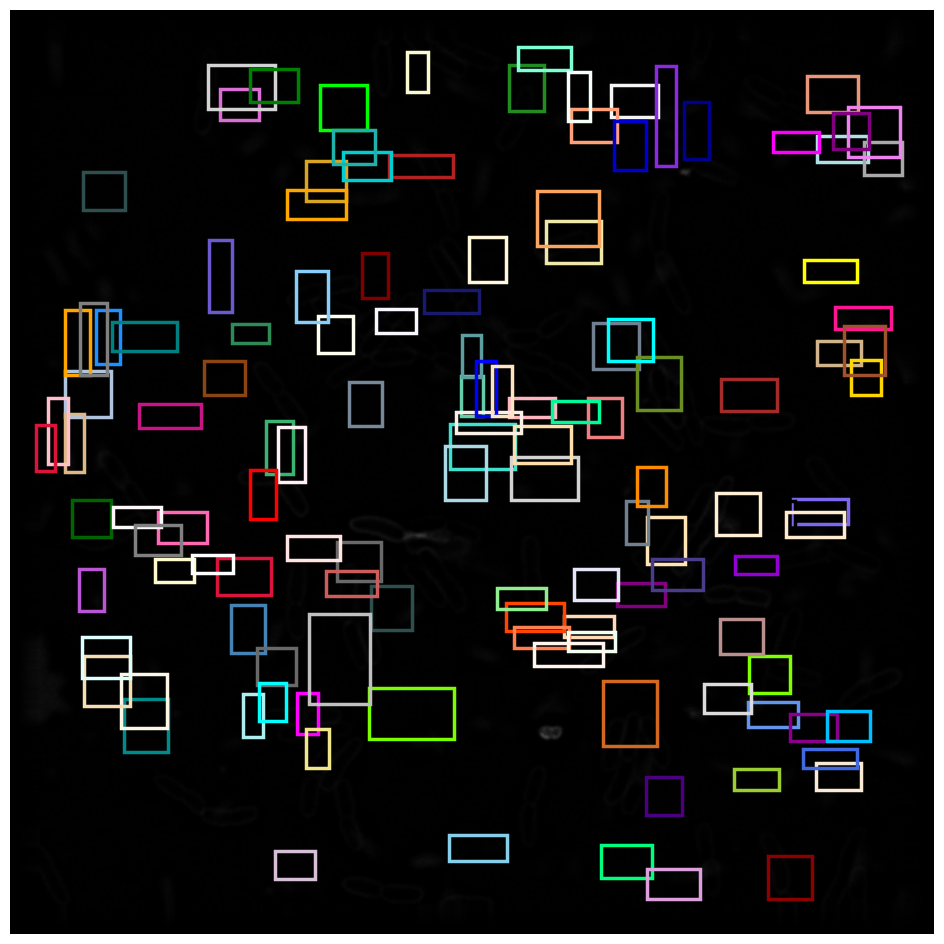

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:15:18.698 | INFO     | test_app:test_ceare_file_model:186 - (106, 21)
2023-04-27 17:15:18.722 | INFO     | test_app:test_ceare_file_model:206 - features shape (106, 22)


image dtype: uint16
final result shape:  (106, 21)
finish
23 20221003_TS008_1hr_1mindye_untreated_09_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 56ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_

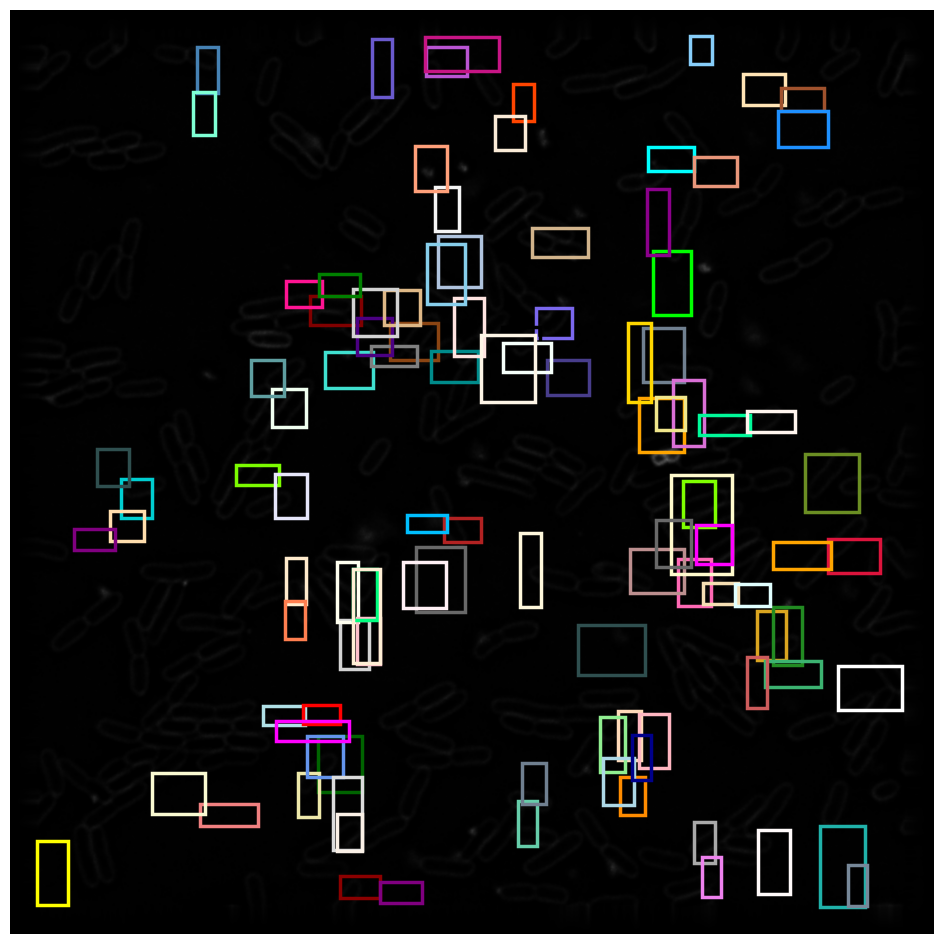

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:16:05.206 | INFO     | test_app:test_ceare_file_model:186 - (113, 21)
2023-04-27 17:16:05.234 | INFO     | test_app:test_ceare_file_model:206 - features shape (113, 22)


image dtype: uint16
final result shape:  (113, 21)
finish
24 20221012_TS008_1hr_1mindye_untreated_39_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 56ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_

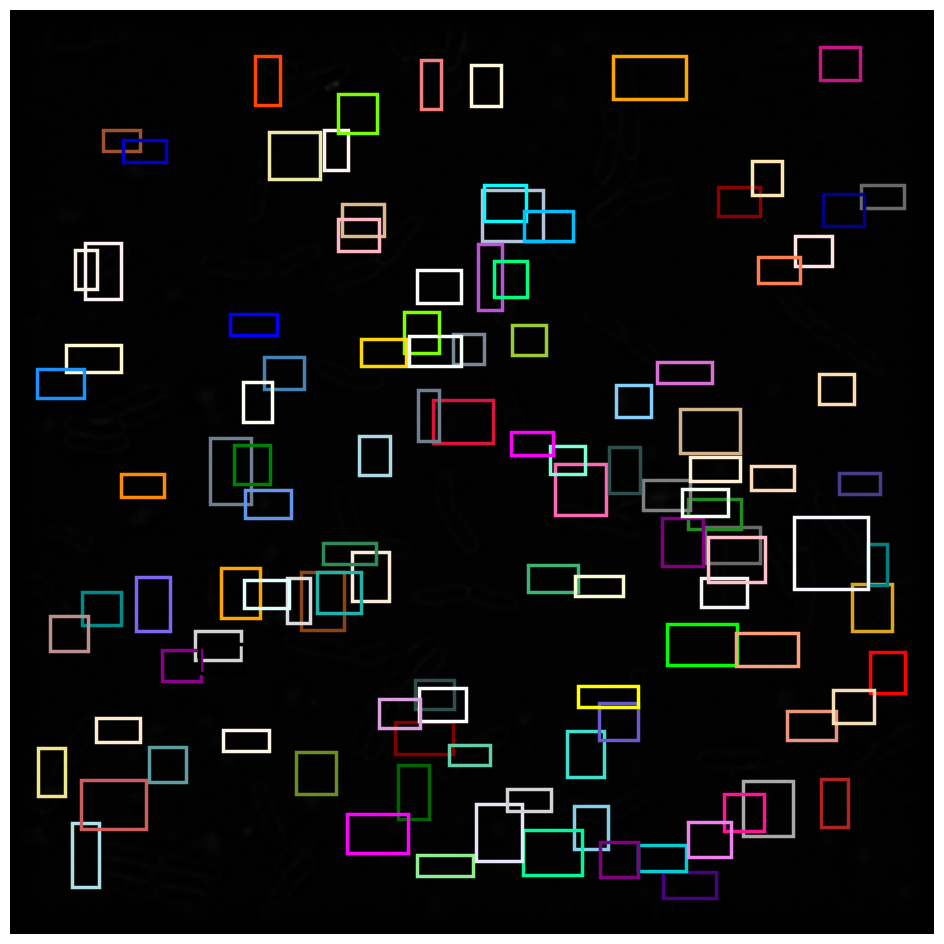

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:16:52.173 | INFO     | test_app:test_ceare_file_model:186 - (97, 21)
2023-04-27 17:16:52.200 | INFO     | test_app:test_ceare_file_model:206 - features shape (97, 22)


image dtype: uint16
final result shape:  (97, 21)
finish
25 20221003_TS008_1hr_1mindye_untreated_03_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 56ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_c

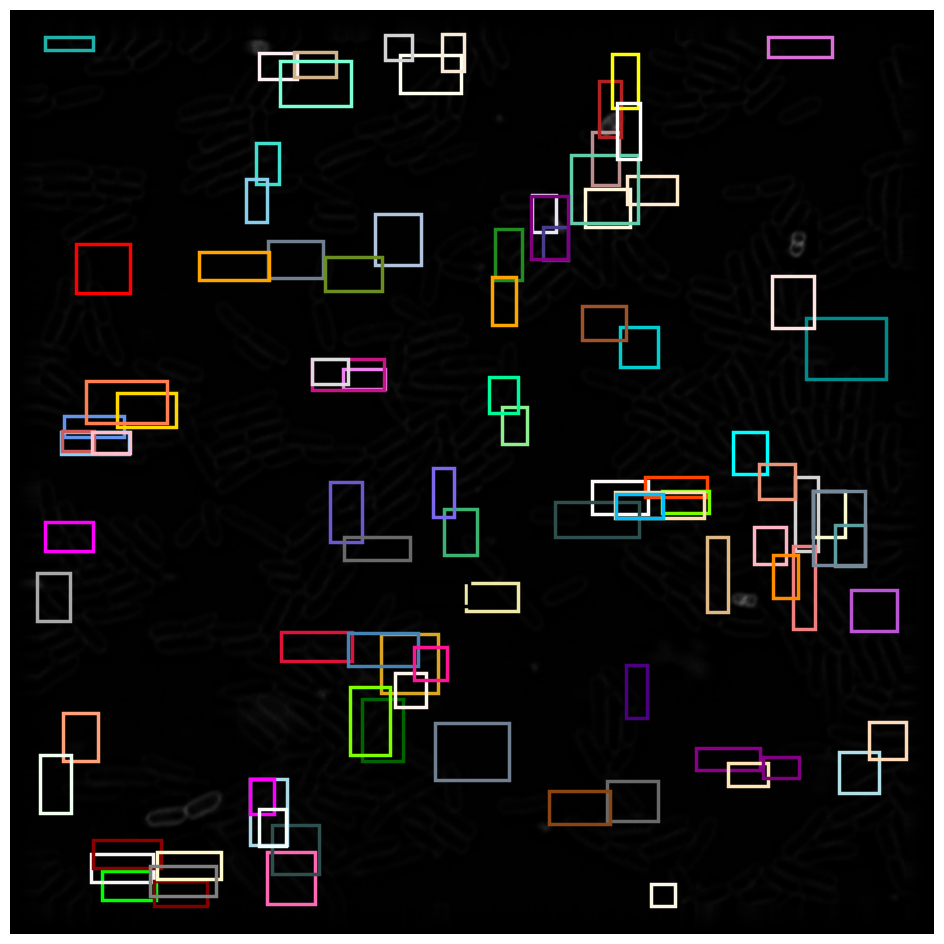

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:17:39.110 | INFO     | test_app:test_ceare_file_model:186 - (127, 21)
2023-04-27 17:17:39.148 | INFO     | test_app:test_ceare_file_model:206 - features shape (127, 22)


image dtype: uint16
final result shape:  (127, 21)
finish
26 20221011_2_TS008_1hr_1mindye_untreated_10_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 56ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_mai

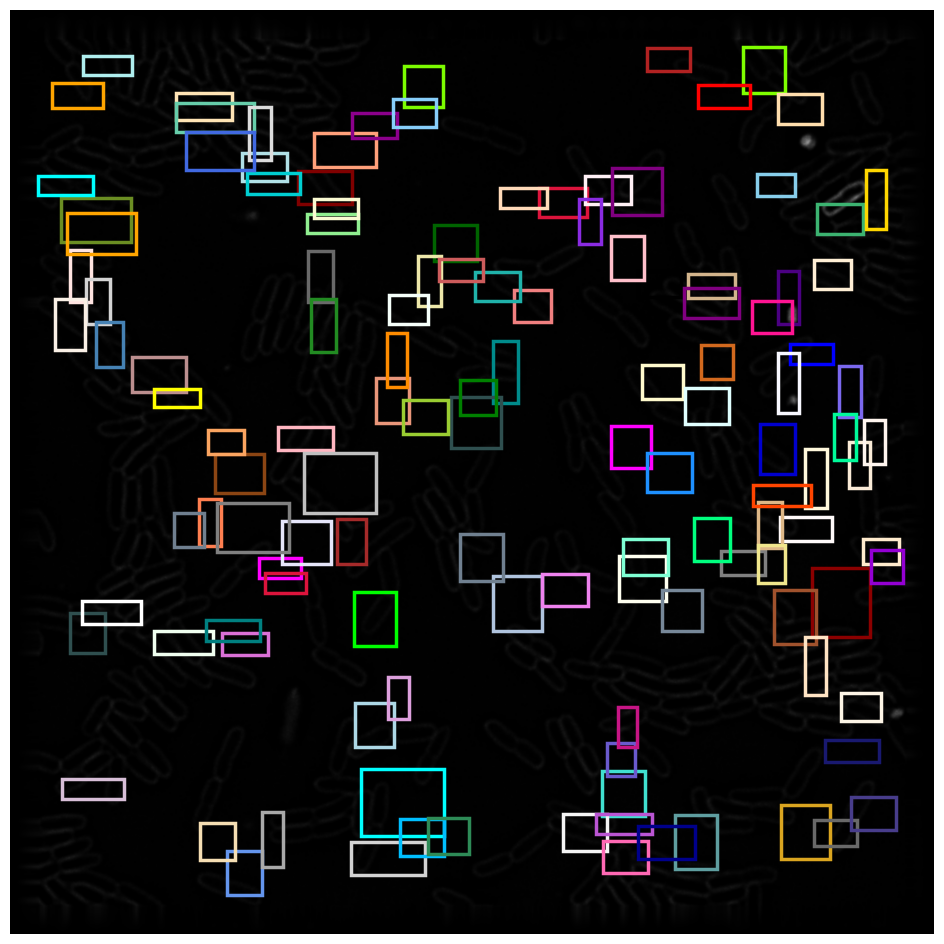

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:18:26.907 | INFO     | test_app:test_ceare_file_model:186 - (125, 21)
2023-04-27 17:18:26.937 | INFO     | test_app:test_ceare_file_model:206 - features shape (125, 22)


image dtype: uint16
final result shape:  (125, 21)
finish
27 20221003_TS008_1hr_1mindye_untreated_08_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 55ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_

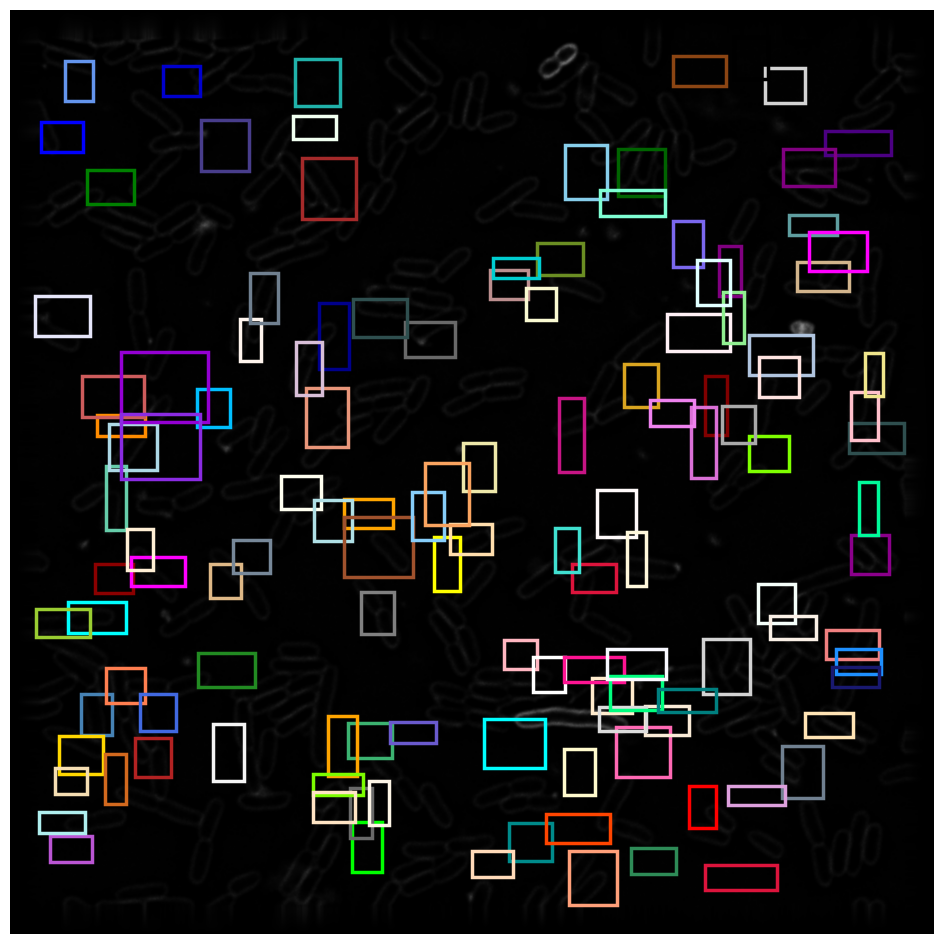

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:19:13.773 | INFO     | test_app:test_ceare_file_model:186 - (125, 21)
2023-04-27 17:19:13.802 | INFO     | test_app:test_ceare_file_model:206 - features shape (125, 22)


image dtype: uint16
final result shape:  (125, 21)
finish
28 20221011_TS008_1hr_1mindye_untreated_27_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 57ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_

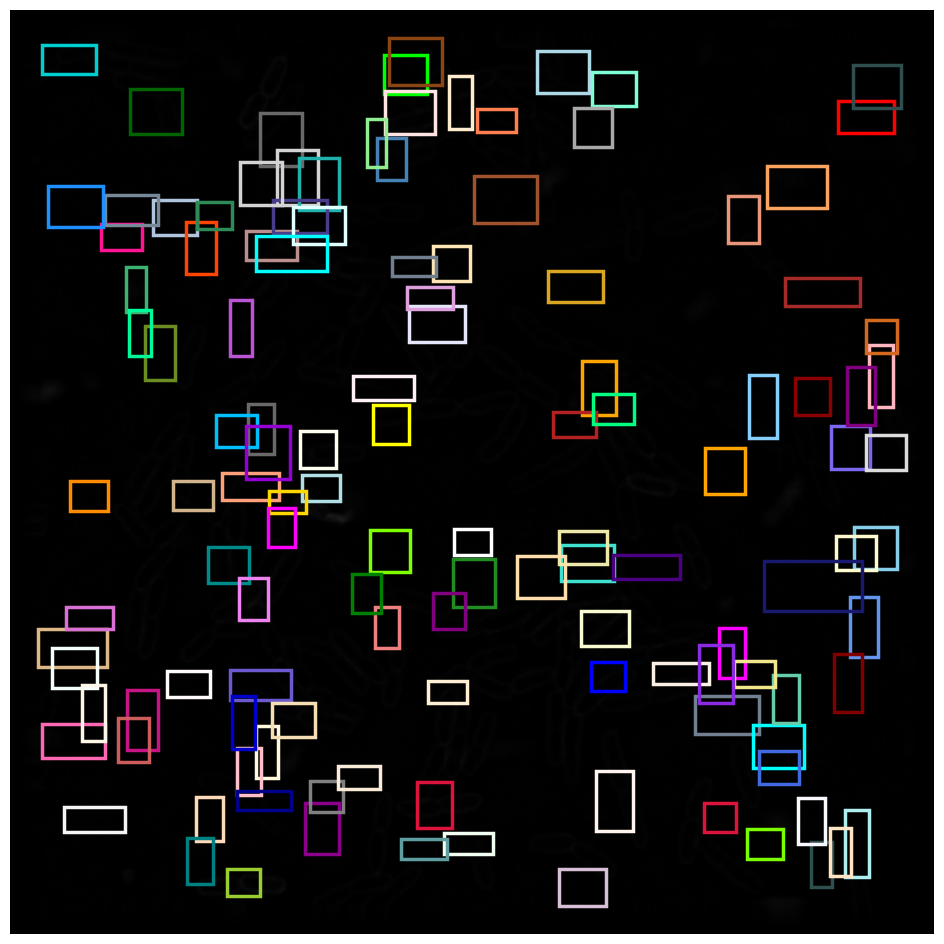

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:20:01.116 | INFO     | test_app:test_ceare_file_model:186 - (112, 21)
2023-04-27 17:20:01.143 | INFO     | test_app:test_ceare_file_model:206 - features shape (112, 22)


image dtype: uint16
final result shape:  (112, 21)
finish
29 20221012_TS008_1hr_1mindye_untreated_23_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 56ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_

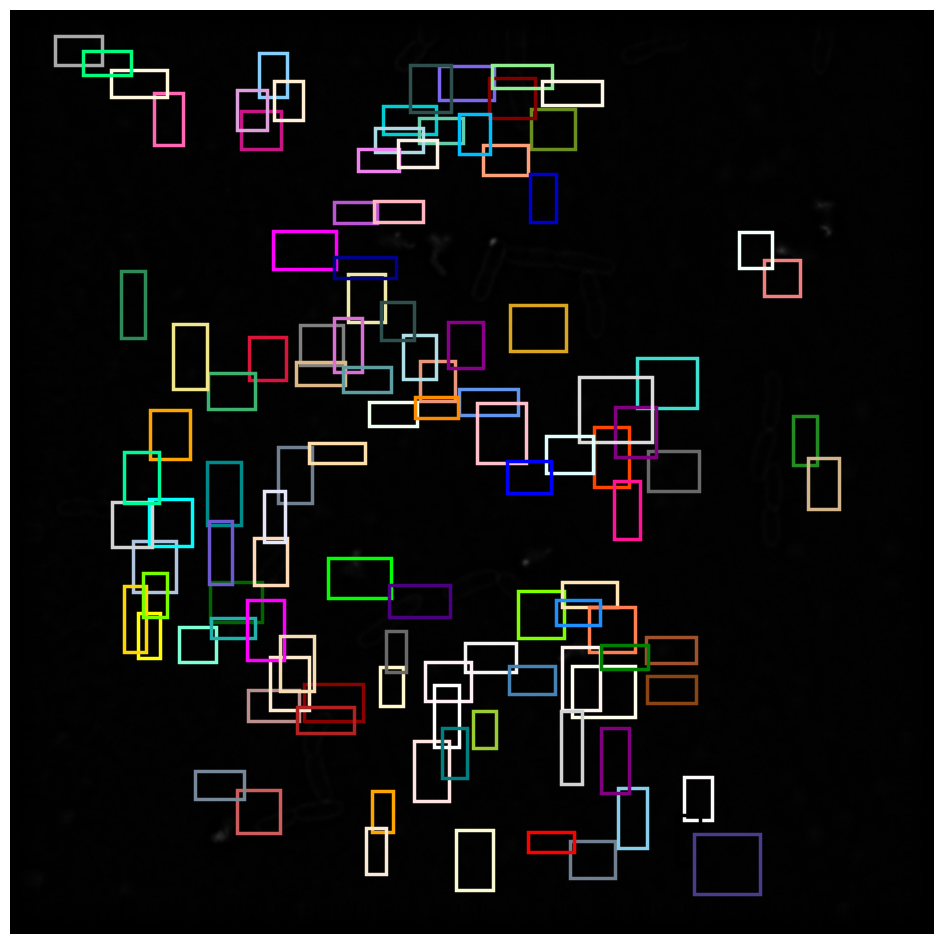

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:20:46.629 | INFO     | test_app:test_ceare_file_model:186 - (33, 21)
2023-04-27 17:20:46.654 | INFO     | test_app:test_ceare_file_model:206 - features shape (33, 22)


image dtype: uint16
final result shape:  (33, 21)
finish
30 20221012_TS008_1hr_1mindye_untreated_21_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 56ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_c

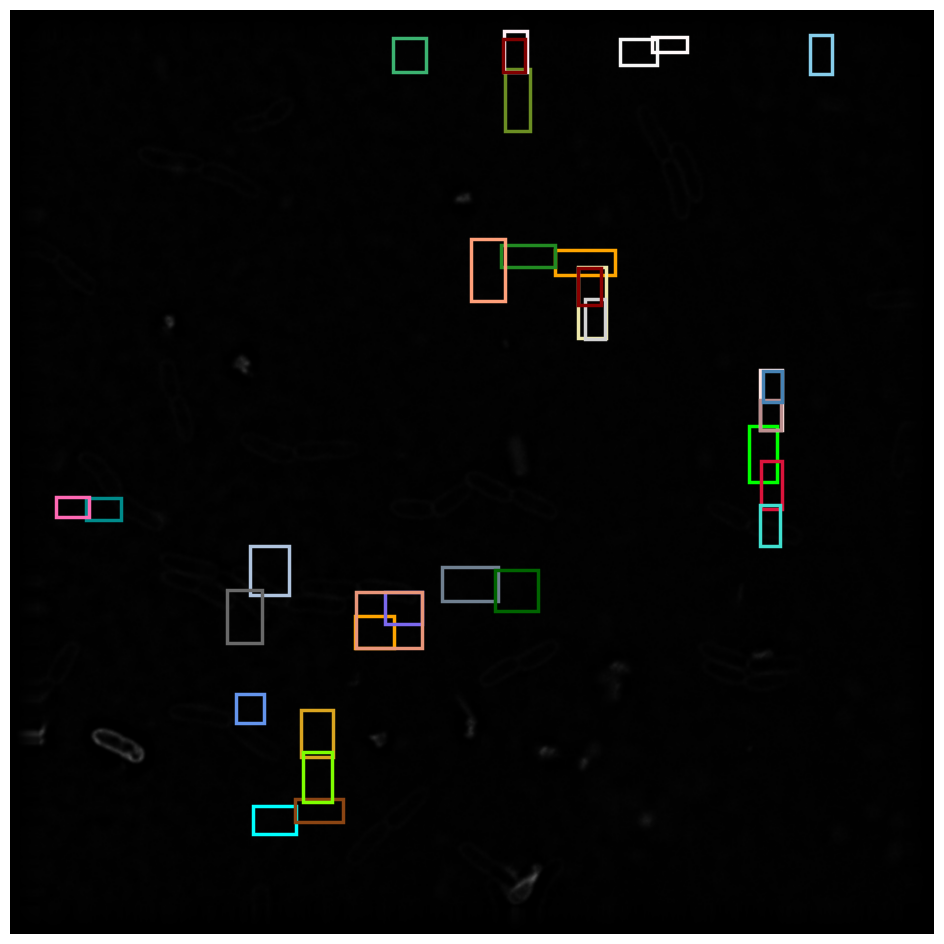

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:21:32.303 | INFO     | test_app:test_ceare_file_model:186 - (47, 21)
2023-04-27 17:21:32.331 | INFO     | test_app:test_ceare_file_model:206 - features shape (47, 22)


image dtype: uint16
final result shape:  (47, 21)
finish
31 20221011_TS008_1hr_1mindye_TET_5x_08_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 57ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv

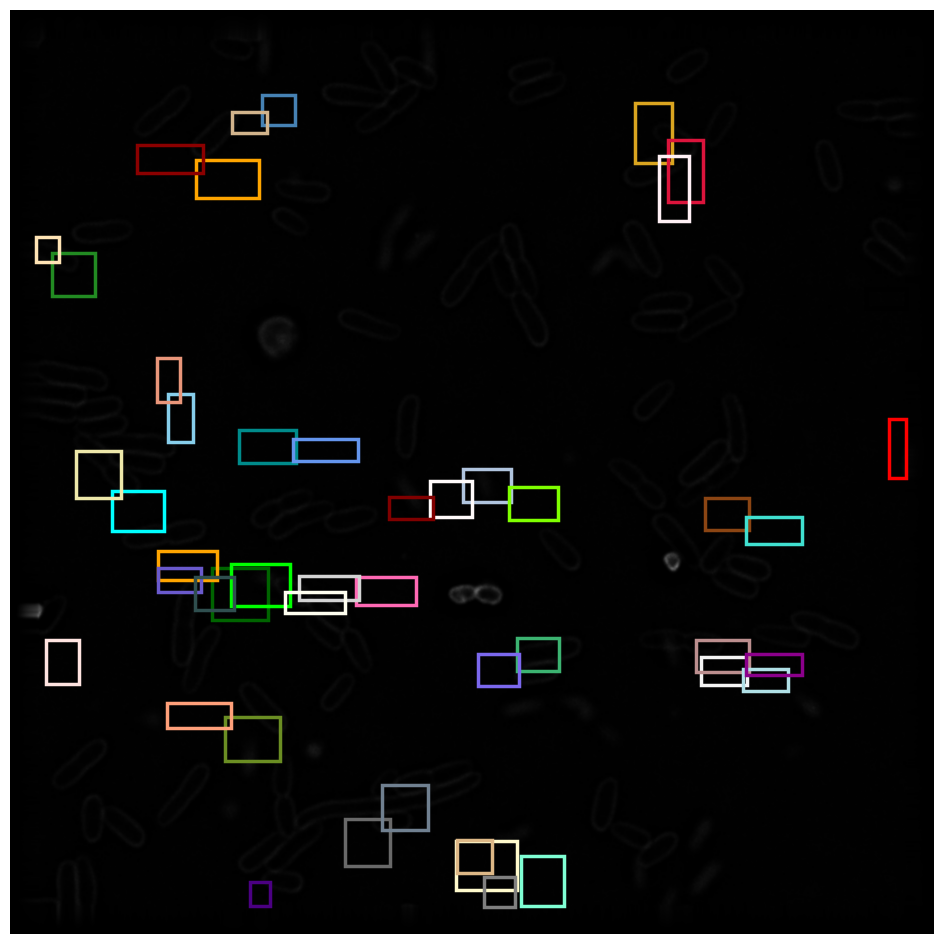

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:22:18.450 | INFO     | test_app:test_ceare_file_model:186 - (90, 21)
2023-04-27 17:22:18.473 | INFO     | test_app:test_ceare_file_model:206 - features shape (90, 22)


image dtype: uint16
final result shape:  (90, 21)
finish
32 20221011_TS008_1hr_1mindye_TET_5x_04_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 57ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv

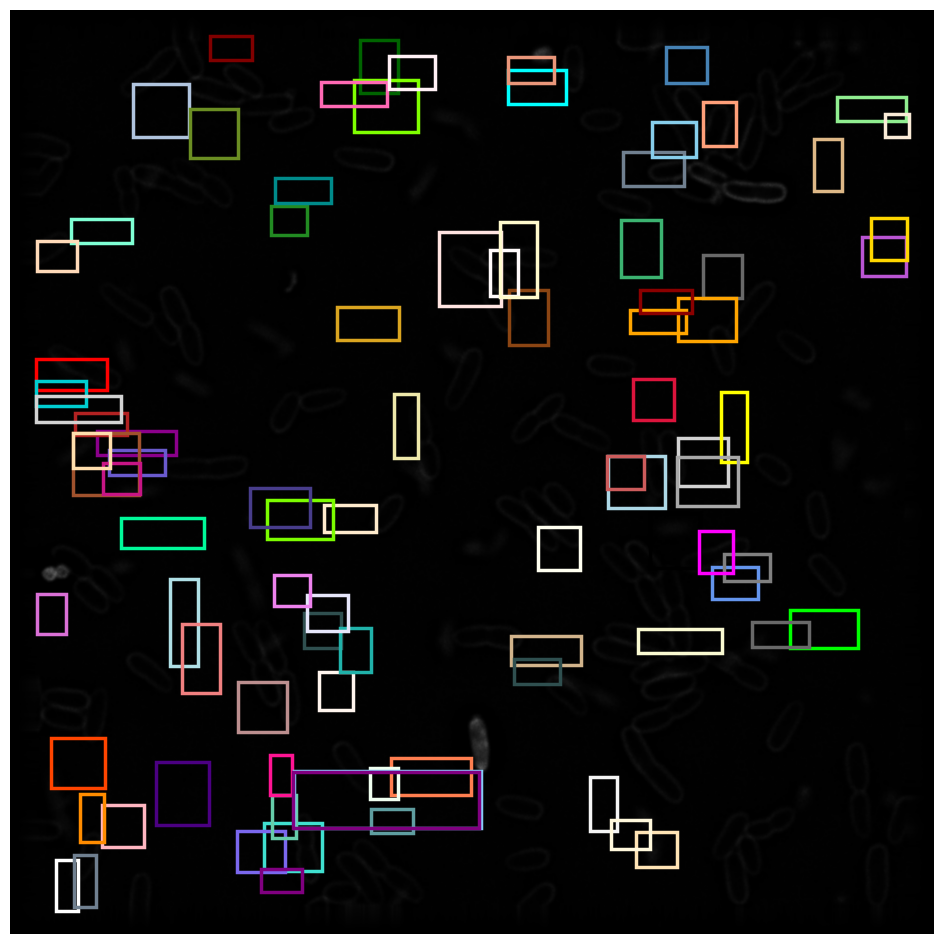

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:23:05.619 | INFO     | test_app:test_ceare_file_model:186 - (101, 21)
2023-04-27 17:23:05.642 | INFO     | test_app:test_ceare_file_model:206 - features shape (101, 22)


image dtype: uint16
final result shape:  (101, 21)
finish
33 20220916_TS008_1hr_1mindye_TET_5x_02_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 57ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_con

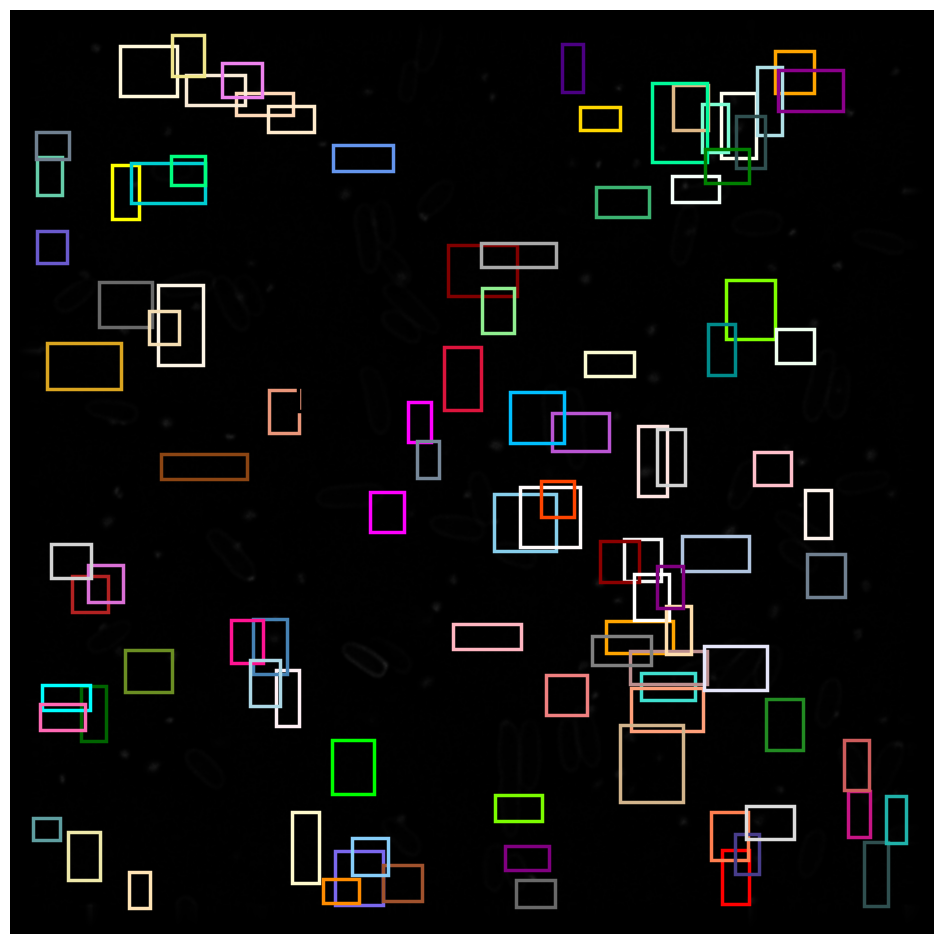

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:23:51.560 | INFO     | test_app:test_ceare_file_model:186 - (52, 21)
2023-04-27 17:23:51.580 | INFO     | test_app:test_ceare_file_model:206 - features shape (52, 22)


image dtype: uint16
final result shape:  (52, 21)
finish
34 20221011_2_TS008_1hr_1mindye_TET_5x_17_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 57ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_co

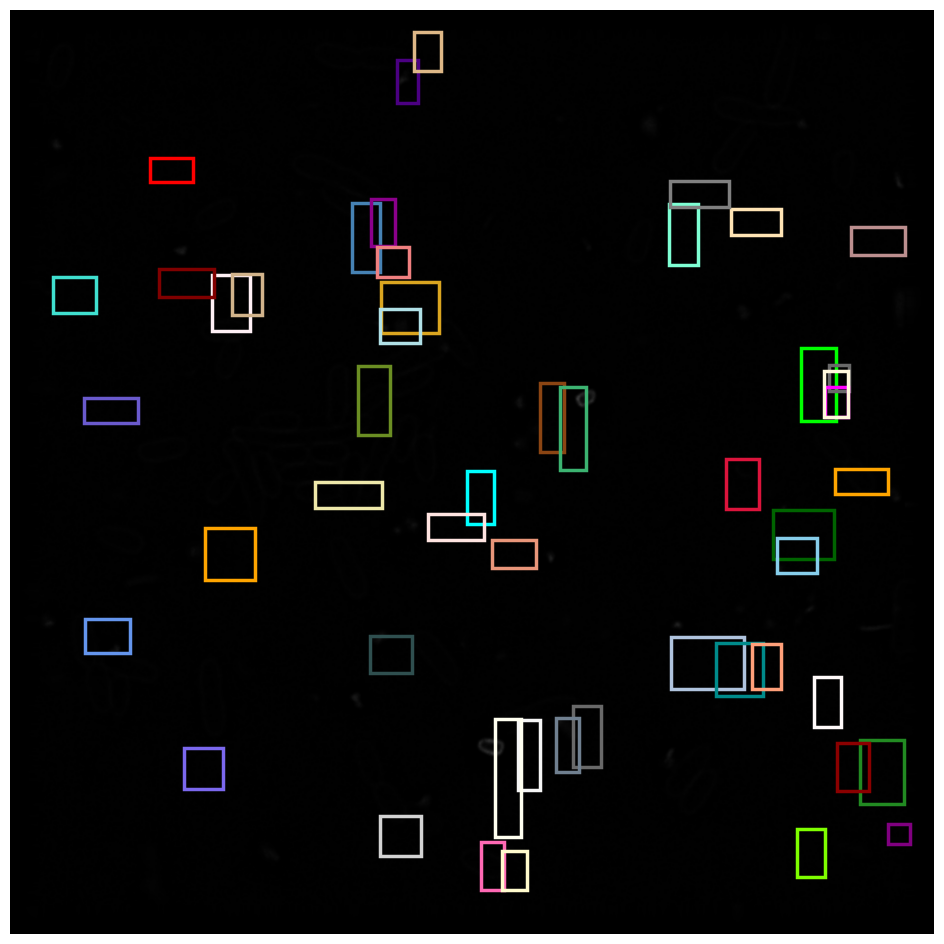

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:24:37.392 | INFO     | test_app:test_ceare_file_model:186 - (51, 21)
2023-04-27 17:24:37.411 | INFO     | test_app:test_ceare_file_model:206 - features shape (51, 22)


image dtype: uint16
final result shape:  (51, 21)
finish
35 20221011_TS008_1hr_1mindye_TET_5x_03_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 56ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv

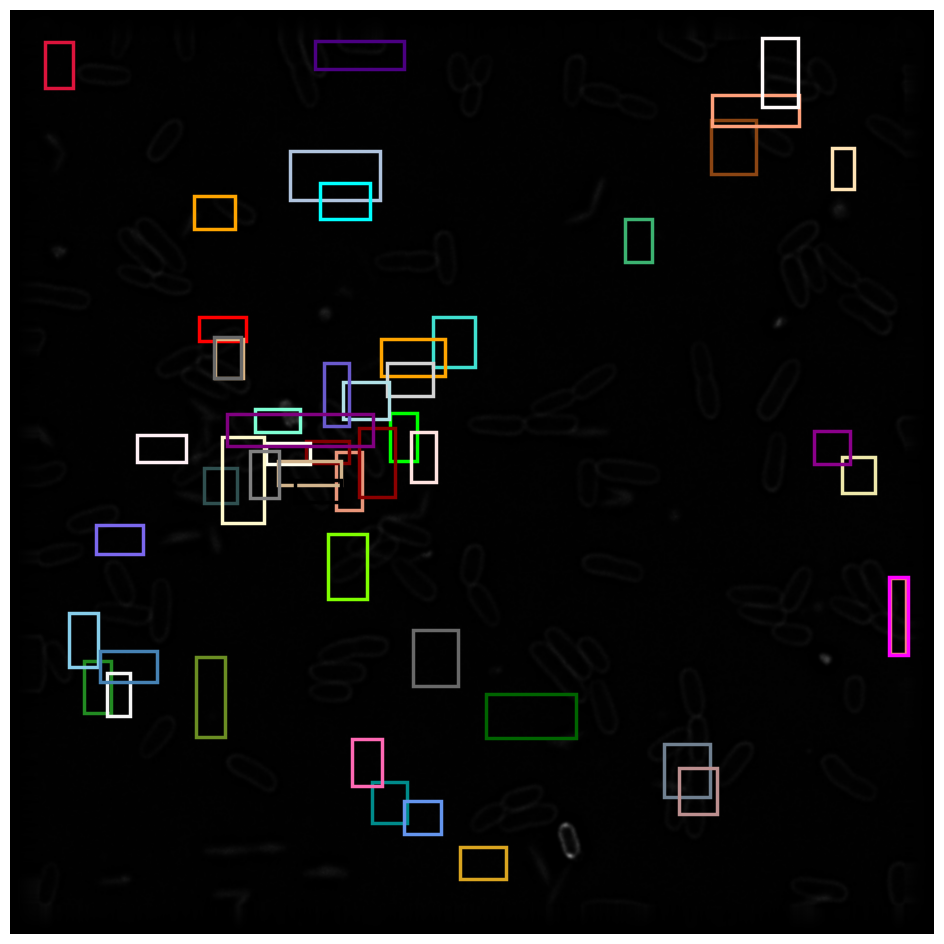

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:25:24.541 | INFO     | test_app:test_ceare_file_model:186 - (102, 21)
2023-04-27 17:25:24.564 | INFO     | test_app:test_ceare_file_model:206 - features shape (102, 22)


image dtype: uint16
final result shape:  (102, 21)
finish
36 20220916_TS008_1hr_1mindye_TET_5x_08_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 57ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_con

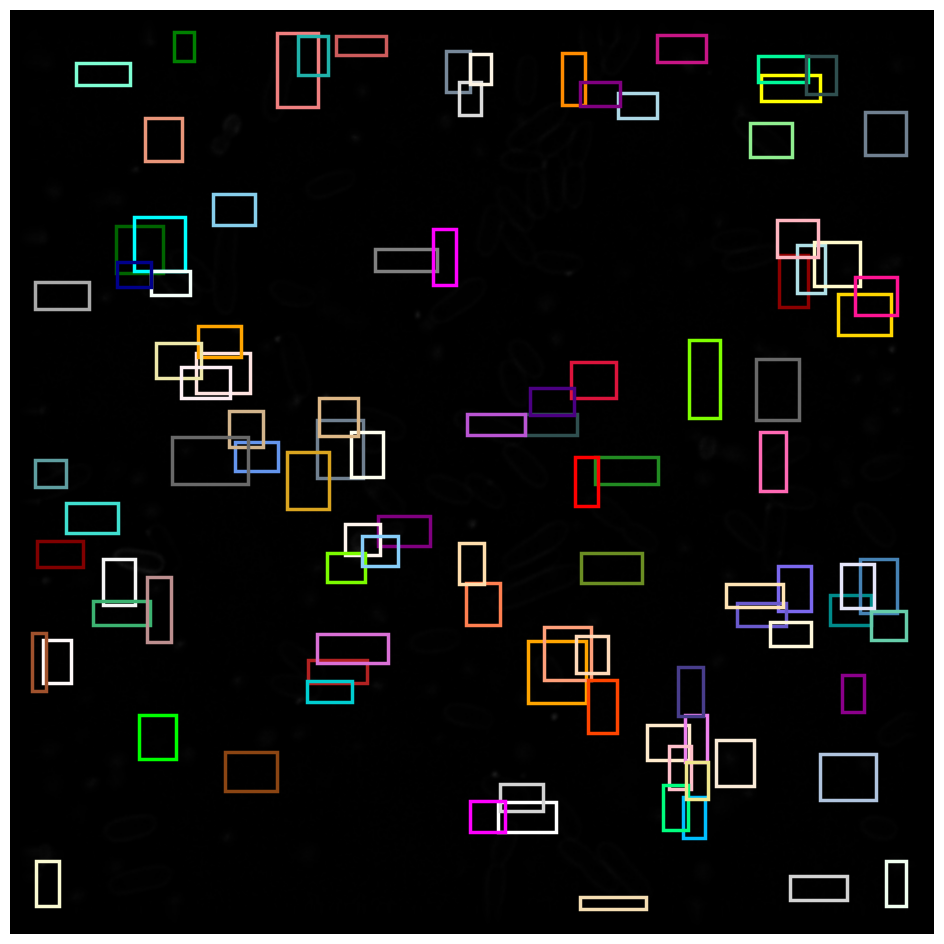

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:26:11.336 | INFO     | test_app:test_ceare_file_model:186 - (65, 21)
2023-04-27 17:26:11.357 | INFO     | test_app:test_ceare_file_model:206 - features shape (65, 22)


image dtype: uint16
final result shape:  (65, 21)
finish
37 20221011_TS008_1hr_1mindye_TET_5x_12_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 57ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv

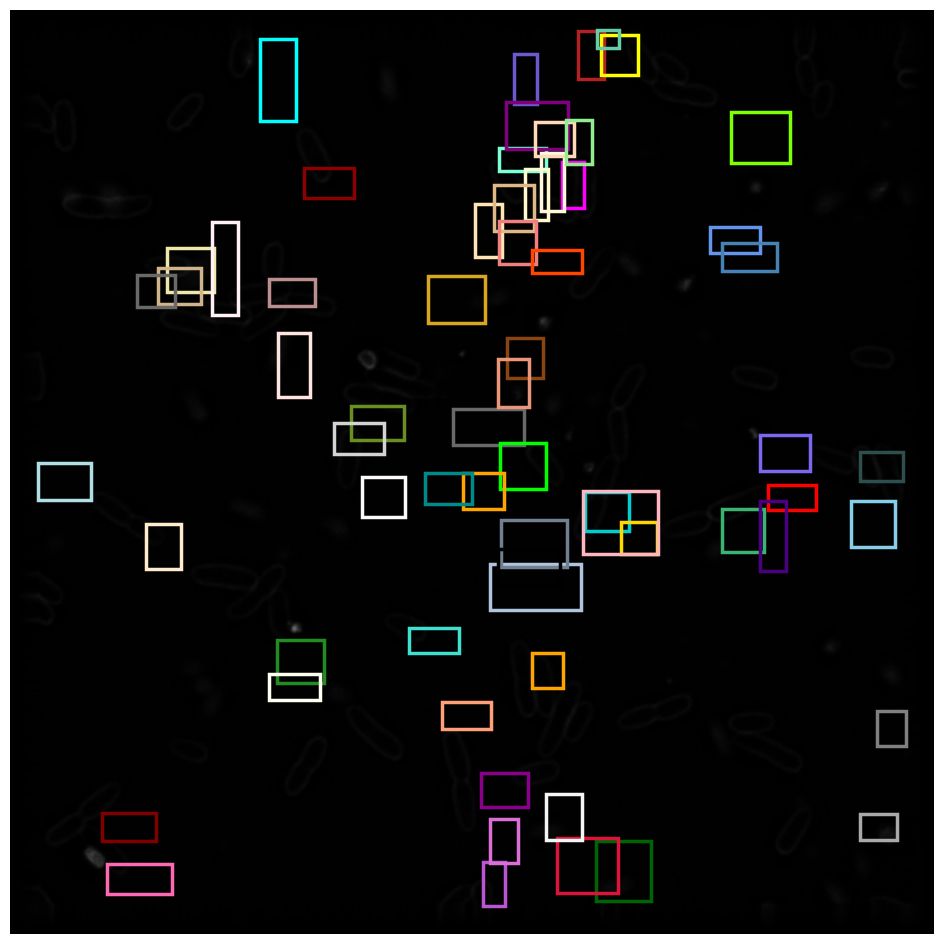

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:26:57.799 | INFO     | test_app:test_ceare_file_model:186 - (71, 21)
2023-04-27 17:26:57.820 | INFO     | test_app:test_ceare_file_model:206 - features shape (71, 22)


image dtype: uint16
final result shape:  (71, 21)
finish
38 20221011_TS008_1hr_1mindye_TET_5x_11_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 60ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv

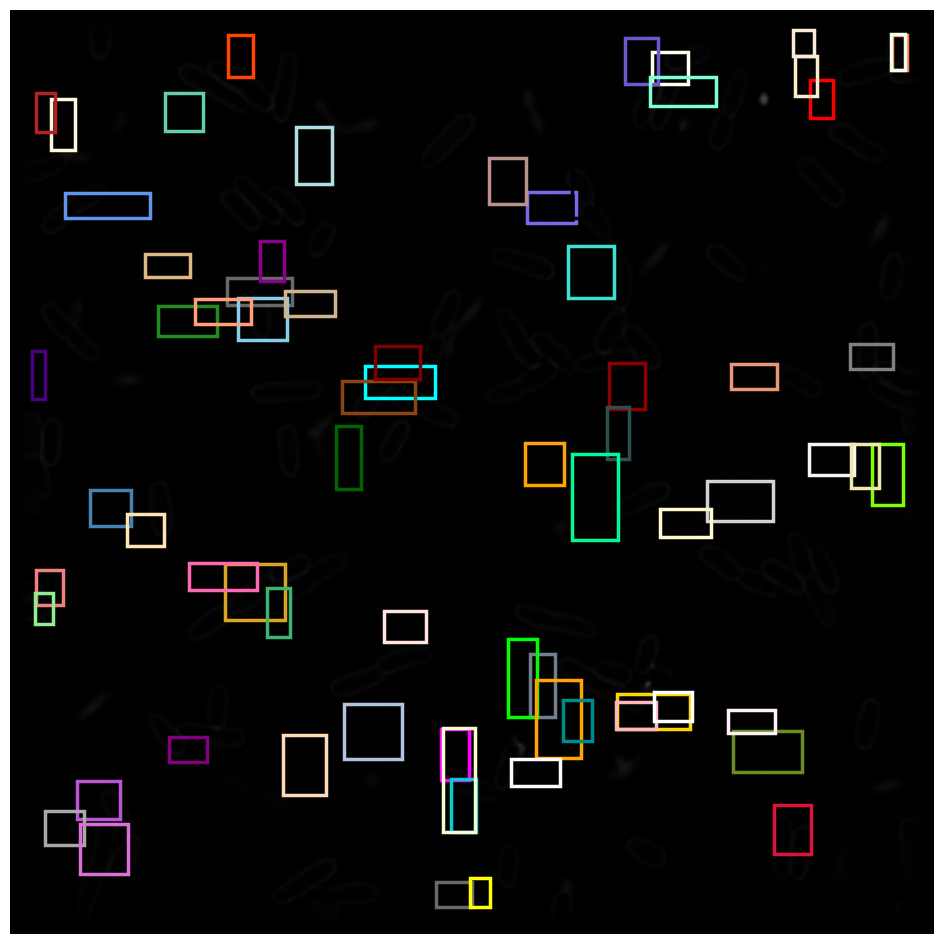

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:27:45.400 | INFO     | test_app:test_ceare_file_model:186 - (84, 21)
2023-04-27 17:27:45.422 | INFO     | test_app:test_ceare_file_model:206 - features shape (84, 22)


image dtype: uint16
final result shape:  (84, 21)
finish
39 20221011_2_TS008_1hr_1mindye_TET_5x_18_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 58ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_co

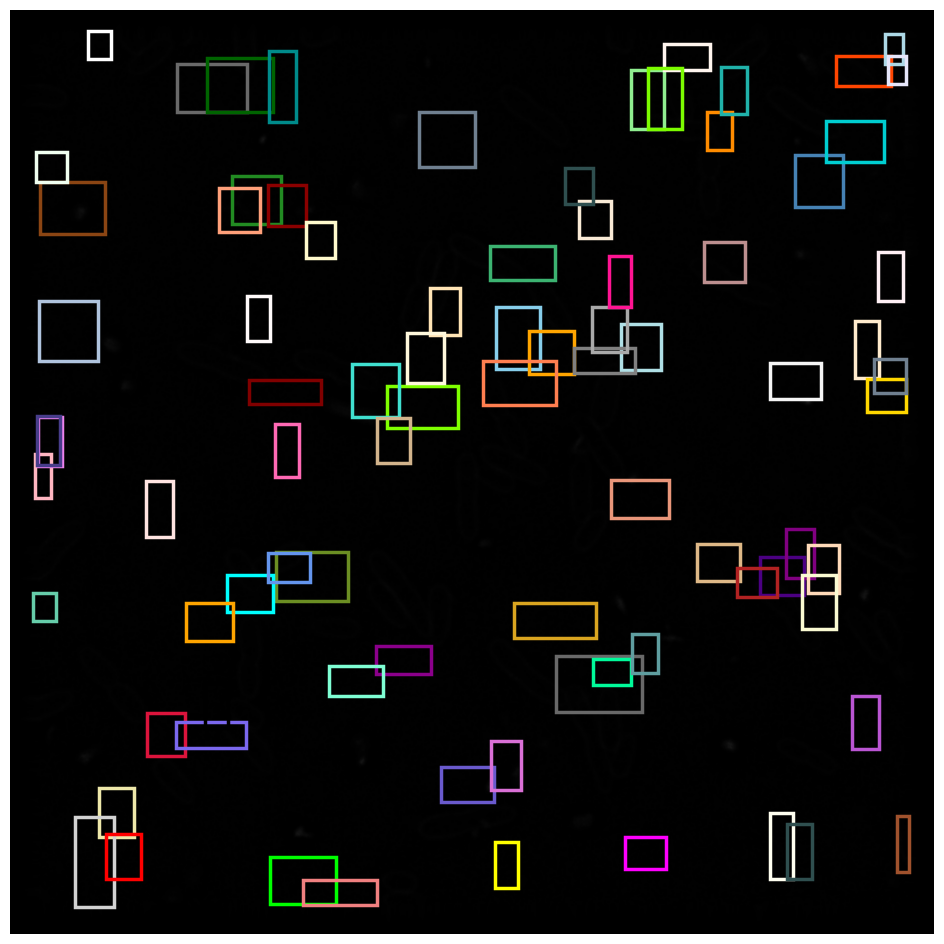

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:28:32.587 | INFO     | test_app:test_ceare_file_model:186 - (67, 21)
2023-04-27 17:28:32.608 | INFO     | test_app:test_ceare_file_model:206 - features shape (67, 22)


image dtype: uint16
final result shape:  (67, 21)
finish
40 20221011_TS008_1hr_1mindye_TET_5x_13_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 94ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv

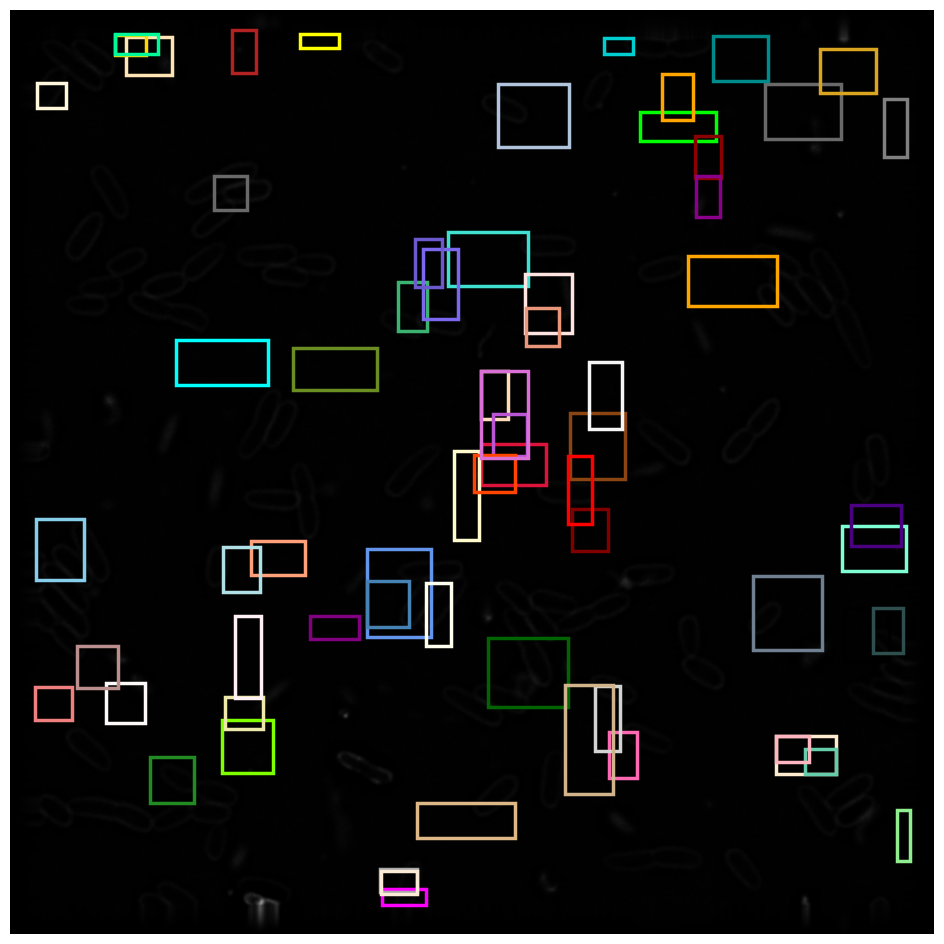

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:29:20.430 | INFO     | test_app:test_ceare_file_model:186 - (92, 21)
2023-04-27 17:29:20.452 | INFO     | test_app:test_ceare_file_model:206 - features shape (92, 22)


image dtype: uint16
final result shape:  (92, 21)
finish
41 20220916_TS008_1hr_1mindye_TET_5x_10_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 58ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv

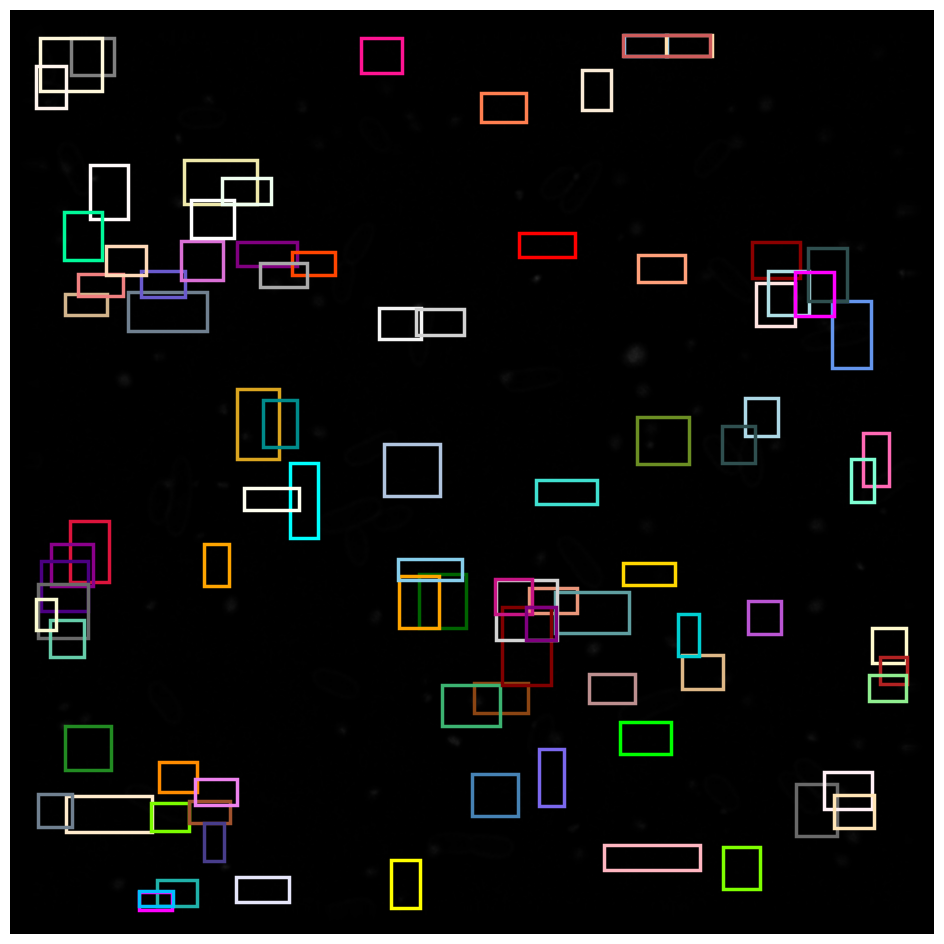

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:30:06.277 | INFO     | test_app:test_ceare_file_model:186 - (35, 21)
2023-04-27 17:30:06.296 | INFO     | test_app:test_ceare_file_model:206 - features shape (35, 22)


image dtype: uint16
final result shape:  (35, 21)
finish
42 20221007_TS008_1hr_AMP_5x_10_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 56ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv_bn_bias

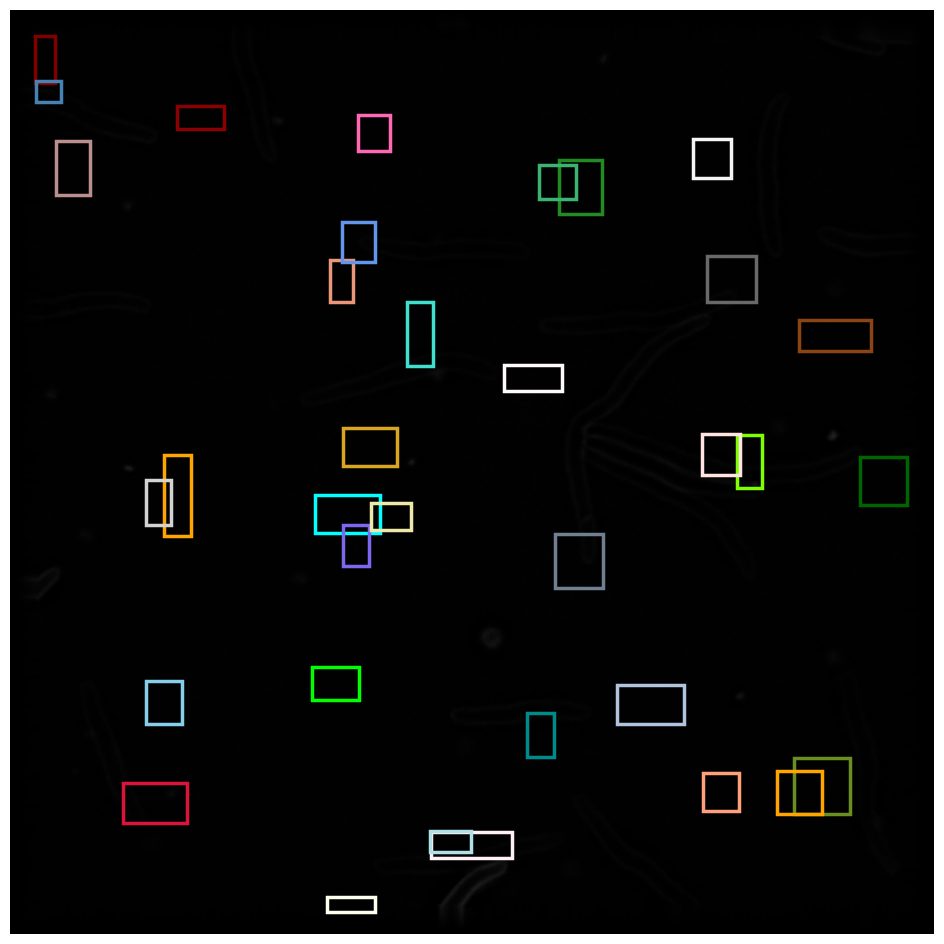

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:30:52.274 | INFO     | test_app:test_ceare_file_model:186 - (19, 21)
2023-04-27 17:30:52.293 | INFO     | test_app:test_ceare_file_model:206 - features shape (19, 22)


image dtype: uint16
final result shape:  (19, 21)
finish
43 20221003_TS008_1hr_1mindye_AMP_5x_02_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 61ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv

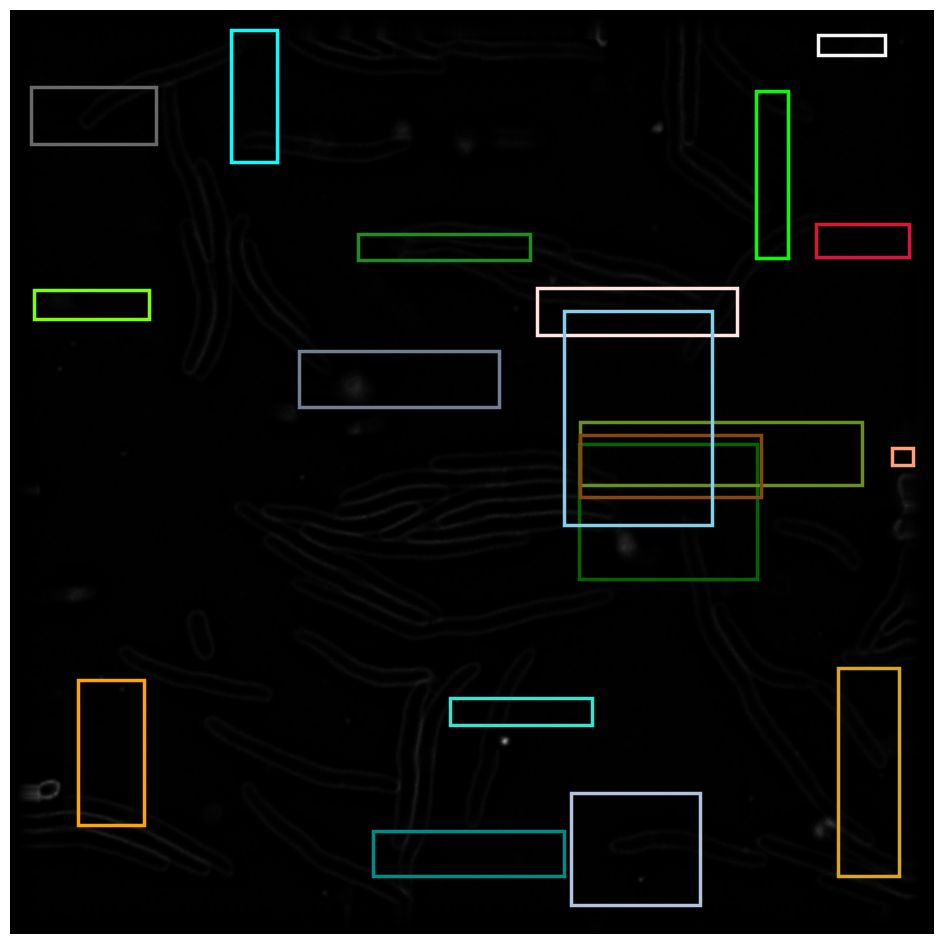

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:31:39.420 | INFO     | test_app:test_ceare_file_model:186 - (66, 21)
2023-04-27 17:31:39.446 | INFO     | test_app:test_ceare_file_model:206 - features shape (66, 22)


image dtype: uint16
final result shape:  (66, 21)
finish
44 20221003_TS008_1hr_1mindye_AMP_5x_08_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 58ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv

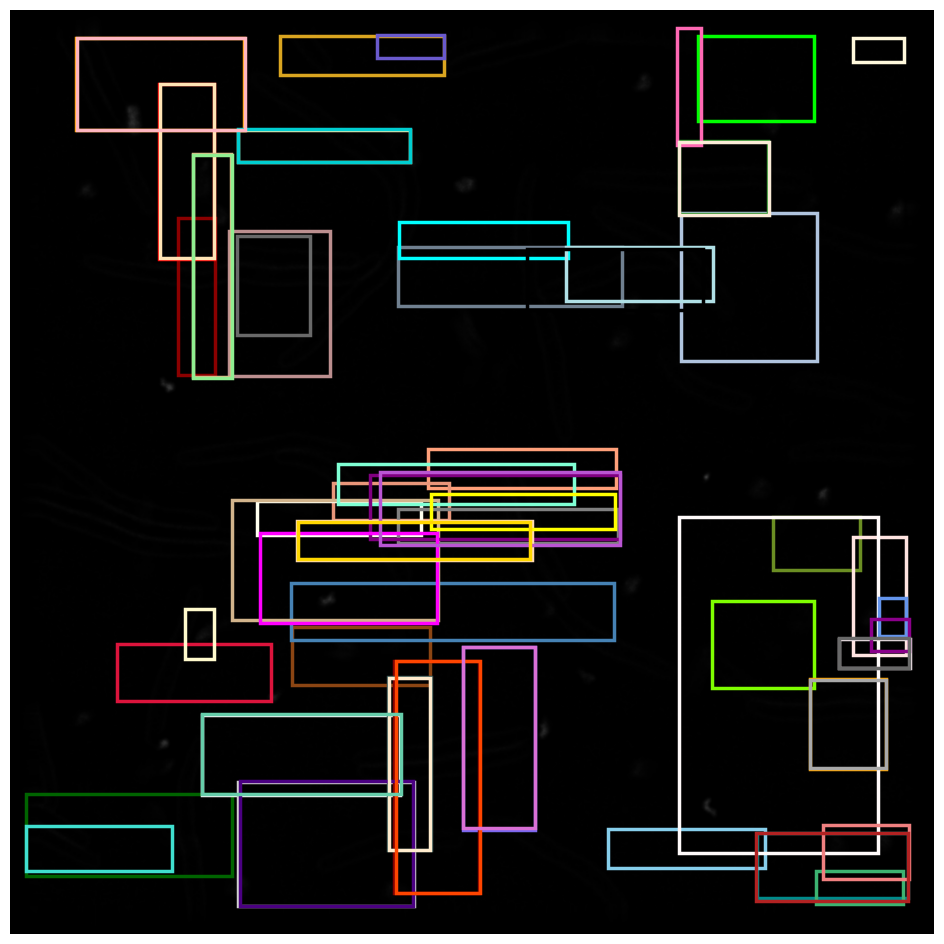

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:32:25.728 | INFO     | test_app:test_ceare_file_model:186 - (37, 21)
2023-04-27 17:32:25.750 | INFO     | test_app:test_ceare_file_model:206 - features shape (37, 22)


image dtype: uint16
final result shape:  (37, 21)
finish
45 20220916_TS008_1hr_1mindye_Amp_5x_03_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 58ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv

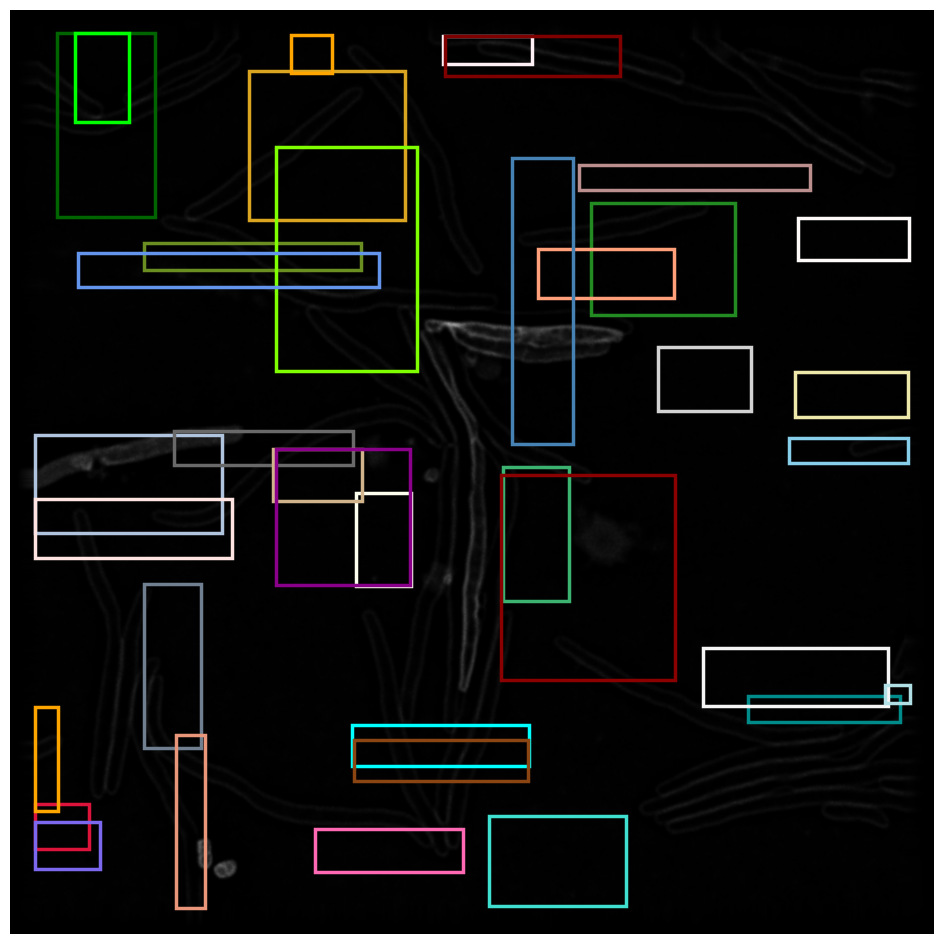

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:33:11.490 | INFO     | test_app:test_ceare_file_model:186 - (35, 21)
2023-04-27 17:33:11.516 | INFO     | test_app:test_ceare_file_model:206 - features shape (35, 22)


image dtype: uint16
final result shape:  (35, 21)
finish
46 20221012_TS008_1hr_1mindye_AMP_5x_15_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 57ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv

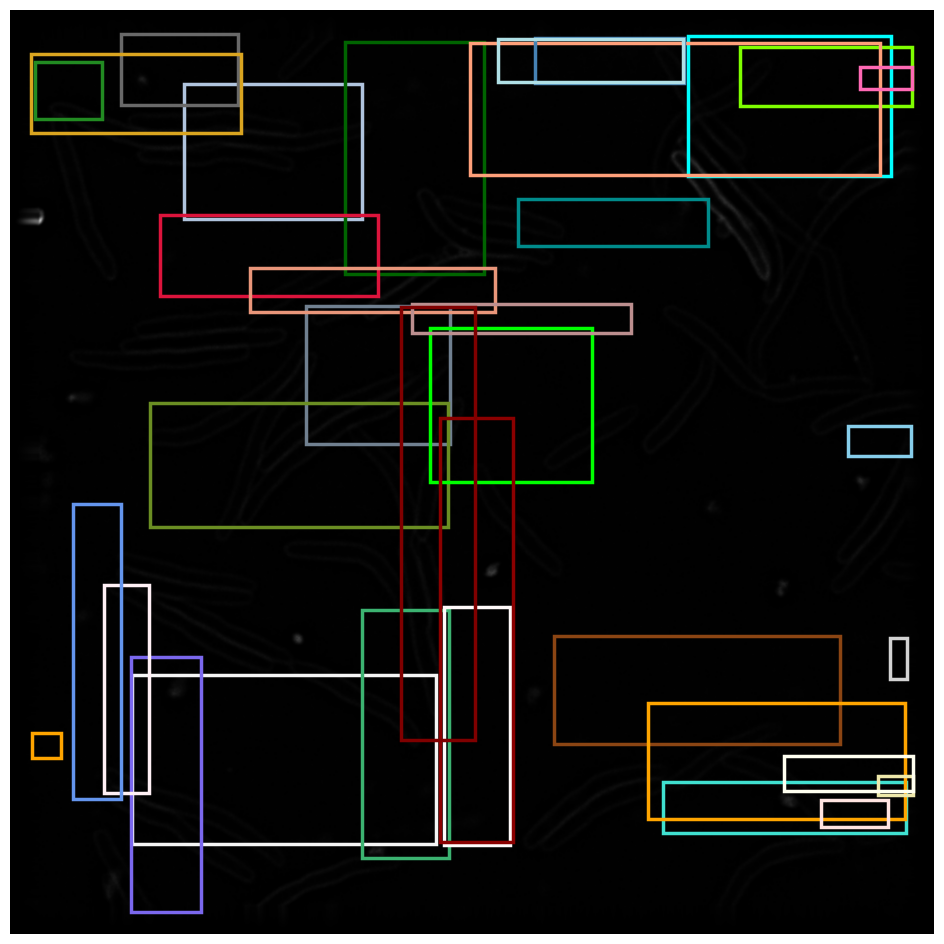

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:33:57.749 | INFO     | test_app:test_ceare_file_model:186 - (57, 21)
2023-04-27 17:33:57.775 | INFO     | test_app:test_ceare_file_model:206 - features shape (57, 22)


image dtype: uint16
final result shape:  (57, 21)
finish
47 20221007_TS008_1hr_AMP_5x_16_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 57ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv_bn_bias

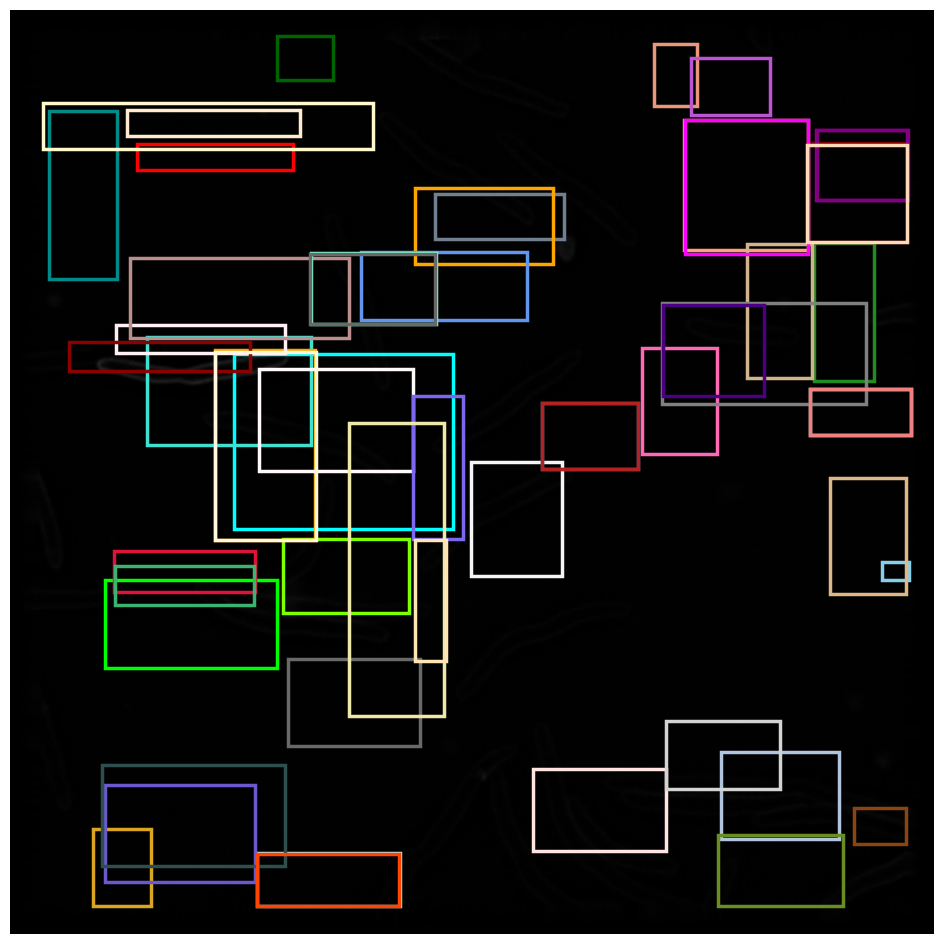

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:34:43.989 | INFO     | test_app:test_ceare_file_model:186 - (28, 21)
2023-04-27 17:34:44.010 | INFO     | test_app:test_ceare_file_model:206 - features shape (28, 22)


image dtype: uint16
final result shape:  (28, 21)
finish
48 20221011_TS008_1hr_1mindye_AMP_5x_17_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 57ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv

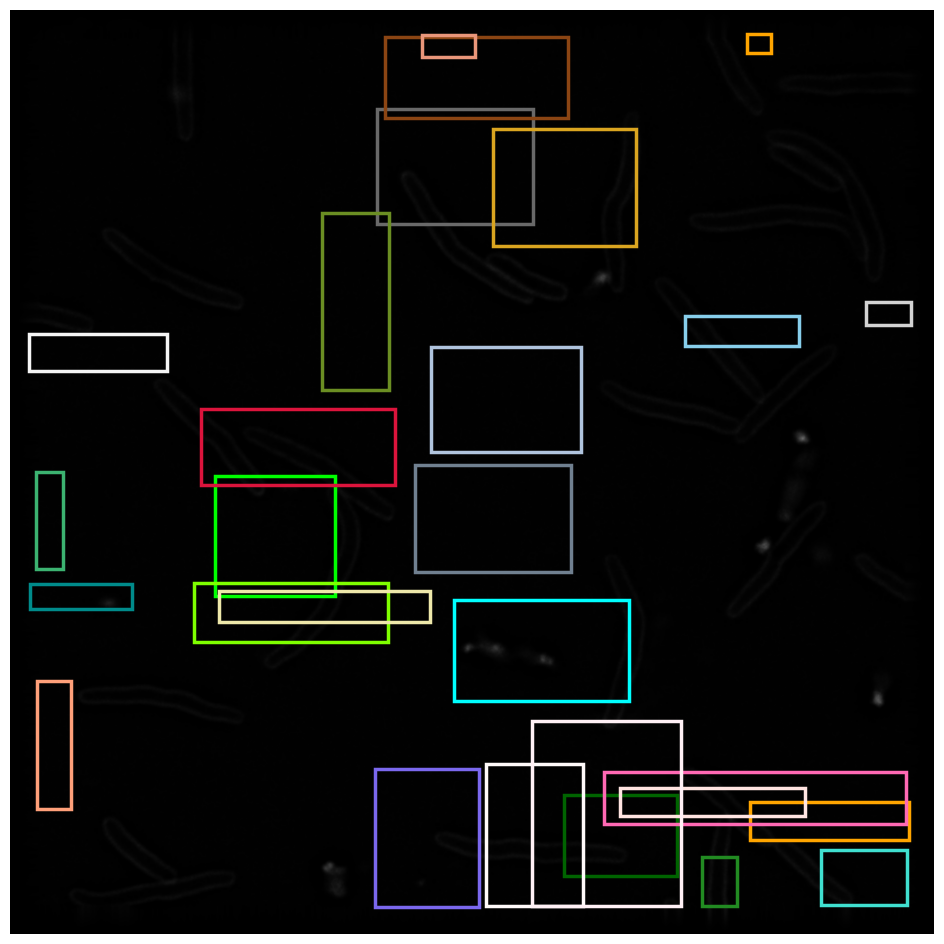

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:35:30.789 | INFO     | test_app:test_ceare_file_model:186 - (50, 21)
2023-04-27 17:35:30.810 | INFO     | test_app:test_ceare_file_model:206 - features shape (50, 22)


image dtype: uint16
final result shape:  (50, 21)
finish
49 20221007_TS008_1hr_RIF_5x_11_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 58ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv_bn_bias

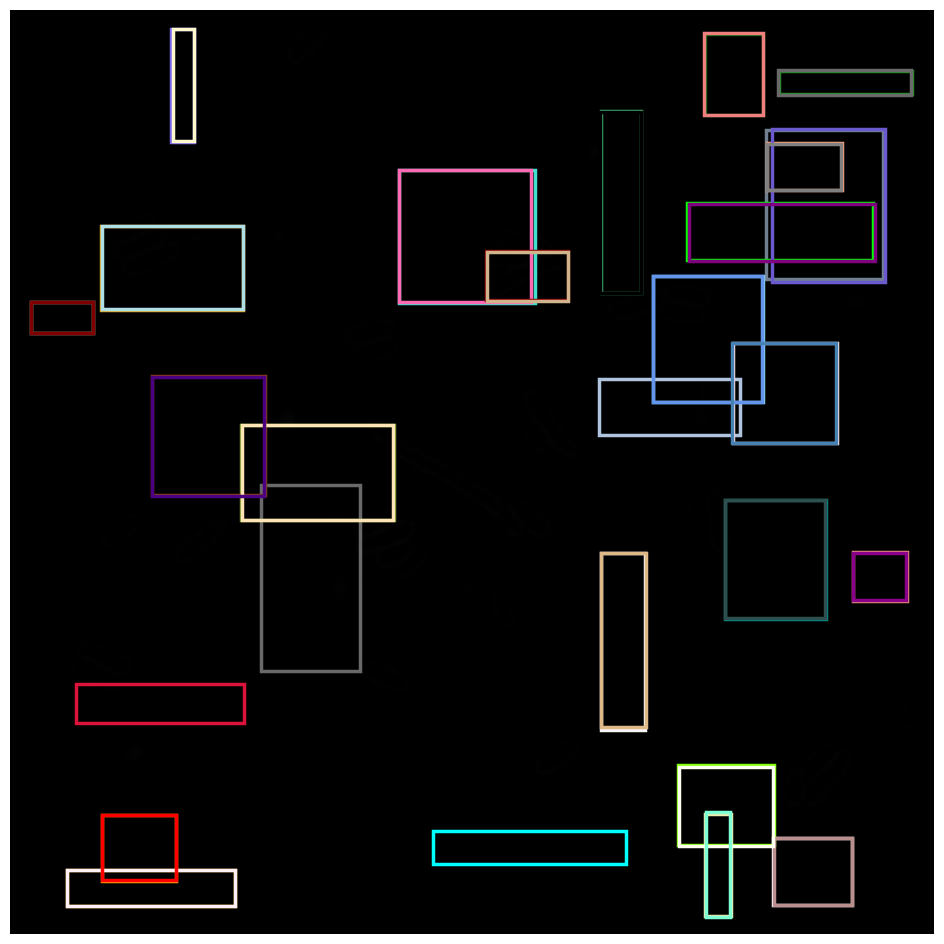

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:36:17.385 | INFO     | test_app:test_ceare_file_model:186 - (45, 21)
2023-04-27 17:36:17.401 | INFO     | test_app:test_ceare_file_model:206 - features shape (45, 22)


image dtype: uint16
final result shape:  (45, 21)
finish
50 20221011_TS008_1hr_1mindye_RIF_5x_10_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 58ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv

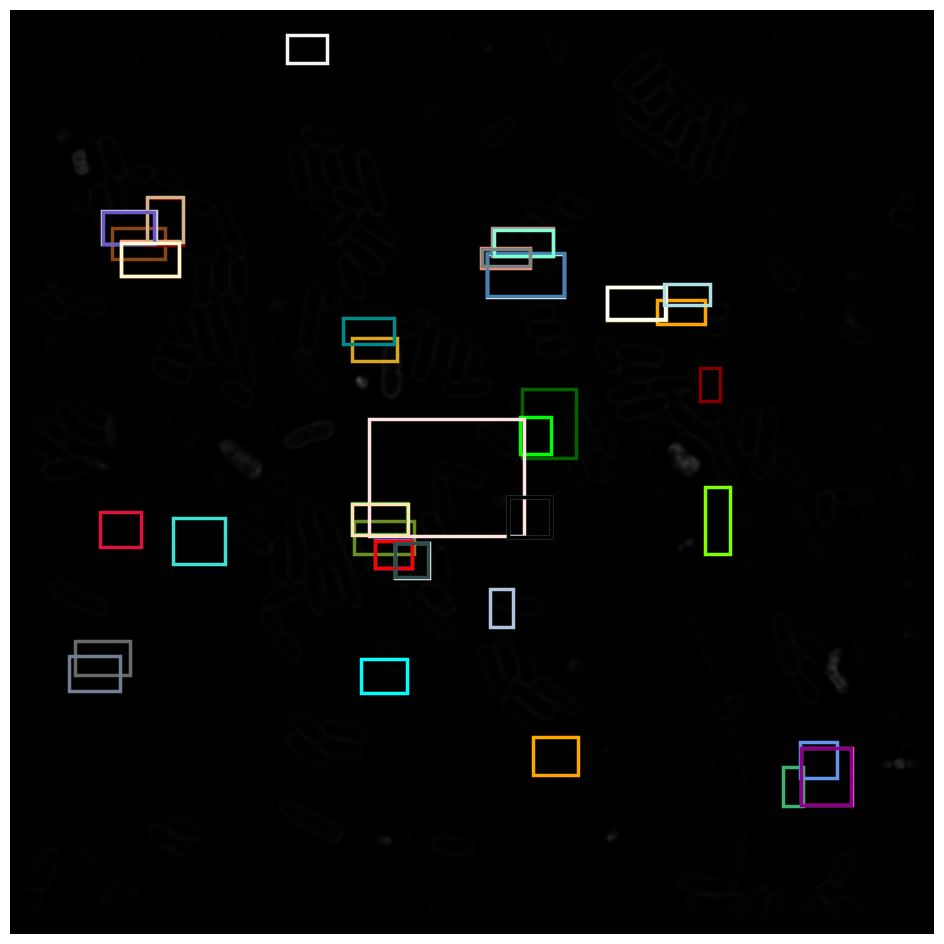

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:37:05.648 | INFO     | test_app:test_ceare_file_model:186 - (118, 21)
2023-04-27 17:37:05.673 | INFO     | test_app:test_ceare_file_model:206 - features shape (118, 22)


image dtype: uint16
final result shape:  (118, 21)
finish
51 20220916_TS008_1hr_1mindye_RAF_5x_08_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 57ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_con

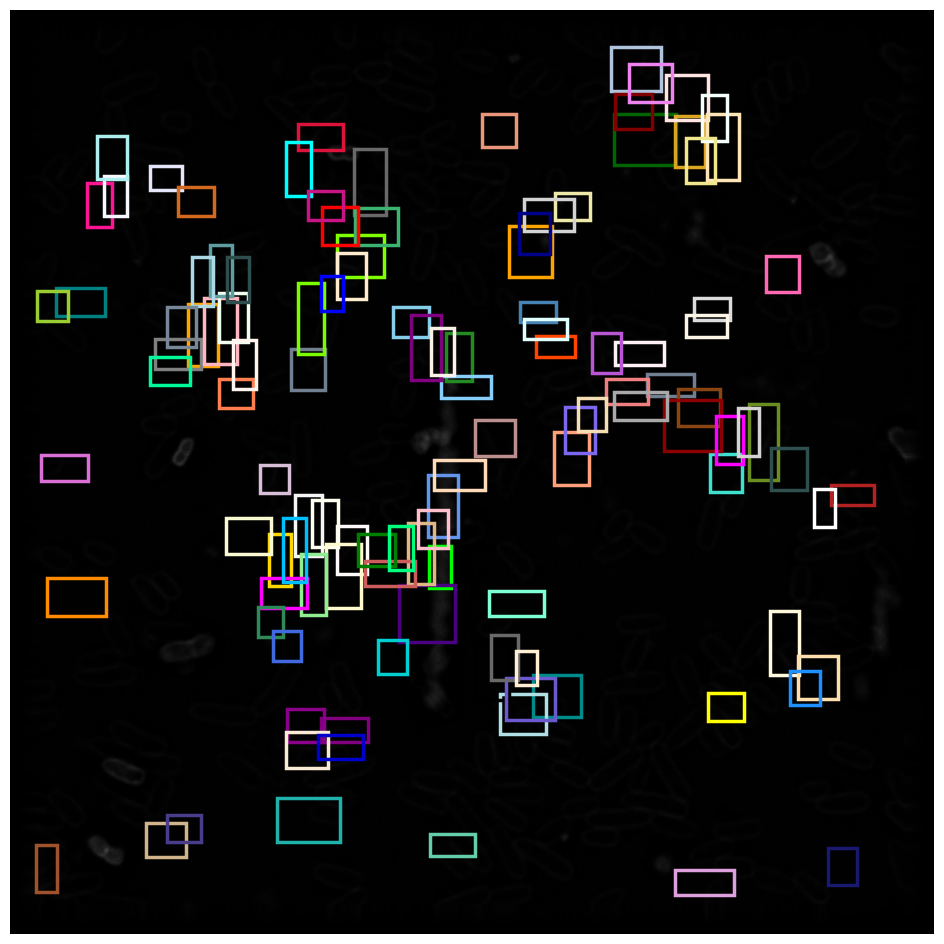

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:37:53.404 | INFO     | test_app:test_ceare_file_model:186 - (125, 21)
2023-04-27 17:37:53.435 | INFO     | test_app:test_ceare_file_model:206 - features shape (125, 22)


image dtype: uint16
final result shape:  (125, 21)
finish
52 20221011_2_TS008_1hr_1mindye_RIF_5x_16_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 57ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_c

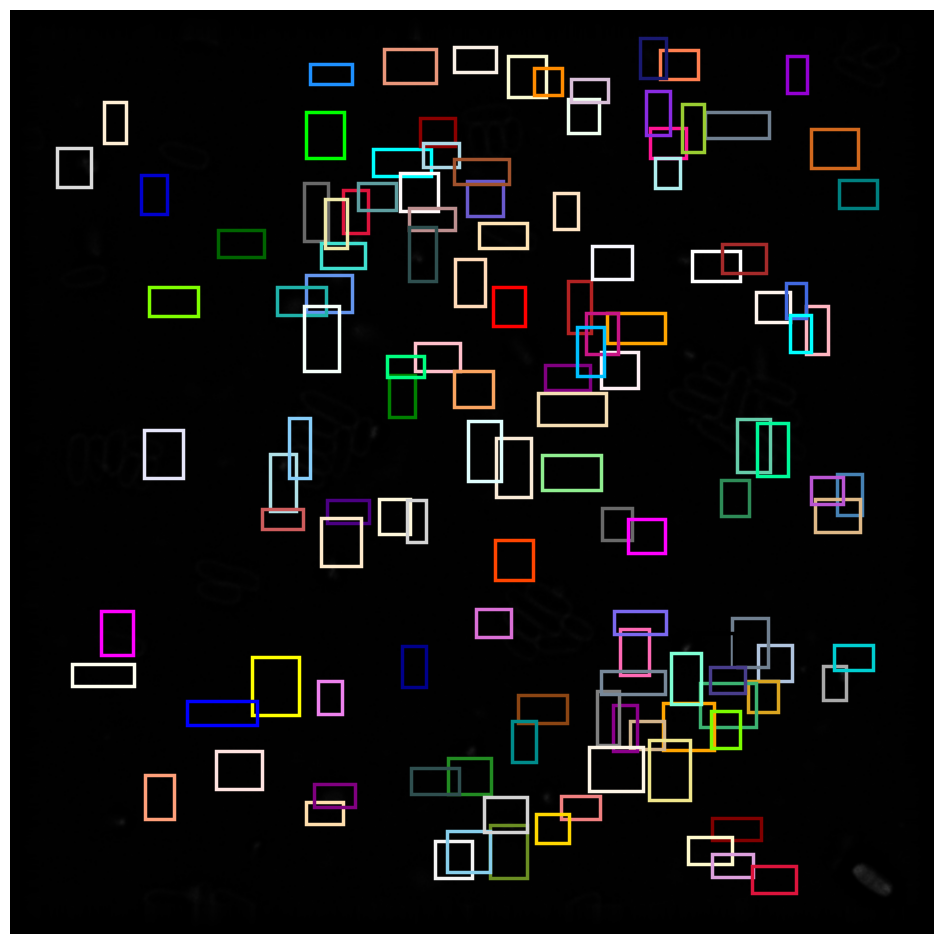

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:38:39.508 | INFO     | test_app:test_ceare_file_model:186 - (47, 21)
2023-04-27 17:38:39.526 | INFO     | test_app:test_ceare_file_model:206 - features shape (47, 22)


image dtype: uint16
final result shape:  (47, 21)
finish
53 20221011_2_TS008_1hr_1mindye_RIF_5x_04_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 59ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_co

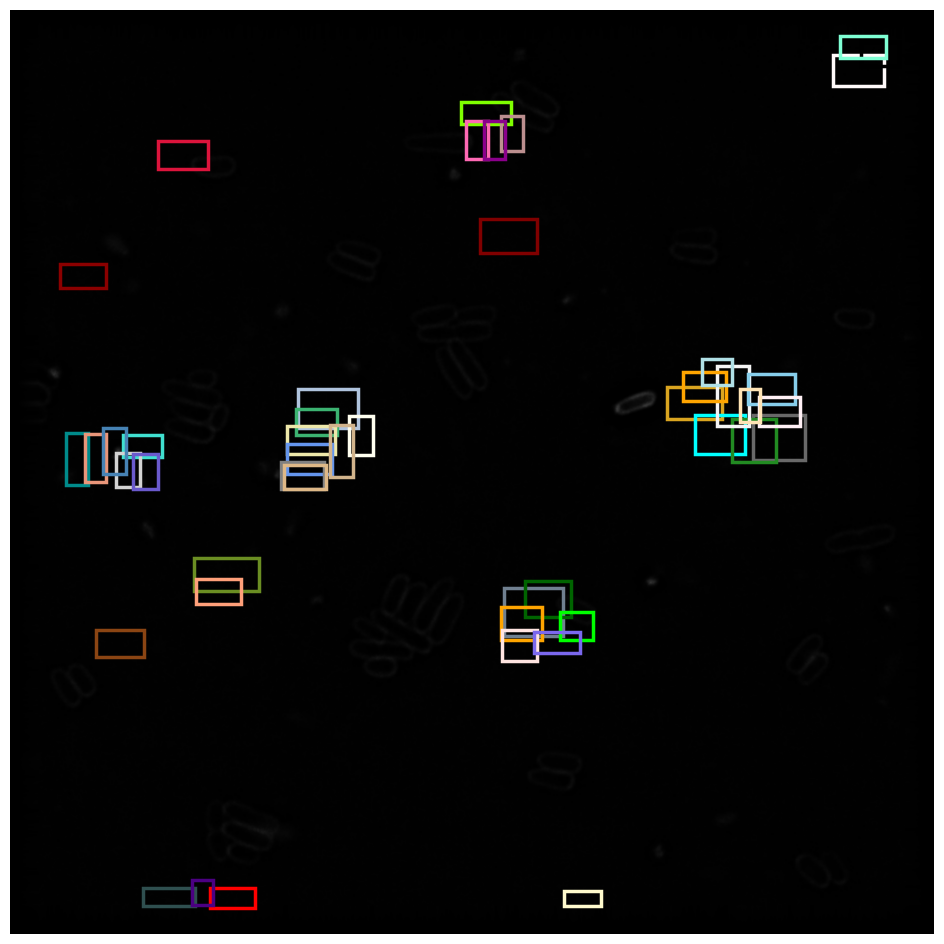

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:39:26.154 | INFO     | test_app:test_ceare_file_model:186 - (44, 21)
2023-04-27 17:39:26.172 | INFO     | test_app:test_ceare_file_model:206 - features shape (44, 22)


image dtype: uint16
final result shape:  (44, 21)
finish
54 20221011_2_TS008_1hr_1mindye_RIF_5x_09_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 58ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_co

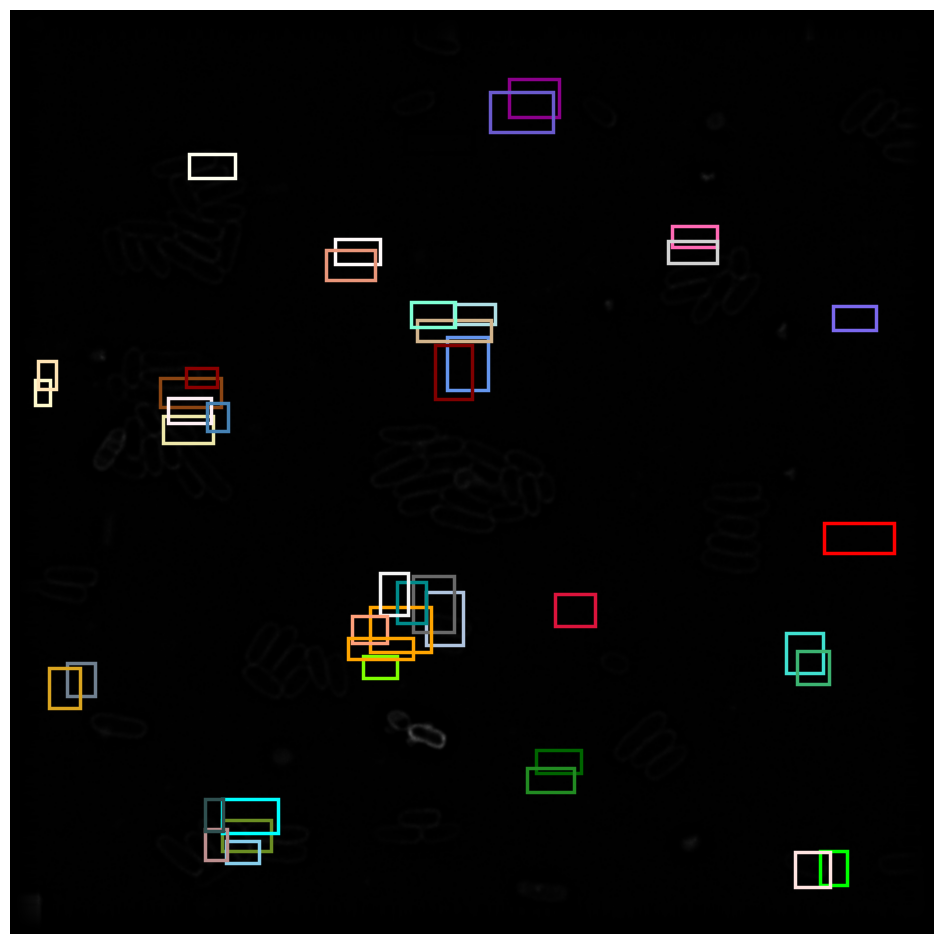

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:40:13.859 | INFO     | test_app:test_ceare_file_model:186 - (88, 21)
2023-04-27 17:40:13.879 | INFO     | test_app:test_ceare_file_model:206 - features shape (88, 22)


image dtype: uint16
final result shape:  (88, 21)
finish
55 20221011_TS008_1hr_1mindye_RIF_5x_16_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 59ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv

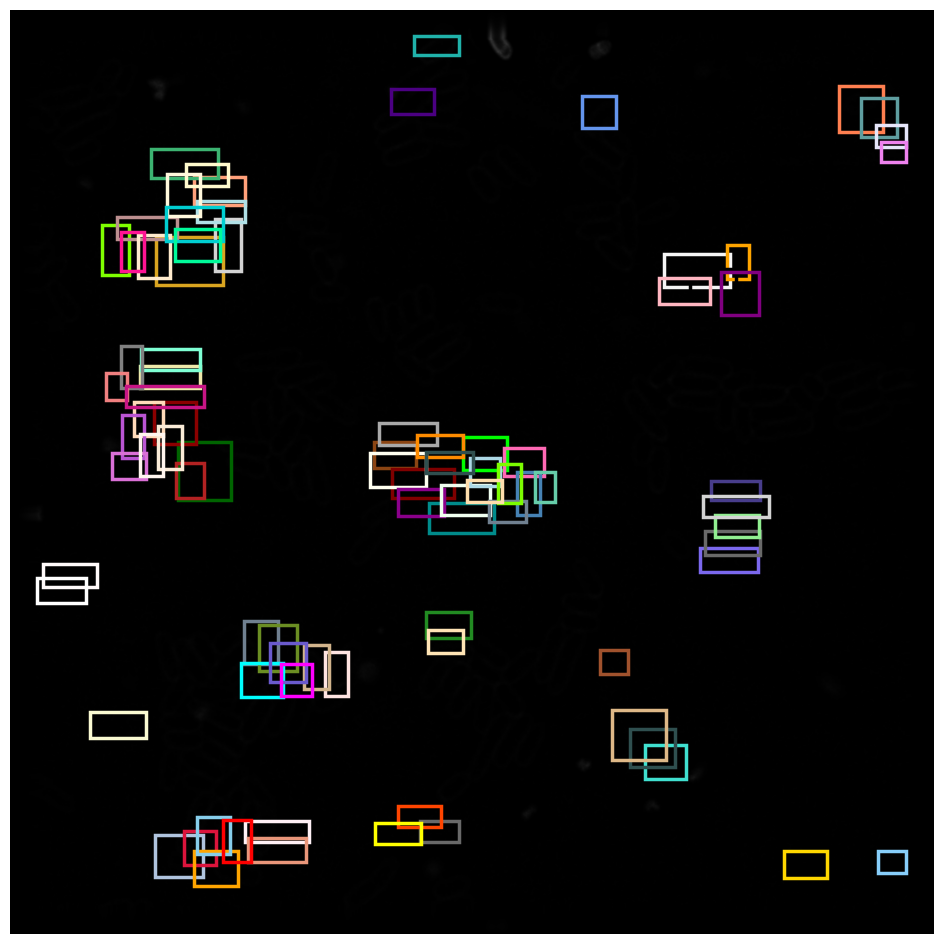

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:41:01.981 | INFO     | test_app:test_ceare_file_model:186 - (109, 21)
2023-04-27 17:41:02.005 | INFO     | test_app:test_ceare_file_model:206 - features shape (109, 22)


image dtype: uint16
final result shape:  (109, 21)
finish
56 20220916_TS008_1hr_1mindye_RAF_5x_06_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 59ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_con

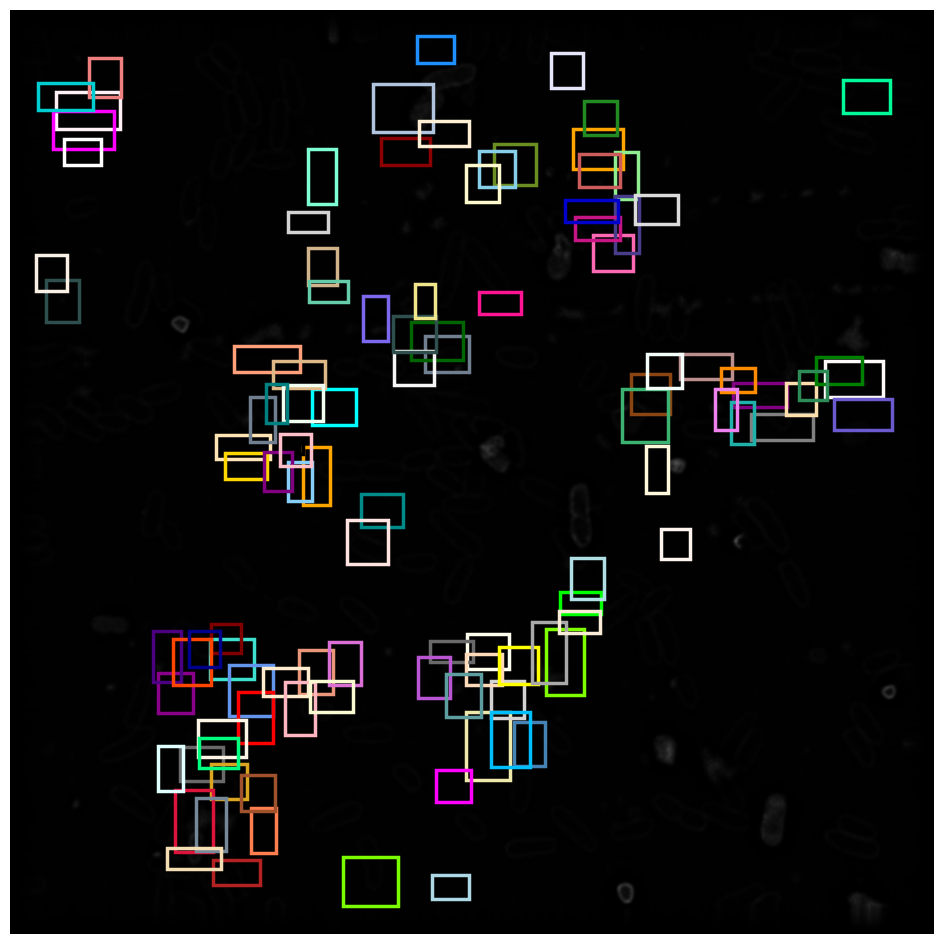

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:41:49.353 | INFO     | test_app:test_ceare_file_model:186 - (106, 21)
2023-04-27 17:41:49.379 | INFO     | test_app:test_ceare_file_model:206 - features shape (106, 22)


image dtype: uint16
final result shape:  (106, 21)
finish
57 20220916_TS008_1hr_1mindye_CIP_5x_04_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 60ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_con

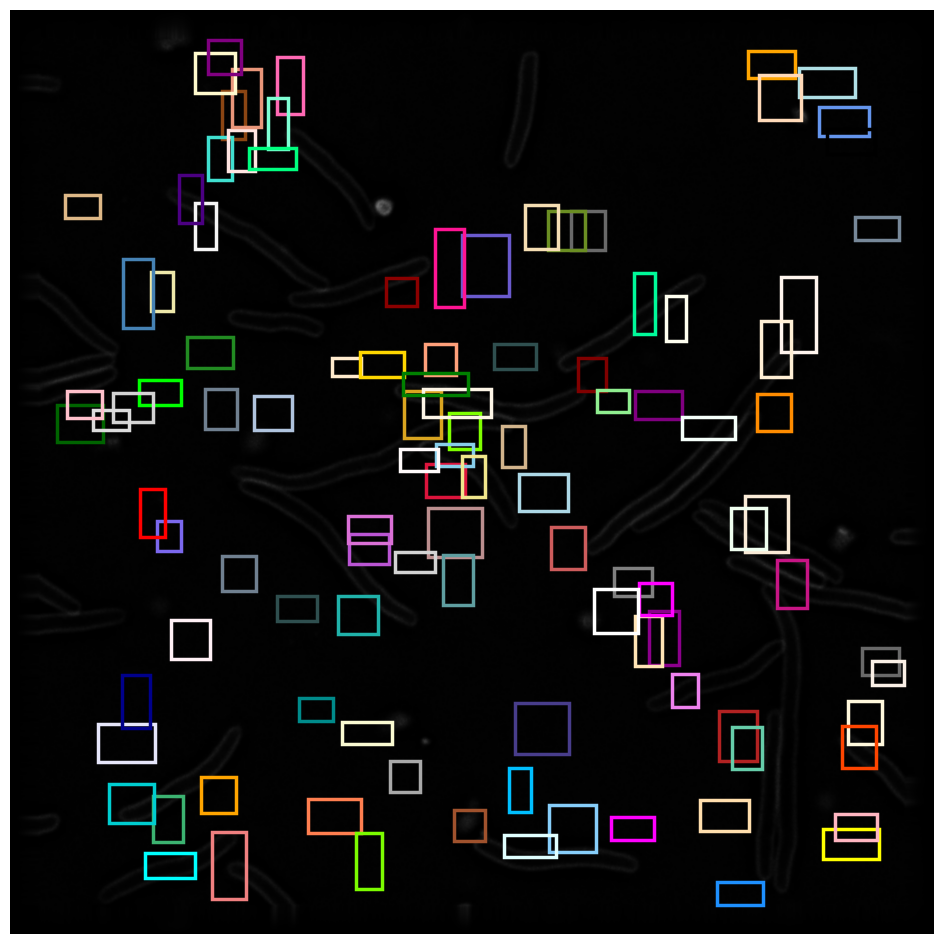

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:42:36.303 | INFO     | test_app:test_ceare_file_model:186 - (55, 21)
2023-04-27 17:42:36.326 | INFO     | test_app:test_ceare_file_model:206 - features shape (55, 22)


image dtype: uint16
final result shape:  (55, 21)
finish
58 20221011_2_TS008_1hr_1mindye_CIP_5x_03_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 58ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_co

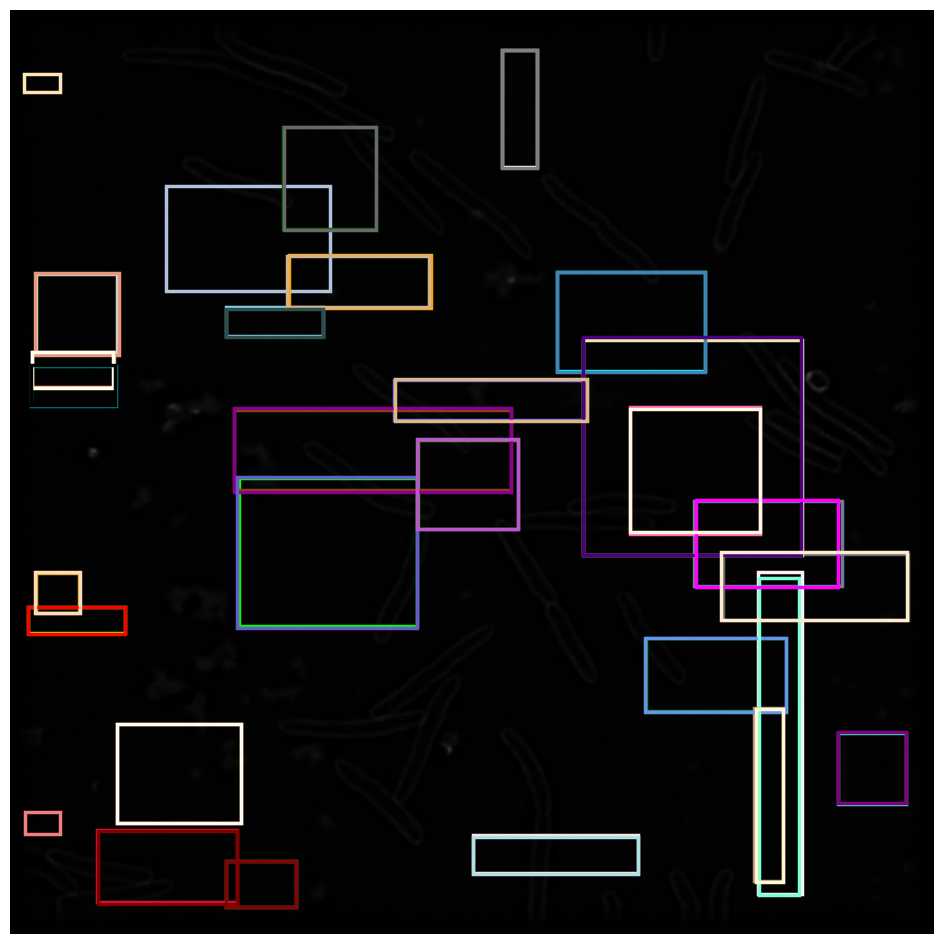

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:43:22.778 | INFO     | test_app:test_ceare_file_model:186 - (32, 21)
2023-04-27 17:43:22.807 | INFO     | test_app:test_ceare_file_model:206 - features shape (32, 22)


image dtype: uint16
final result shape:  (32, 21)
finish
59 20221011_2_TS008_1hr_1mindye_CIP_5x_12_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 98ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_co

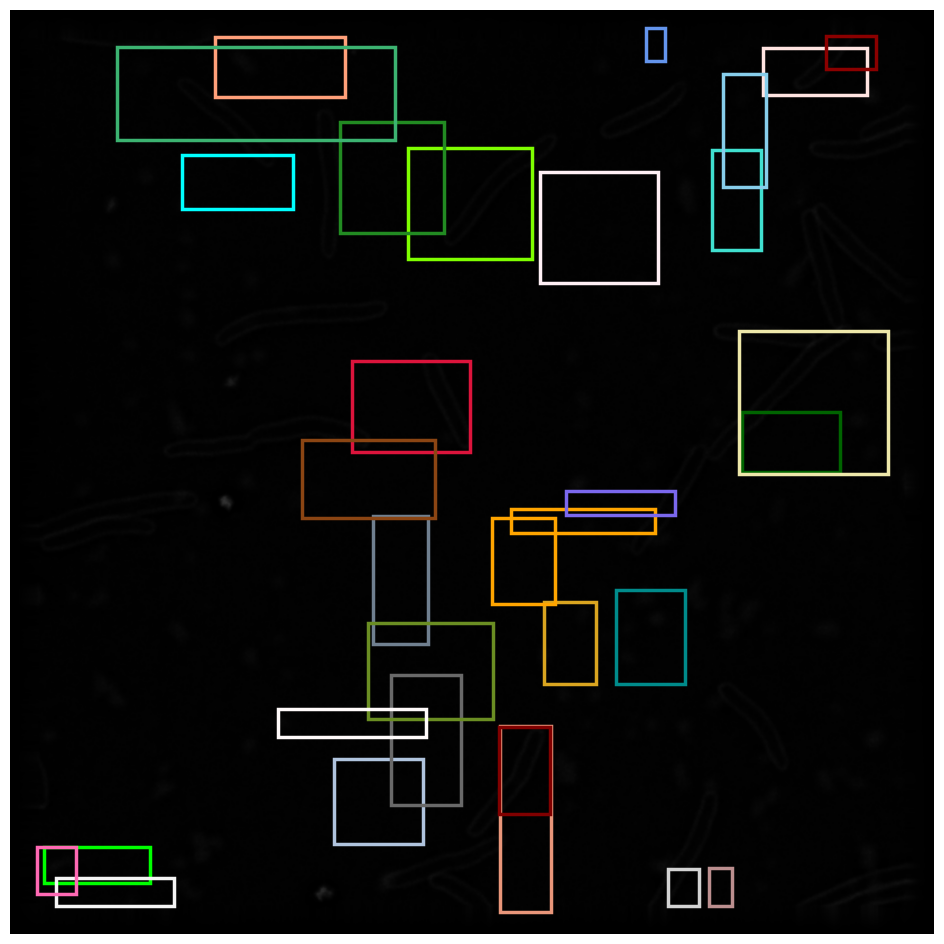

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:44:08.990 | INFO     | test_app:test_ceare_file_model:186 - (27, 21)
2023-04-27 17:44:09.014 | INFO     | test_app:test_ceare_file_model:206 - features shape (27, 22)


image dtype: uint16
final result shape:  (27, 21)
finish
60 20221011_TS008_1hr_1mindye_CIP_5x_20_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 59ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv

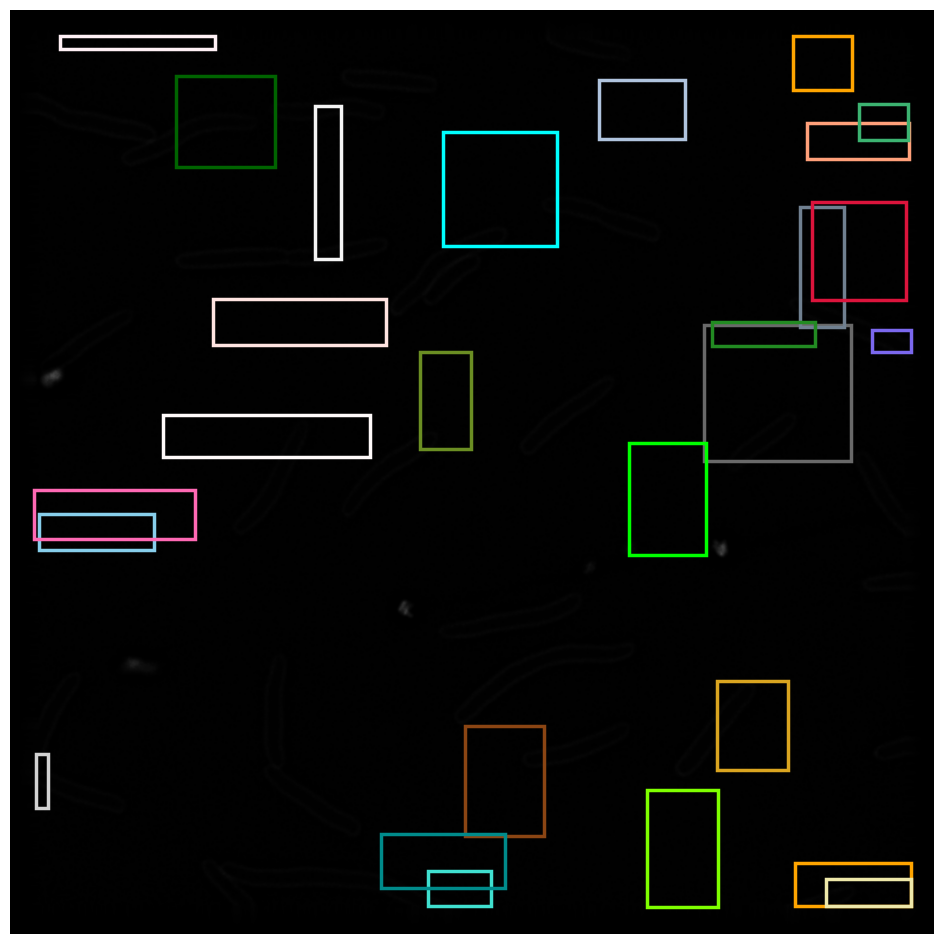

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:44:55.331 | INFO     | test_app:test_ceare_file_model:186 - (31, 21)
2023-04-27 17:44:55.349 | INFO     | test_app:test_ceare_file_model:206 - features shape (31, 22)


image dtype: uint16
final result shape:  (31, 21)
finish
61 20221003_TS008_1hr_1mindye_CIP_5x_01_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 61ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv

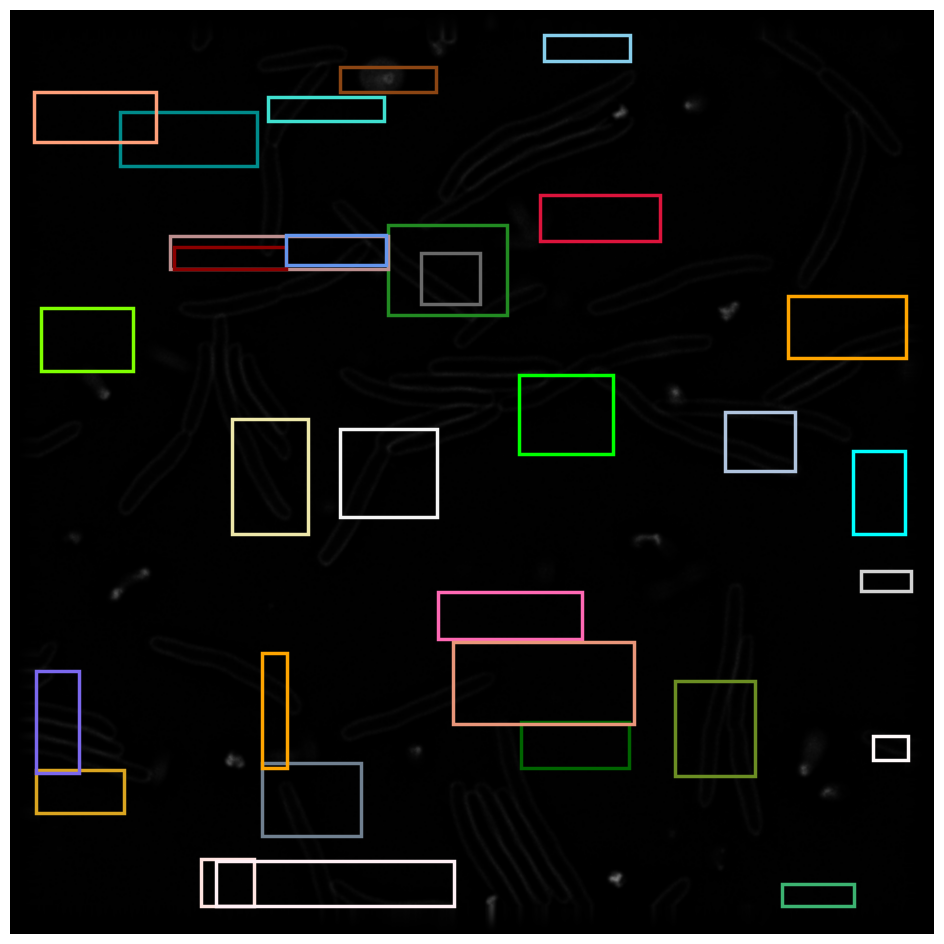

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:45:41.385 | INFO     | test_app:test_ceare_file_model:186 - (44, 21)
2023-04-27 17:45:41.408 | INFO     | test_app:test_ceare_file_model:206 - features shape (44, 22)


image dtype: uint16
final result shape:  (44, 21)
finish
62 20220916_TS008_1hr_1mindye_CIP_5x_02_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 61ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv

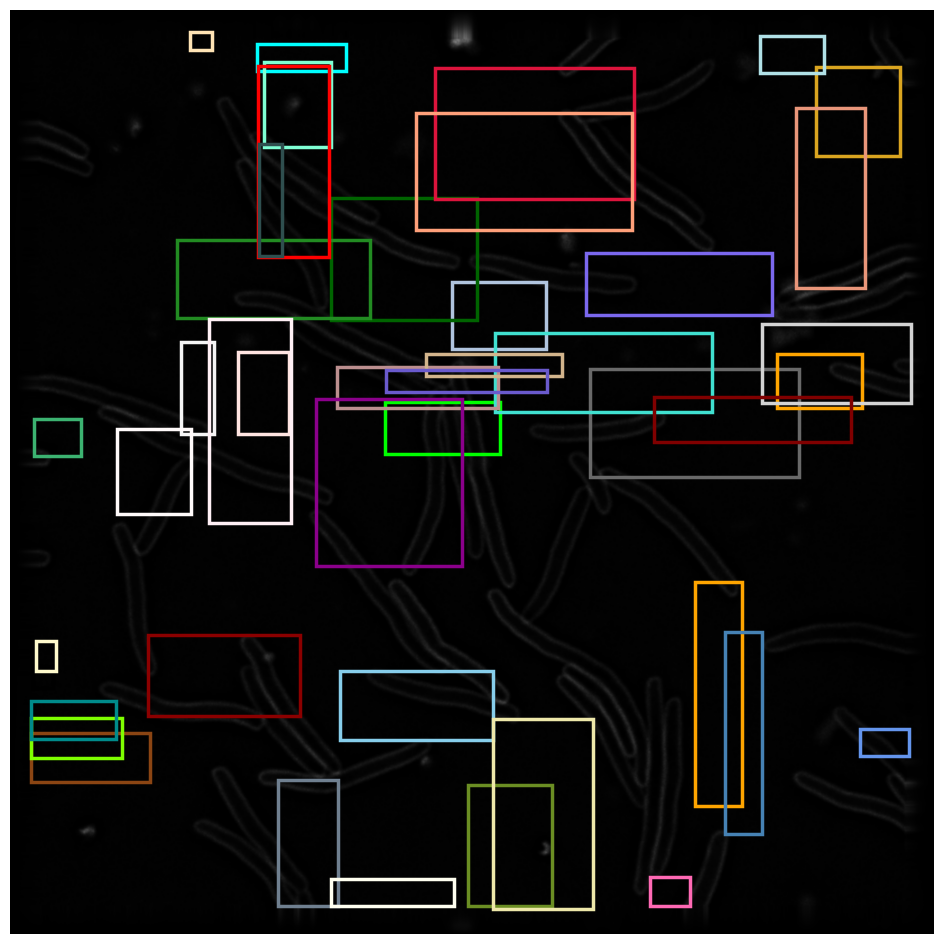

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:46:28.058 | INFO     | test_app:test_ceare_file_model:186 - (46, 21)
2023-04-27 17:46:28.084 | INFO     | test_app:test_ceare_file_model:206 - features shape (46, 22)


image dtype: uint16
final result shape:  (46, 21)
finish
63 20221228_TS008_1hr_1mindye_MEC_1x_47_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 62ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv

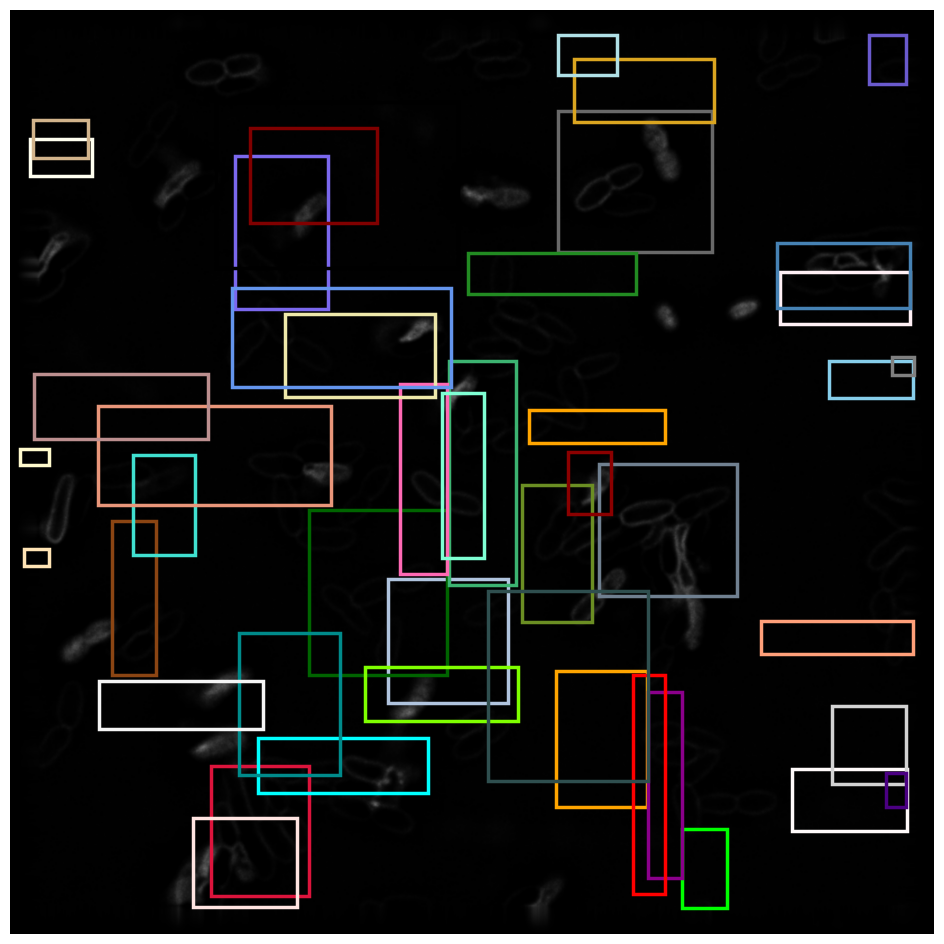

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:47:16.087 | INFO     | test_app:test_ceare_file_model:186 - (103, 21)
2023-04-27 17:47:16.111 | INFO     | test_app:test_ceare_file_model:206 - features shape (103, 22)


image dtype: uint16
final result shape:  (103, 21)
finish
64 20230125_TS008_1hr_1mindye_MEC_1x_19_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 58ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_con

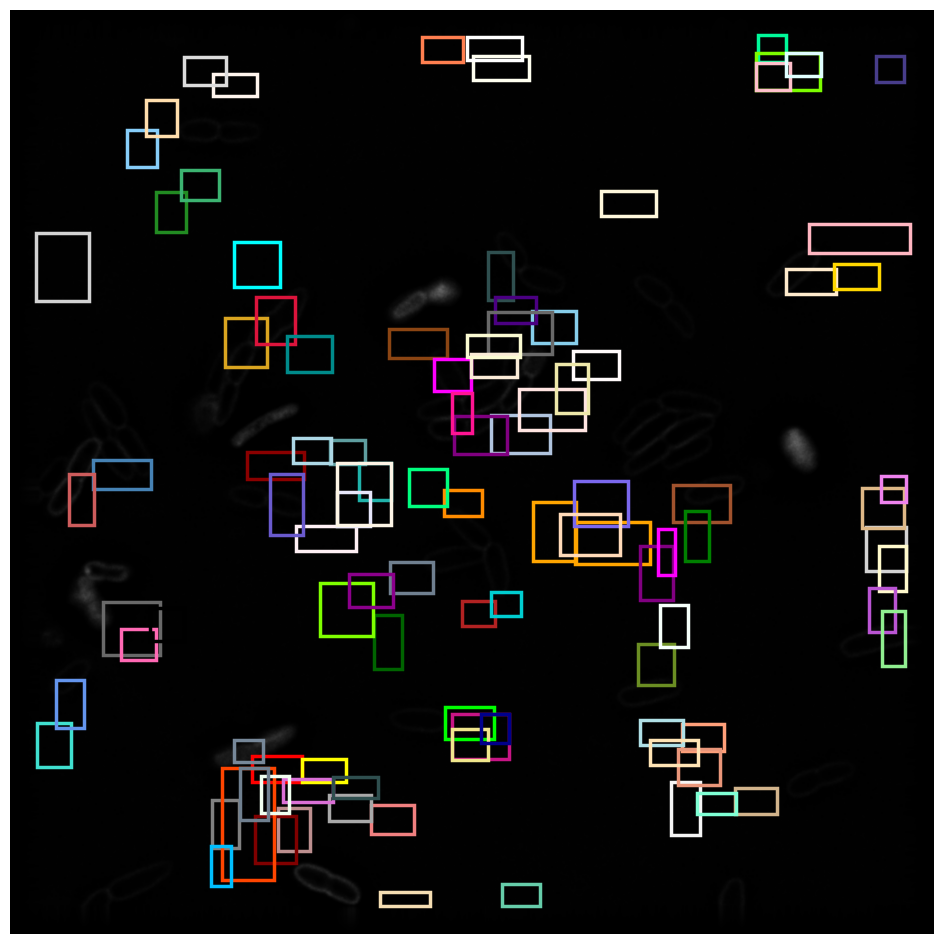

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:48:02.720 | INFO     | test_app:test_ceare_file_model:186 - (42, 21)
2023-04-27 17:48:02.739 | INFO     | test_app:test_ceare_file_model:206 - features shape (42, 22)


image dtype: uint16
final result shape:  (42, 21)
finish
65 20221228_TS008_1hr_1mindye_MEC_1x_22_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 59ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv

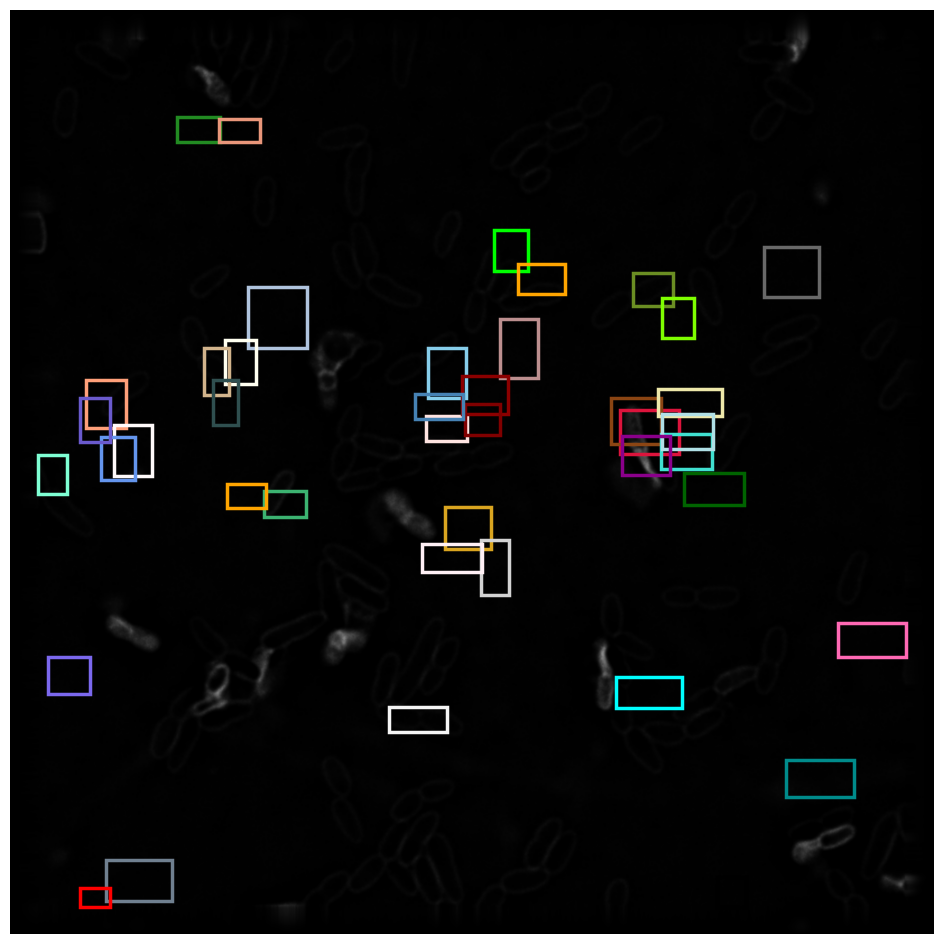

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:48:49.852 | INFO     | test_app:test_ceare_file_model:186 - (101, 21)
2023-04-27 17:48:49.877 | INFO     | test_app:test_ceare_file_model:206 - features shape (101, 22)


image dtype: uint16
final result shape:  (101, 21)
finish
66 20221228_TS008_1hr_1mindye_MEC_1x_50_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 60ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_con

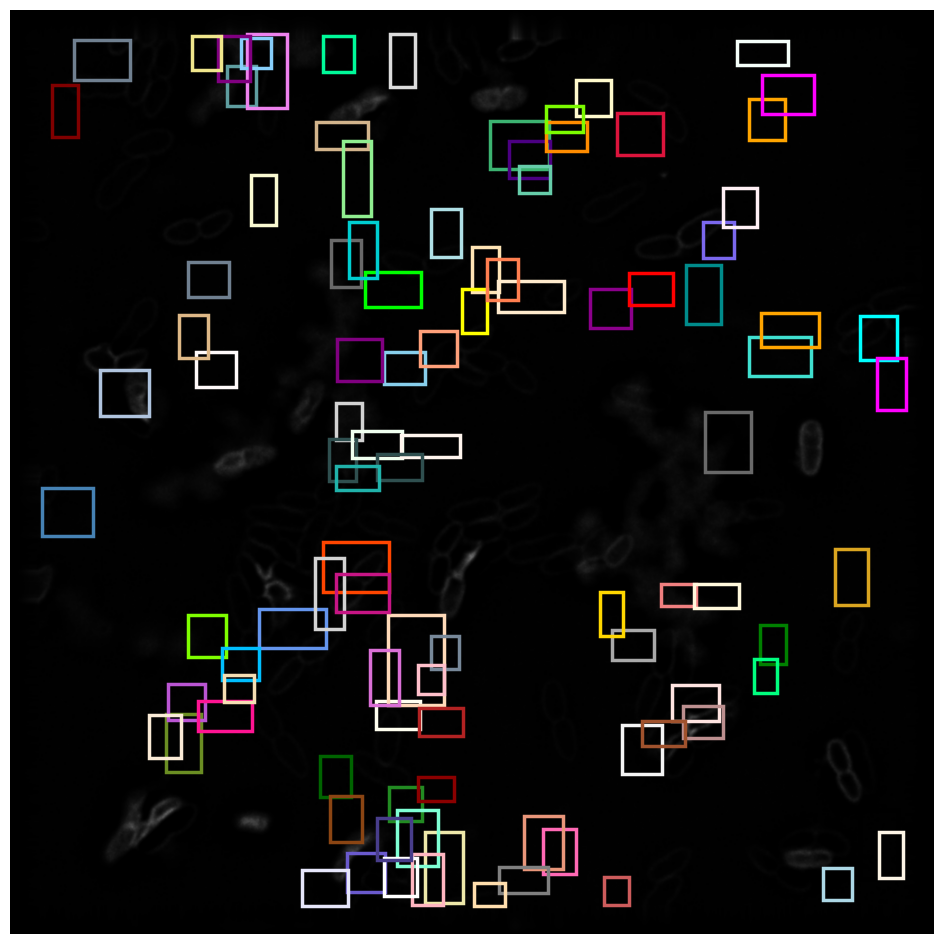

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:49:37.676 | INFO     | test_app:test_ceare_file_model:186 - (91, 21)
2023-04-27 17:49:37.699 | INFO     | test_app:test_ceare_file_model:206 - features shape (91, 22)


image dtype: uint16
final result shape:  (91, 21)
finish
67 20230110_TS008_1hr_1mindye_Mec_1x_25_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 60ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv

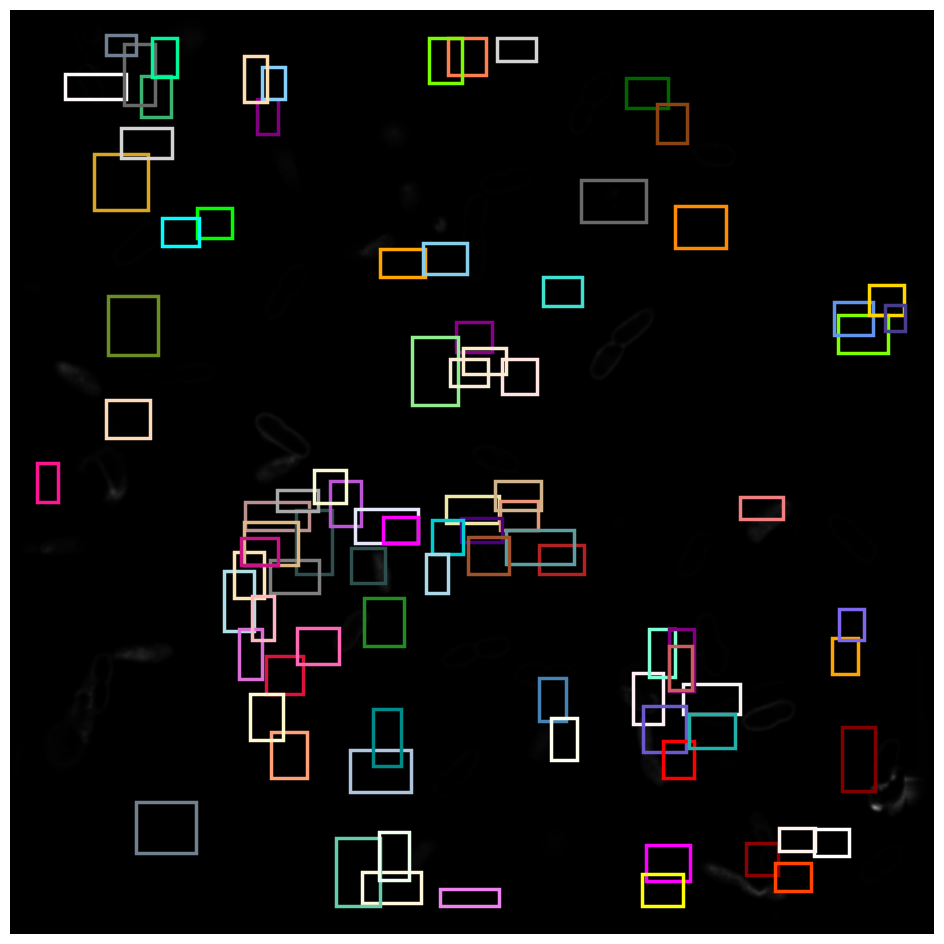

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:50:23.530 | INFO     | test_app:test_ceare_file_model:186 - (32, 21)
2023-04-27 17:50:23.548 | INFO     | test_app:test_ceare_file_model:206 - features shape (32, 22)


image dtype: uint16
final result shape:  (32, 21)
finish
68 20230125_TS008_1hr_1mindye_MEC_1x_05_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 60ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv

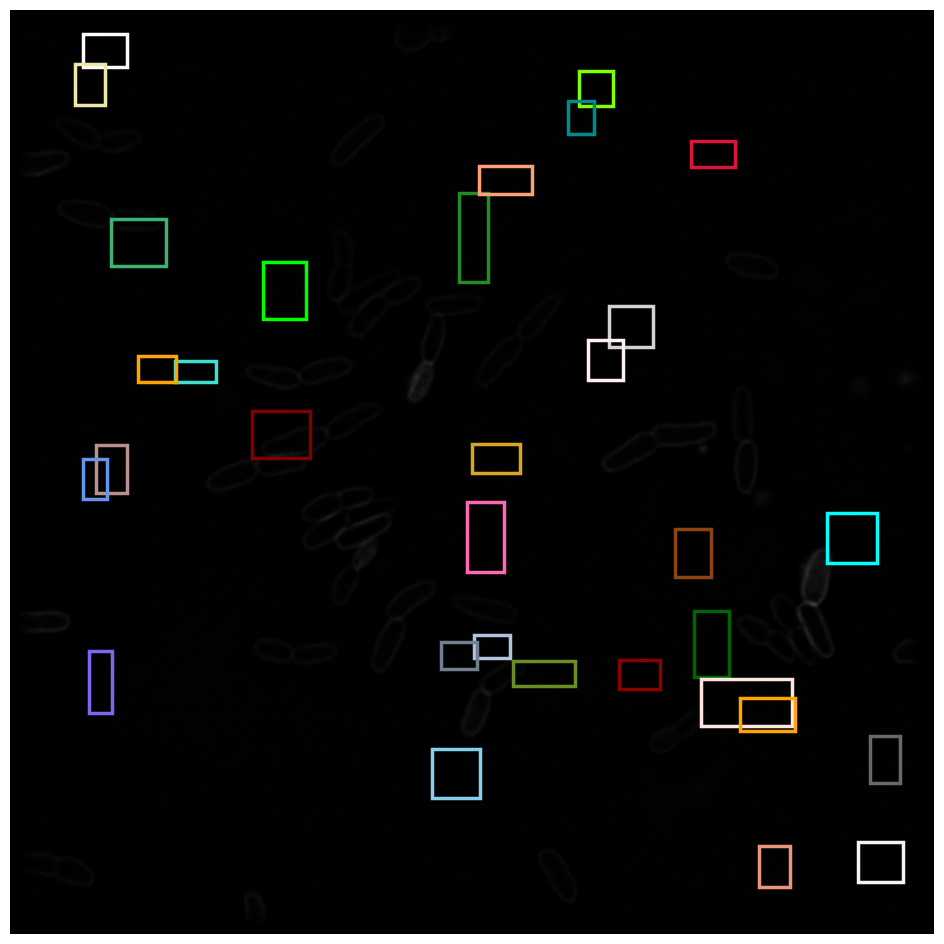

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:51:09.693 | INFO     | test_app:test_ceare_file_model:186 - (51, 21)
2023-04-27 17:51:09.711 | INFO     | test_app:test_ceare_file_model:206 - features shape (51, 22)


image dtype: uint16
final result shape:  (51, 21)
finish
69 20221228_TS008_1hr_1mindye_MEC_1x_43_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 60ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv

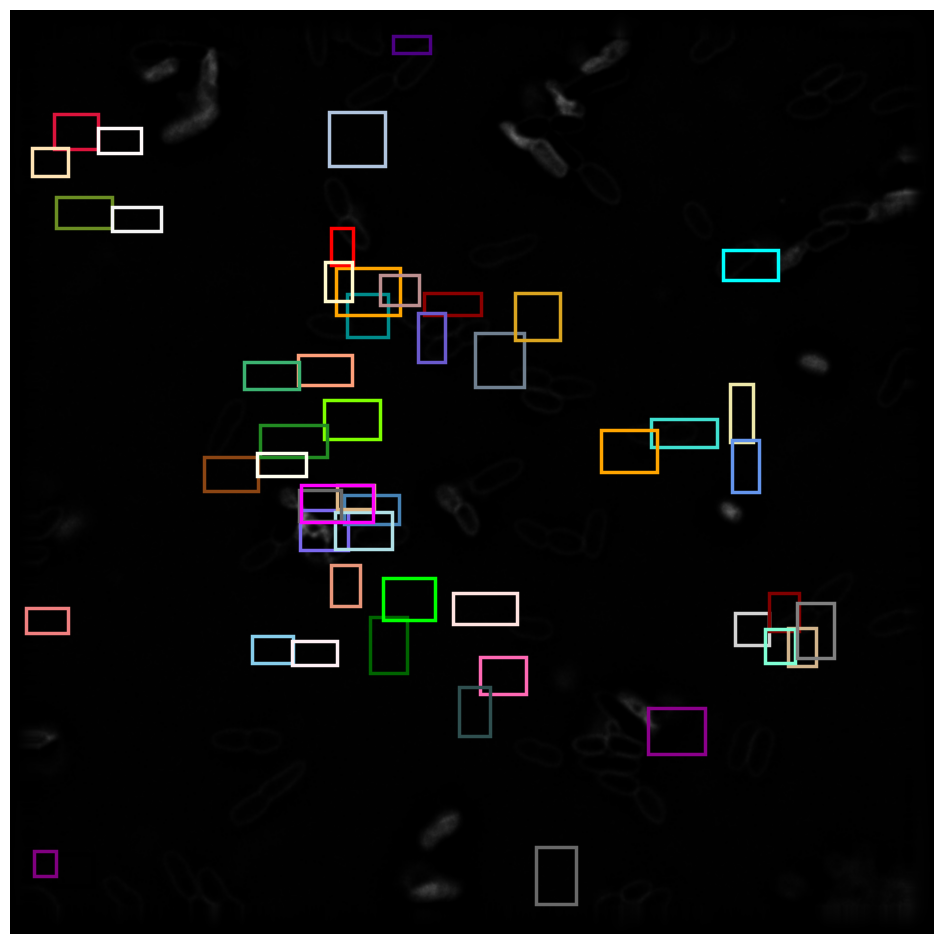

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:51:56.812 | INFO     | test_app:test_ceare_file_model:186 - (68, 21)
2023-04-27 17:51:56.834 | INFO     | test_app:test_ceare_file_model:206 - features shape (68, 22)


image dtype: uint16
final result shape:  (68, 21)
finish
70 20230110_TS008_1hr_1mindye_Mec_1x_24_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 59ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv

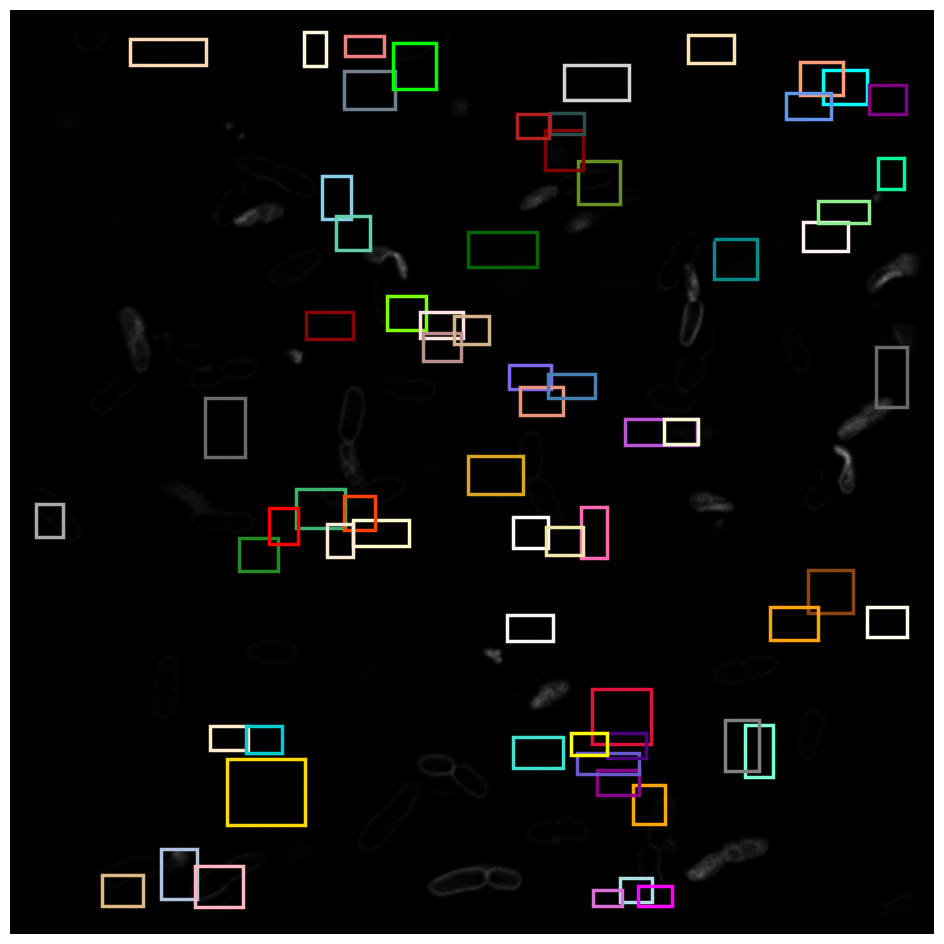

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:52:43.129 | INFO     | test_app:test_ceare_file_model:186 - (47, 21)
2023-04-27 17:52:43.148 | INFO     | test_app:test_ceare_file_model:206 - features shape (47, 22)


image dtype: uint16
final result shape:  (47, 21)
finish
71 20230125_TS008_1hr_1mindye_MEC_1x_16_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 62ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv

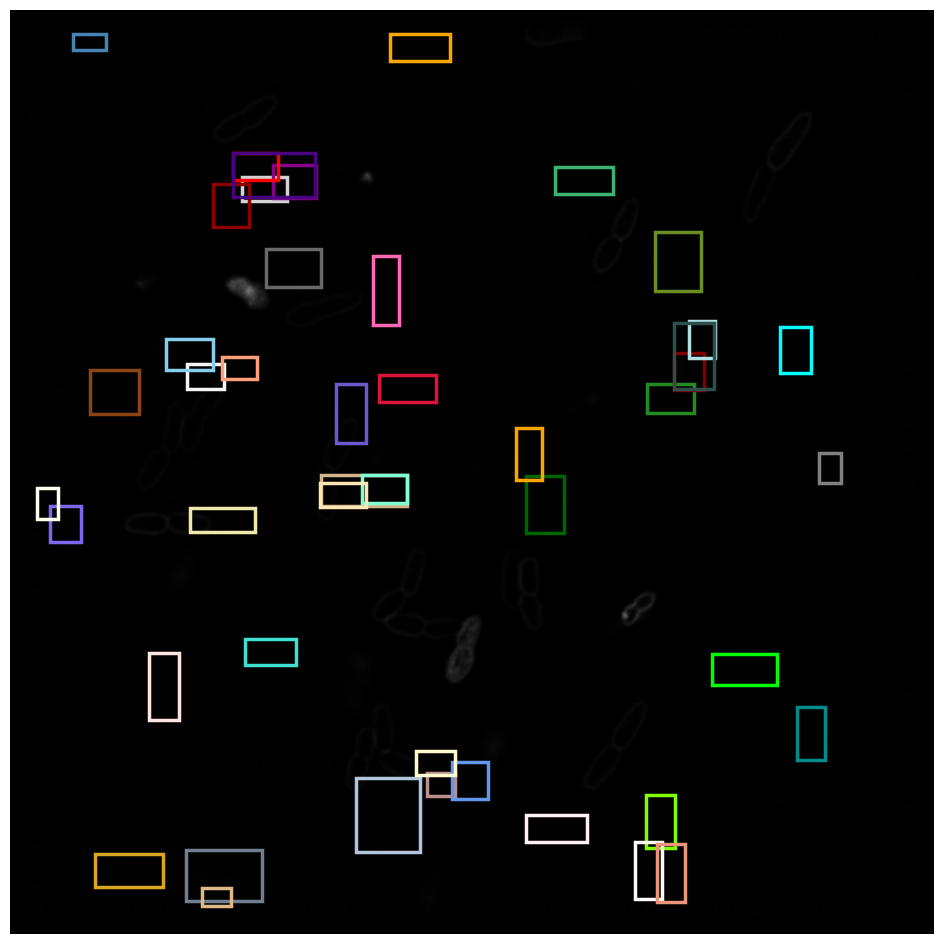

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:53:29.367 | INFO     | test_app:test_ceare_file_model:186 - (26, 21)
2023-04-27 17:53:29.384 | INFO     | test_app:test_ceare_file_model:206 - features shape (26, 22)


image dtype: uint16
final result shape:  (26, 21)
finish
72 20230110_TS008_1hr_1mindye_Mec_1x_19_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 63ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv

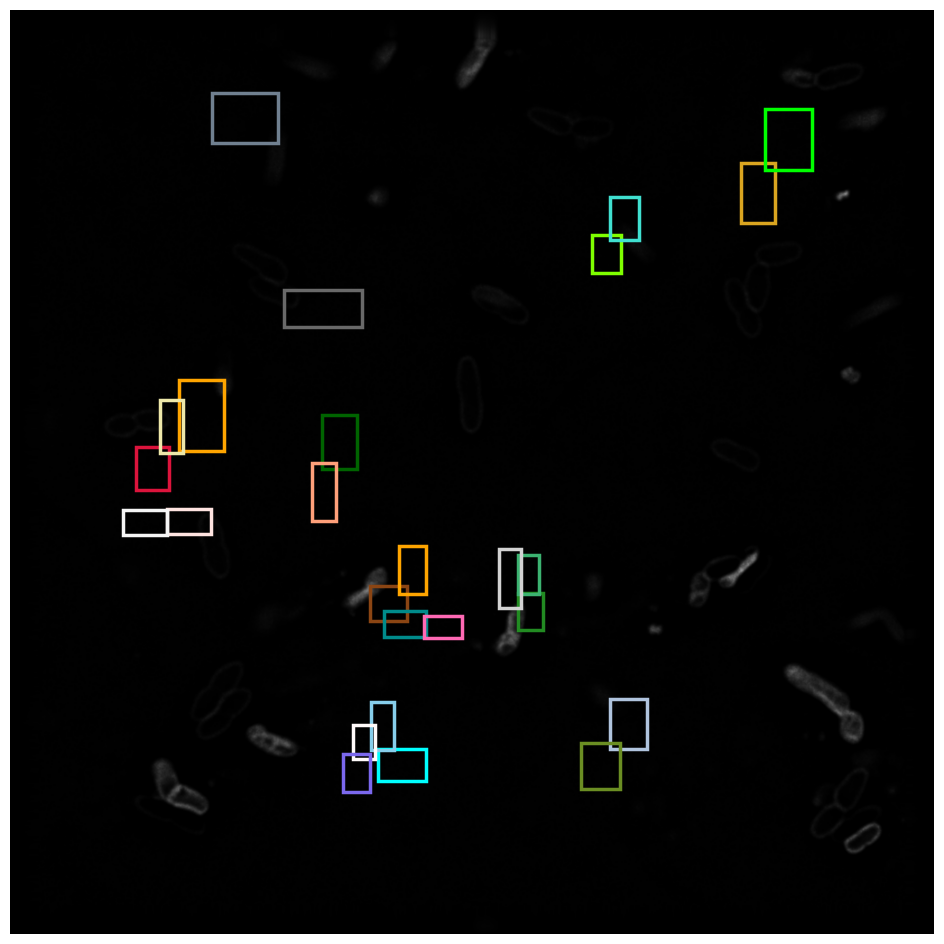

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:54:15.445 | INFO     | test_app:test_ceare_file_model:186 - (23, 21)
2023-04-27 17:54:15.463 | INFO     | test_app:test_ceare_file_model:206 - features shape (23, 22)


image dtype: uint16
final result shape:  (23, 21)
finish
73 20230117_TS008_1hr_1mindye_Col_1x_A_18_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 62ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_co

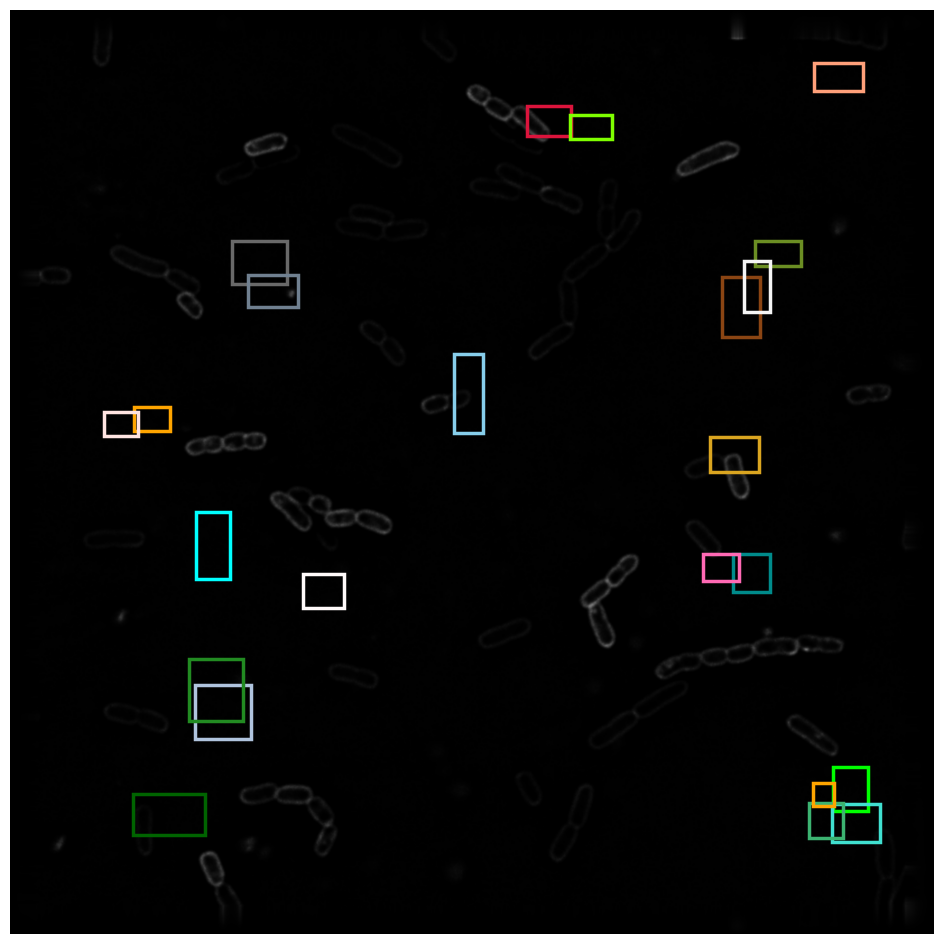

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:55:01.544 | INFO     | test_app:test_ceare_file_model:186 - (45, 21)
2023-04-27 17:55:01.564 | INFO     | test_app:test_ceare_file_model:206 - features shape (45, 22)


image dtype: uint16
final result shape:  (45, 21)
finish
74 20230117_TS008_1hr_1mindye_Col_1x_A_25_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 60ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_co

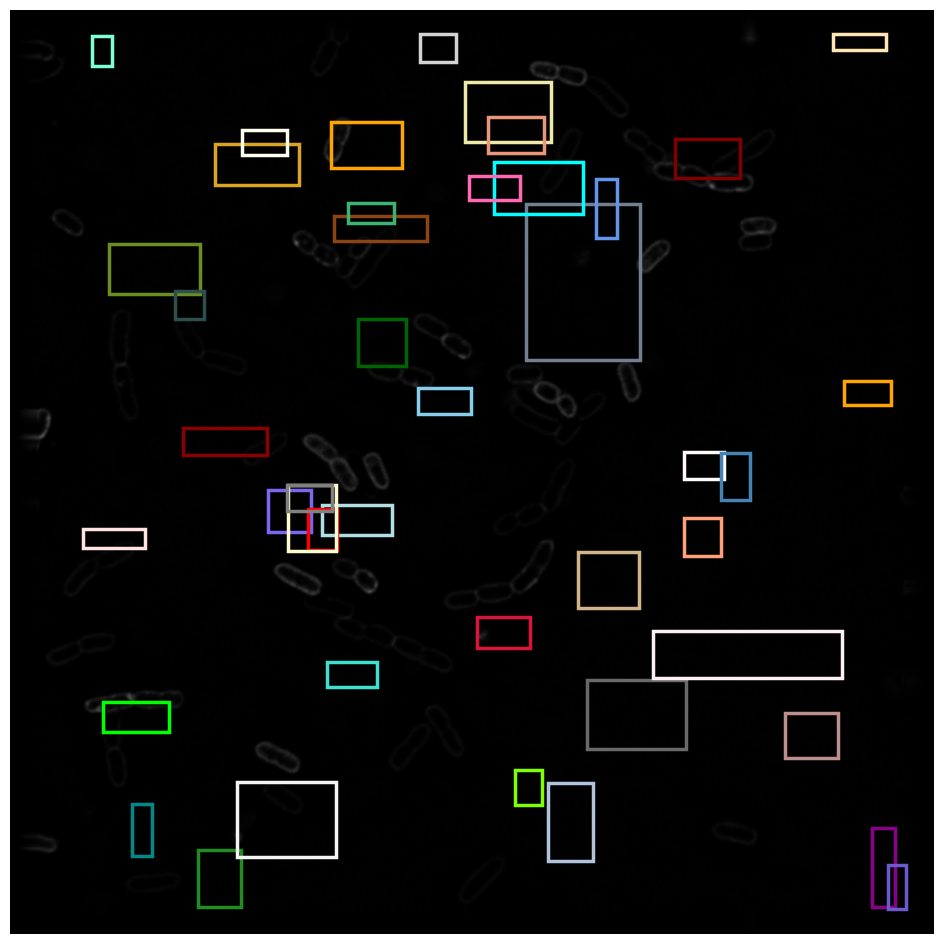

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:55:47.971 | INFO     | test_app:test_ceare_file_model:186 - (50, 21)
2023-04-27 17:55:47.991 | INFO     | test_app:test_ceare_file_model:206 - features shape (50, 22)


image dtype: uint16
final result shape:  (50, 21)
finish
75 20230117_TS008_1hr_1mindye_Col_1x_B_24_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 59ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_co

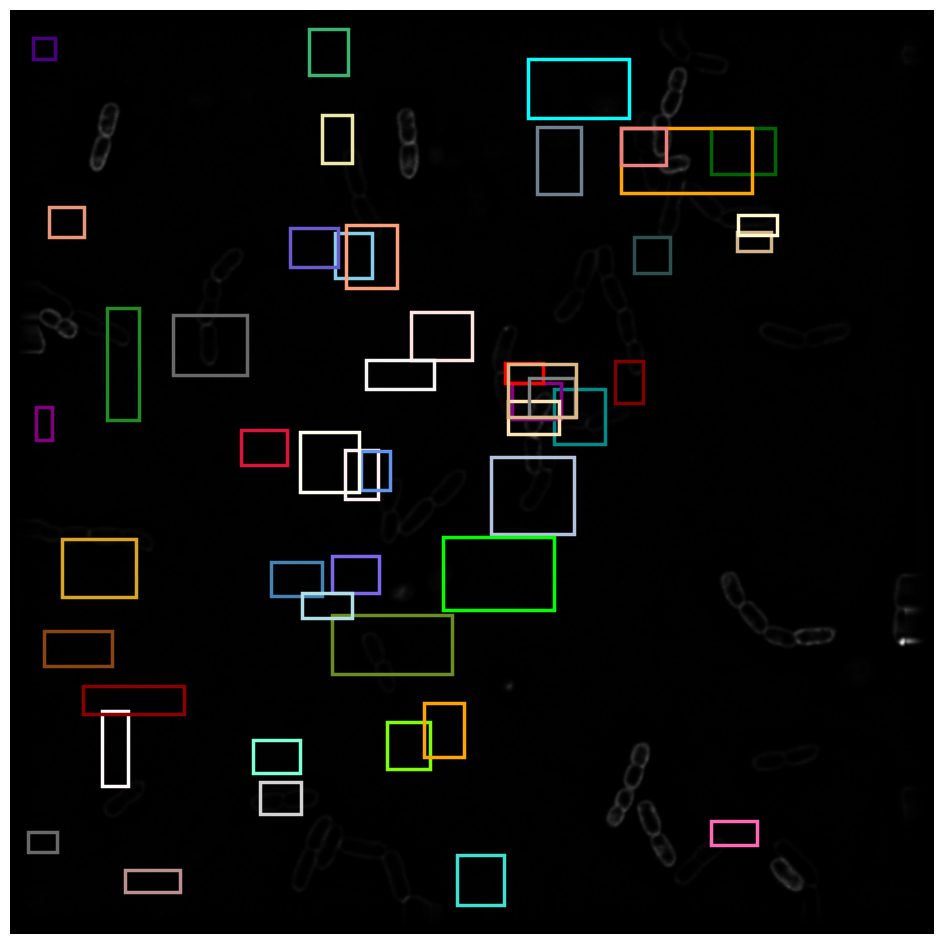

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:56:34.602 | INFO     | test_app:test_ceare_file_model:186 - (38, 21)
2023-04-27 17:56:34.622 | INFO     | test_app:test_ceare_file_model:206 - features shape (38, 22)


image dtype: uint16
final result shape:  (38, 21)
finish
76 20230117_TS008_1hr_1mindye_Col_1x_C_19_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 62ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_co

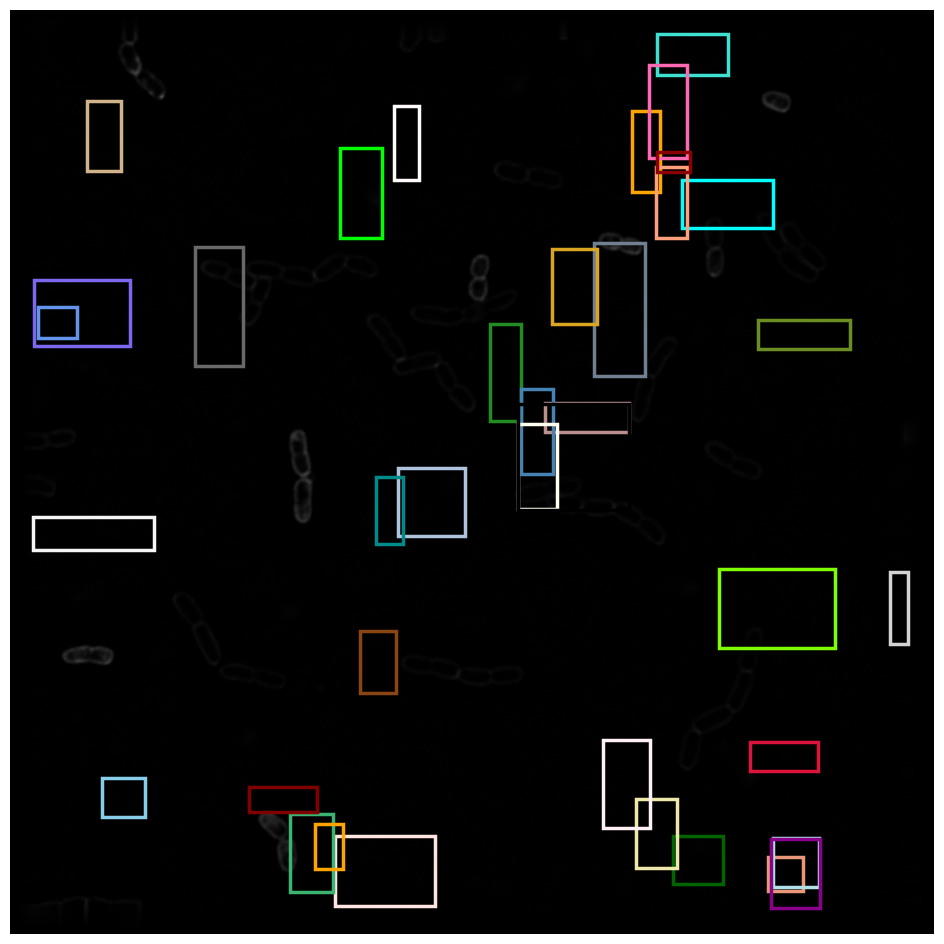

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:57:20.739 | INFO     | test_app:test_ceare_file_model:186 - (25, 21)
2023-04-27 17:57:20.757 | INFO     | test_app:test_ceare_file_model:206 - features shape (25, 22)


image dtype: uint16
final result shape:  (25, 21)
finish
77 20230117_TS008_1hr_1mindye_Col_1x_C_05_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 63ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_co

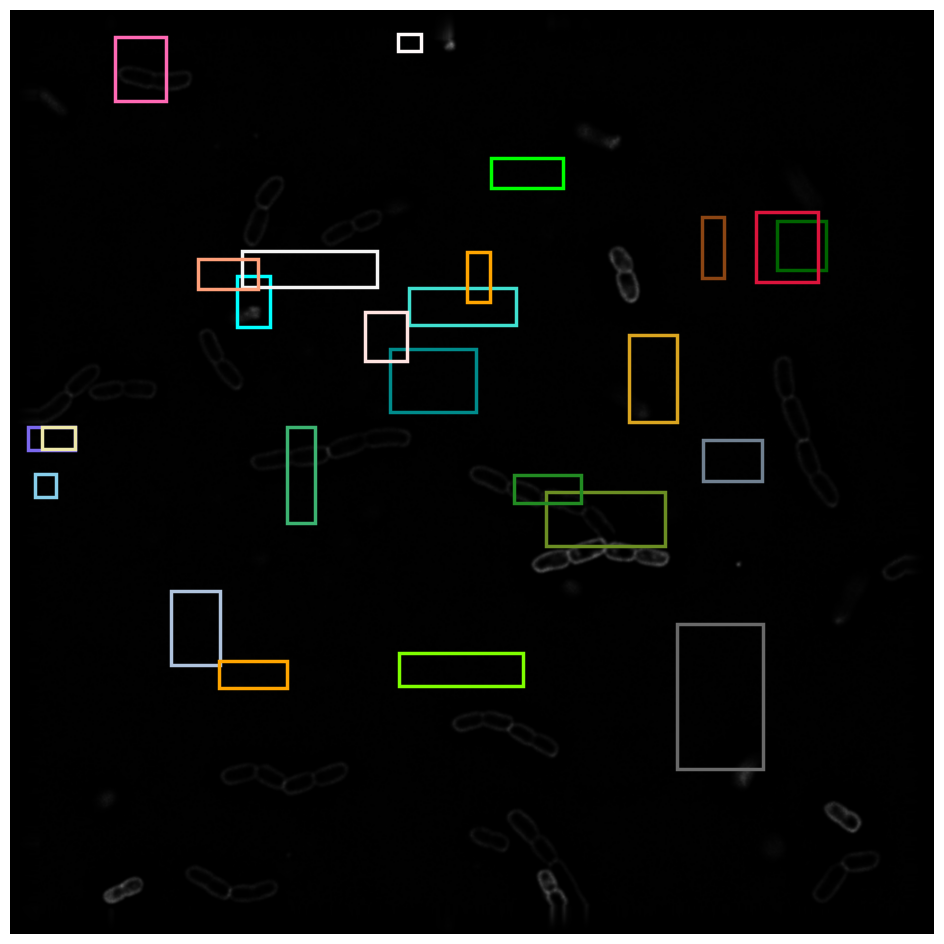

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:58:06.369 | INFO     | test_app:test_ceare_file_model:186 - (19, 21)
2023-04-27 17:58:06.387 | INFO     | test_app:test_ceare_file_model:206 - features shape (19, 22)


image dtype: uint16
final result shape:  (19, 21)
finish
78 20230117_TS008_1hr_1mindye_Col_1x_B_25_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 71ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_co

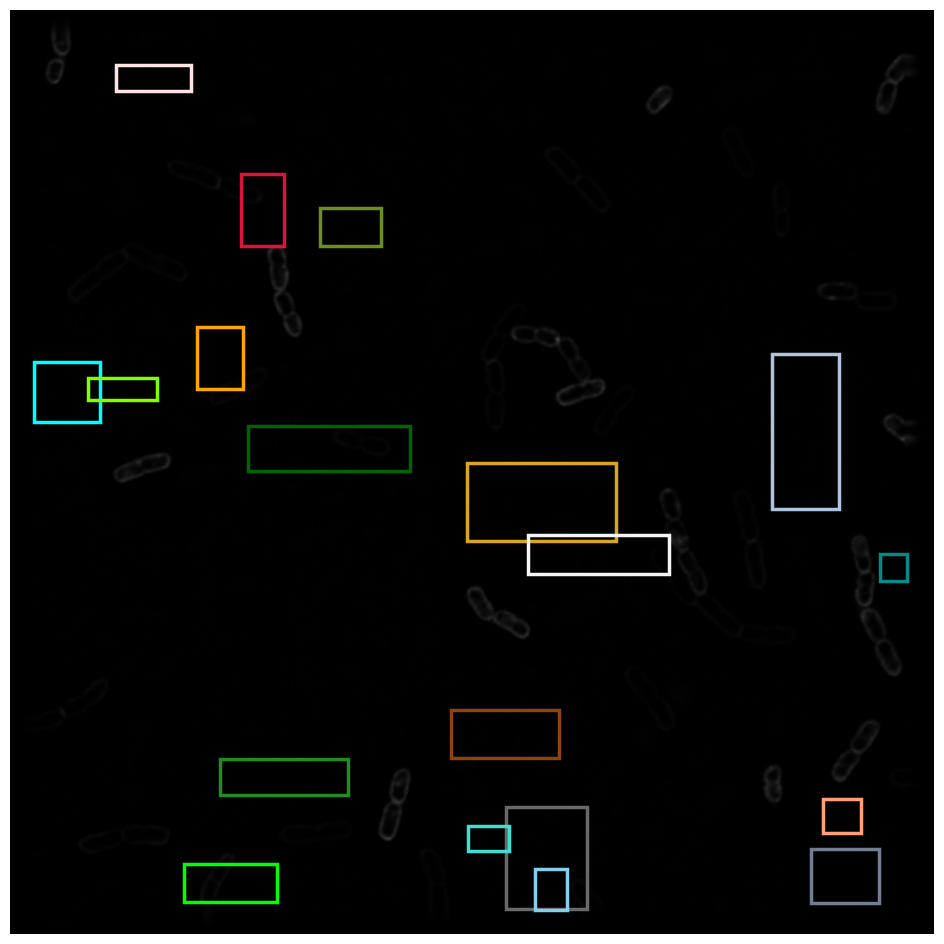

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:58:52.150 | INFO     | test_app:test_ceare_file_model:186 - (35, 21)
2023-04-27 17:58:52.169 | INFO     | test_app:test_ceare_file_model:206 - features shape (35, 22)


image dtype: uint16
final result shape:  (35, 21)
finish
79 20230109_2_TS008_1hr_1mindye_Col_1x_22_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 66ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_co

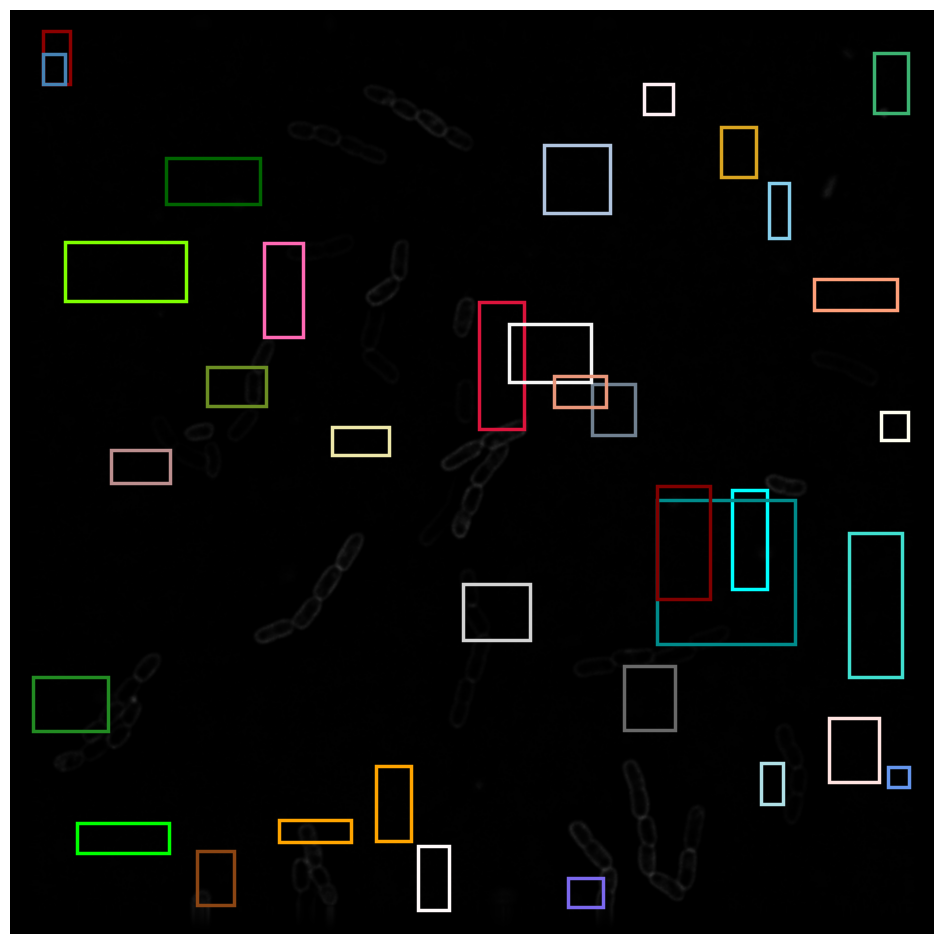

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 17:59:37.326 | INFO     | test_app:test_ceare_file_model:186 - (32, 21)
2023-04-27 17:59:37.345 | INFO     | test_app:test_ceare_file_model:206 - features shape (32, 22)


image dtype: uint16
final result shape:  (32, 21)
finish
80 20230117_TS008_1hr_1mindye_Col_1x_B_19_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 64ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_co

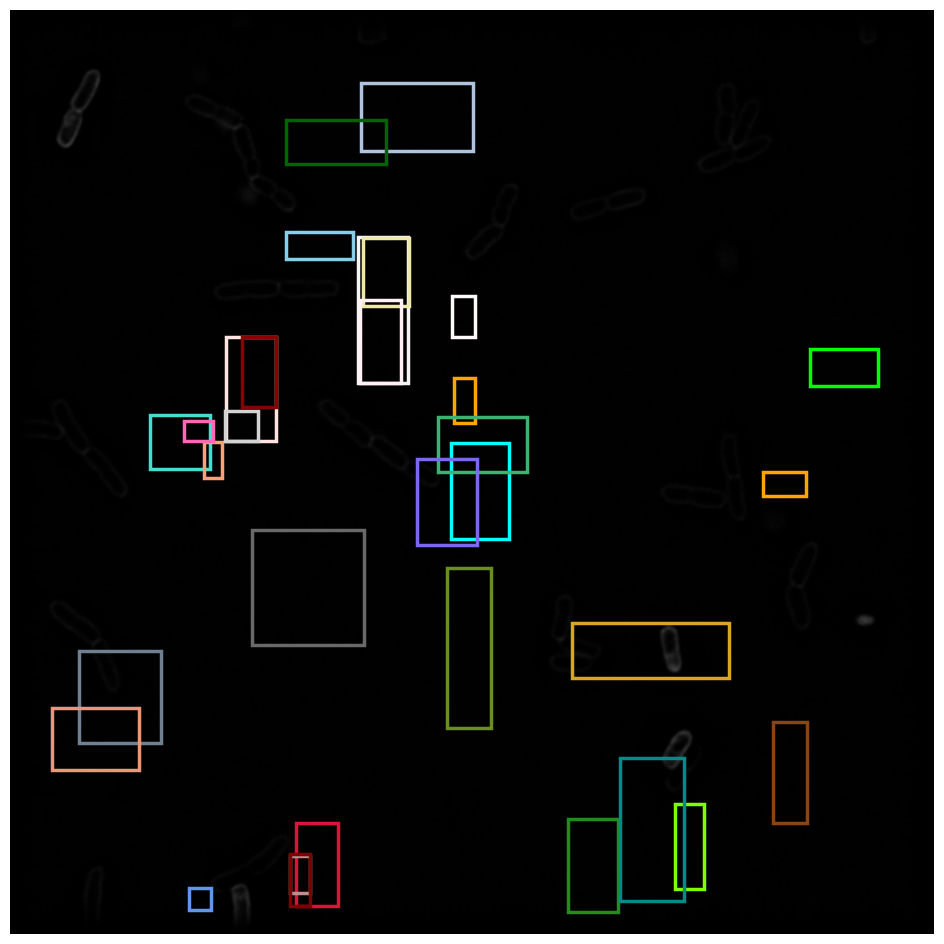

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 18:00:22.201 | INFO     | test_app:test_ceare_file_model:186 - (22, 21)
2023-04-27 18:00:22.219 | INFO     | test_app:test_ceare_file_model:206 - features shape (22, 22)


image dtype: uint16
final result shape:  (22, 21)
finish
81 20230117_TS008_1hr_1mindye_Col_1x_A_22_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 66ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_co

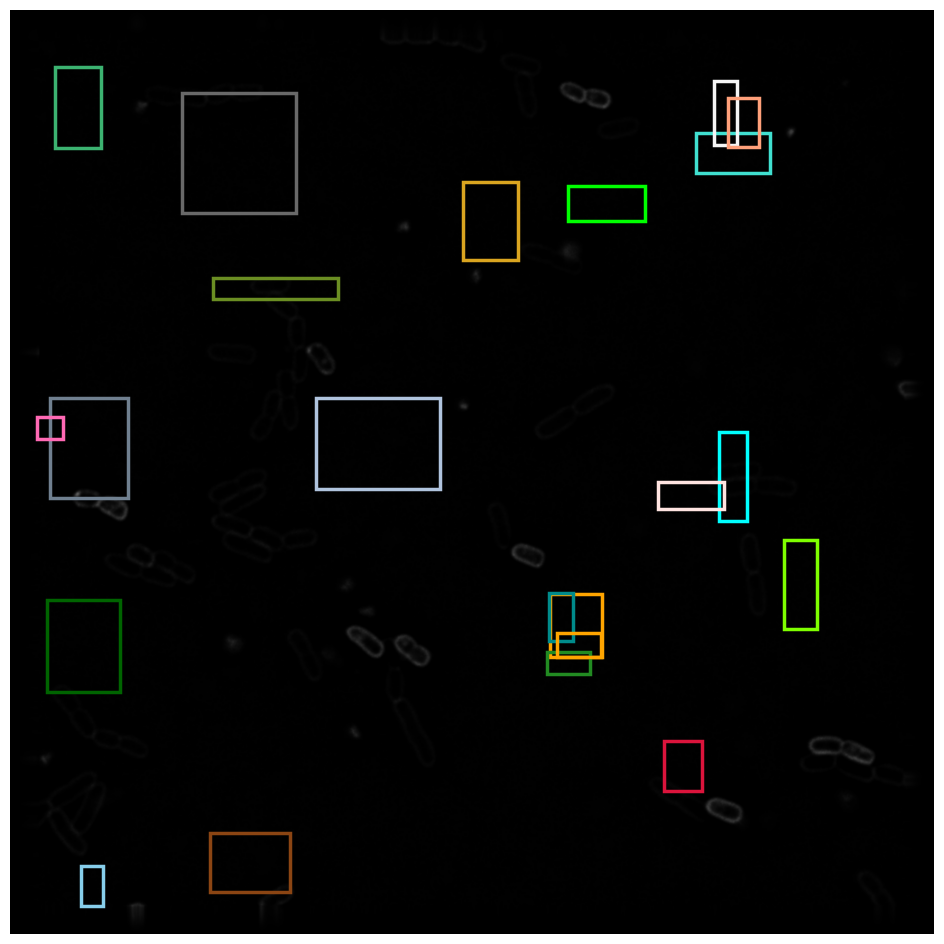

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 18:01:07.892 | INFO     | test_app:test_ceare_file_model:186 - (41, 21)
2023-04-27 18:01:07.912 | INFO     | test_app:test_ceare_file_model:206 - features shape (41, 22)


image dtype: uint16
final result shape:  (41, 21)
finish
82 20230117_TS008_1hr_1mindye_Col_1x_C_16_R3D_D3D_CRC-1.tif
image input dtype uint16
1/1 [==============================] - 0s 68ms/step
load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/yolox_m/best_bbox_mAP_epoch_800.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_co

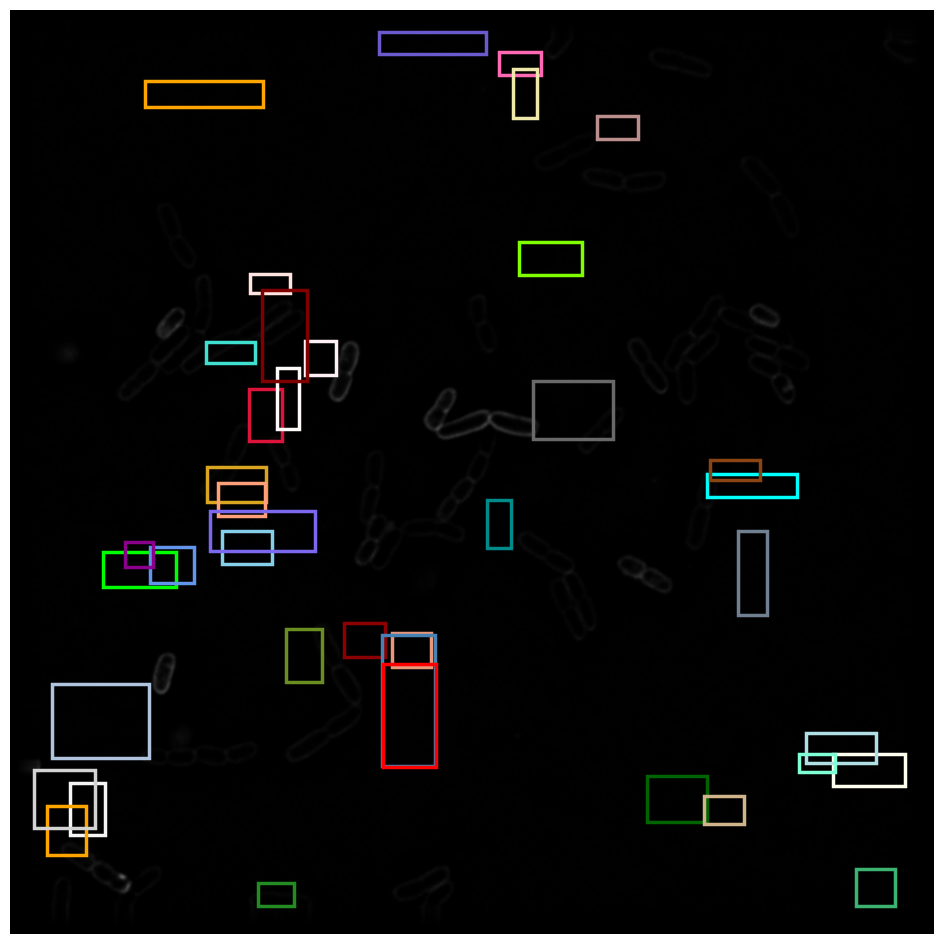

load checkpoint from local path: /home/badboy-002/github/senior_project/web-app/backend/mmdetection/checkpoints/cascade_rcnn_r2_101/best_bbox_mAP_epoch_79.pth


2023-04-27 18:01:53.926 | INFO     | test_app:test_ceare_file_model:186 - (48, 21)
2023-04-27 18:01:53.945 | INFO     | test_app:test_ceare_file_model:206 - features shape (48, 22)


image dtype: uint16
final result shape:  (48, 21)
finish


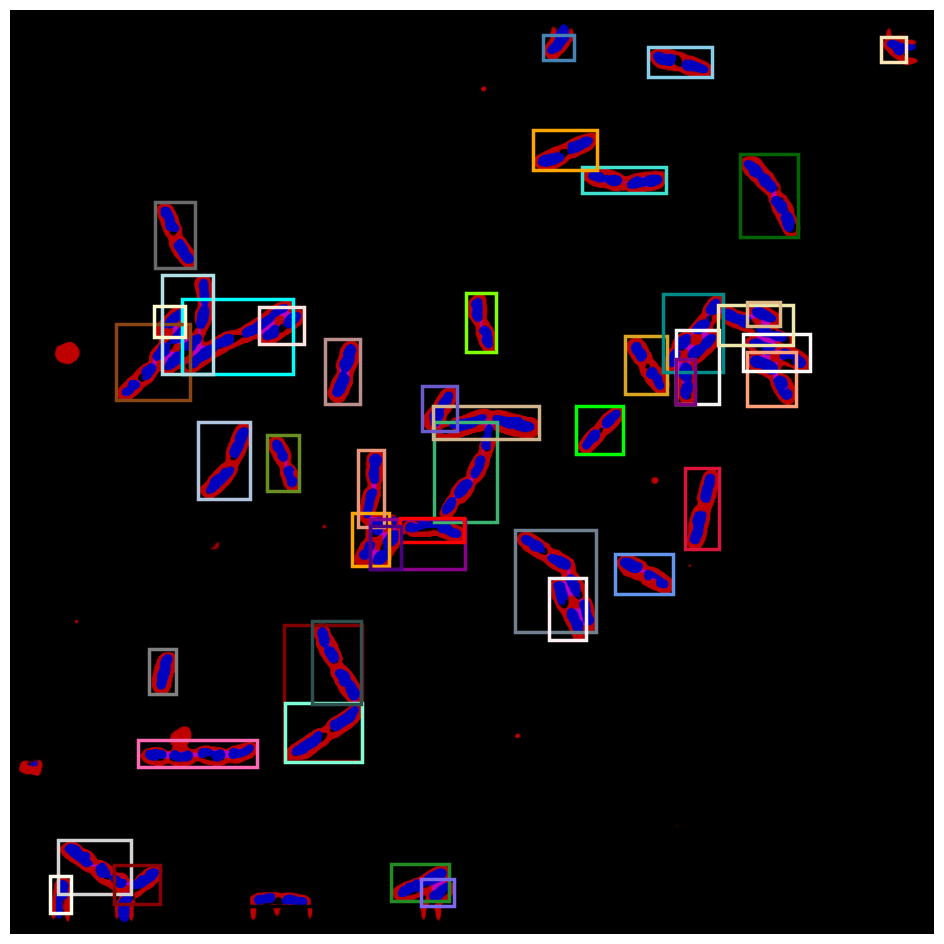

In [7]:
import time
for n, img_path in enumerate(test_img_paths):
    print(n, img_path)
    save_dir = os.path.join(folder_dir, img_path + " (RGB).tif")
    img_path = os.path.join(img_folder_path, img_path)
    test_ceare_file_model(img_path, save_dir)
    time.sleep(5)
    

In [8]:
folder_dir, cp_folder

('/home/badboy-002/github/senior_project/web-app/backend/resource/features_extraction_results',
 '/home/badboy-002/github/senior_project/web-app/backend/cell_profiler_features_result')

In [9]:
dl_results = glob(str(Path(folder_dir) / "**/*.csv"), recursive=True)

In [10]:
cp_result = pd.read_csv(cp_results[0])
cp_result.columns

Index(['label', 'image', 'AreaShape_MajorAxisLength_x',
       'AreaShape_MajorAxisLength_y', 'AreaShape_MinorAxisLength_x',
       'AreaShape_MinorAxisLength_y', 'AreaShape_Area_x', 'AreaShape_Area_y',
       'AreaShape_Perimeter_x', 'AreaShape_Perimeter_y',
       'Intensity_MinIntensity_CRC_Blue_y',
       'Intensity_MeanIntensity_CRC_Blue_y',
       'Intensity_StdIntensity_CRC_Blue_y',
       'Intensity_MedianIntensity_CRC_Blue_y',
       'Intensity_MaxIntensity_CRC_Blue_y',
       'Intensity_MinIntensity_CRC_Green_y',
       'Intensity_MeanIntensity_CRC_Green_y',
       'Intensity_StdIntensity_CRC_Green_y',
       'Intensity_MedianIntensity_CRC_Green_y',
       'Intensity_MaxIntensity_CRC_Green_y'],
      dtype='object')

In [11]:
dl_result = pd.read_csv(dl_results[0])
dl_result.columns

Index(['Membrane ID', 'Membrane Area', 'Membrane Perimeter', 'Membrane Length',
       'Membrane Width', 'DNA Perimeter', 'DNA Area', 'DNA Width',
       'DNA Length', 'Membrane Position', 'No. of nucleoids',
       'Green Max Intensity', 'Green Min Intensity', 'Green Mean Intensity',
       'Green Median Intensity', 'Green STD Intensity', 'Blue Max Intensity',
       'Blue Min Intensity', 'Blue Mean Intensity', 'Blue Median Intensity',
       'Blue STD Intensity', 'file_name'],
      dtype='object')

In [12]:
mapping_columns ={
    'AreaShape_MajorAxisLength_x' : 'DNA Length',
    'AreaShape_MajorAxisLength_y' : 'Membrane Length',
    'AreaShape_MinorAxisLength_x' : 'DNA Width',
    'AreaShape_MinorAxisLength_y' : 'Membrane Width',
    'AreaShape_Area_x' : 'DNA Area',
    'AreaShape_Area_y' : 'Membrane Area',
    'AreaShape_Perimeter_x' : 'DNA Perimeter',
    'AreaShape_Perimeter_y' : 'Membrane Perimeter',
    'Intensity_MinIntensity_CRC_Blue_y': 'Blue Min Intensity',
    'Intensity_MeanIntensity_CRC_Blue_y': 'Blue Mean Intensity',
    'Intensity_StdIntensity_CRC_Blue_y': 'Blue STD Intensity',
    'Intensity_MedianIntensity_CRC_Blue_y': 'Blue Median Intensity',
    'Intensity_MaxIntensity_CRC_Blue_y': 'Blue Max Intensity',
    'Intensity_MinIntensity_CRC_Green_y': 'Green Min Intensity',
    'Intensity_MeanIntensity_CRC_Green_y': 'Green Mean Intensity',
    'Intensity_StdIntensity_CRC_Green_y': 'Green STD Intensity',
    'Intensity_MedianIntensity_CRC_Green_y': 'Green Median Intensity',
    'Intensity_MaxIntensity_CRC_Green_y': 'Green Max Intensity',   
}

In [13]:
mapping_columns.values()

dict_values(['DNA Length', 'Membrane Length', 'DNA Width', 'Membrane Width', 'DNA Area', 'Membrane Area', 'DNA Perimeter', 'Membrane Perimeter', 'Blue Min Intensity', 'Blue Mean Intensity', 'Blue STD Intensity', 'Blue Median Intensity', 'Blue Max Intensity', 'Green Min Intensity', 'Green Mean Intensity', 'Green STD Intensity', 'Green Median Intensity', 'Green Max Intensity'])

In [14]:
cp_result = cp_result.rename(columns=mapping_columns)

In [15]:
intensity_feat = ['Blue Min Intensity', 'Blue Mean Intensity', 'Blue STD Intensity', 'Blue Median Intensity', 'Blue Max Intensity', 'Green Min Intensity', 'Green Mean Intensity', 'Green STD Intensity', 'Green Median Intensity', 'Green Max Intensity']
len(intensity_feat)
for feat in intensity_feat:
    dl_result[feat] = dl_result[feat].apply(lambda x : x/255)

In [16]:
dl_val = dl_result.describe().loc['mean'].sort_index().values

In [17]:
cp_val = cp_result.describe().loc['mean'].sort_index().values

In [18]:
# root mean square
import math 
def rMSE(a, b):
    return math.sqrt((a-b)^2)

